# 2022.03.23.

In [1]:
import sys

full_path_to_modul_dir = 'D:\mcbj_stmbj'  # here enter the full path to the directory that contains the modul on your computer
sys.path.append(full_path_to_modul_dir)

In [2]:
from mcbj import *
from pca_and_ml import *
from noise import *
from IPython.display import display, Markdown
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, StrMethodFormatter
from matplotlib.ticker import AutoMinorLocator, MultipleLocator, LogLocator
import pandas as pd

import plots

date = "22_03_23"
sample_rate = 50_000
home_folder = Path(f"D:/BJ_Data/{date}")
# home_folder = Path(f"//DATACENTER/BreakJunction_group/BJ_Data/{date}")

In [3]:
rcParams['figure.constrained_layout.use'] = False
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = ['Times New Roman']
rcParams['mathtext.fontset'] = 'stix'
rcParams['mathtext.rm'] = 'serif'
rcParams['xtick.direction'] = 'in'
rcParams['ytick.direction'] = 'in'
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['xtick.major.pad'] = 4
rcParams['xtick.minor.pad'] = 0.5
rcParams['ytick.major.pad'] = 2
rcParams['ytick.minor.pad'] = 0.5
rcParams['axes.labelsize'] = 10
rcParams['axes.titlepad'] = 8.0
rcParams['axes.labelpad'] = 2.0
rcParams['agg.path.chunksize'] = 10000

In [4]:
rcParams['font.size'] = 14
rcParams['ytick.labelsize'] = 10
rcParams['xtick.labelsize'] = 10
rcParams['axes.labelsize'] = 10

In [5]:
from matplotlib.collections import LineCollection

cmap_geo32_opaque = ListedColormap(np.array([[255 / 255, 255 / 255, 255 / 255, 1],
                                             [255 / 255, 235 / 255, 235 / 255, 1],
                                             [255 / 255, 215 / 255, 215 / 255, 1],
                                             [255 / 255, 196 / 255, 196 / 255, 1],
                                             [245 / 255, 179 / 255, 174 / 255, 1],
                                             [255 / 255, 158 / 255, 158 / 255, 1],
                                             [255 / 255, 124 / 255, 124 / 255, 1],
                                             [255 / 255, 90 / 255, 90 / 255, 1],
                                             [238 / 255, 80 / 255, 78 / 255, 1],
                                             [244 / 255, 117 / 255, 75 / 255, 1],
                                             [255 / 255, 160 / 255, 69 / 255, 1],
                                             [255 / 255, 189 / 255, 87 / 255, 1],
                                             [247 / 255, 215 / 255, 104 / 255, 1],
                                             [240 / 255, 236 / 255, 121 / 255, 1],
                                             [223 / 255, 245 / 255, 141 / 255, 1],
                                             [205 / 255, 255 / 255, 162 / 255, 1],
                                             [172 / 255, 245 / 255, 168 / 255, 1],
                                             [138 / 255, 236 / 255, 174 / 255, 1],
                                             [124 / 255, 235 / 255, 200 / 255, 1],
                                             [106 / 255, 235 / 255, 225 / 255, 1],
                                             [97 / 255, 225 / 255, 240 / 255, 1],
                                             [68 / 255, 202 / 255, 255 / 255, 1],
                                             [50 / 255, 190 / 255, 255 / 255, 1],
                                             [25 / 255, 175 / 255, 255 / 255, 1],
                                             [13 / 255, 129 / 255, 248 / 255, 1],
                                             [26 / 255, 102 / 255, 240 / 255, 1],
                                             [0 / 255, 40 / 255, 224 / 255, 1],
                                             [0 / 255, 25 / 255, 212 / 255, 1],
                                             [0 / 255, 10 / 255, 200 / 255, 1],
                                             [20 / 255, 5 / 255, 175 / 255, 1],
                                             [40 / 255, 0 / 255, 150 / 255, 1],
                                             [10 / 255, 0 / 255, 121 / 255, 1]]))

In [6]:
before_evap = np.arange(start=1, stop=20201, step=1)
after_evap = np.arange(start=36002, stop=56200, step=1)
all_traces = np.hstack((before_evap, after_evap))

## Before evaporation

In [20]:
hist_au = Histogram(folder=home_folder,
                    traces=before_evap,
                    conductance_range=(1e-5, 10),  # 4.229e-5
                    conductance_bins_num=20,
                    conductance_bins_mode='decade')

In [21]:
hist_au.calc_stats(align_at=0.1,
                   range_pull=(-0.25, 0.6),
                   range_push=(-0.5, 1.5))

  0%|          | 0/20200 [00:00<?, ?it/s]

Pull 2D histogram created from 20200 traces
Push 2D histogram created from 20200 traces


(0.0, 400.0)

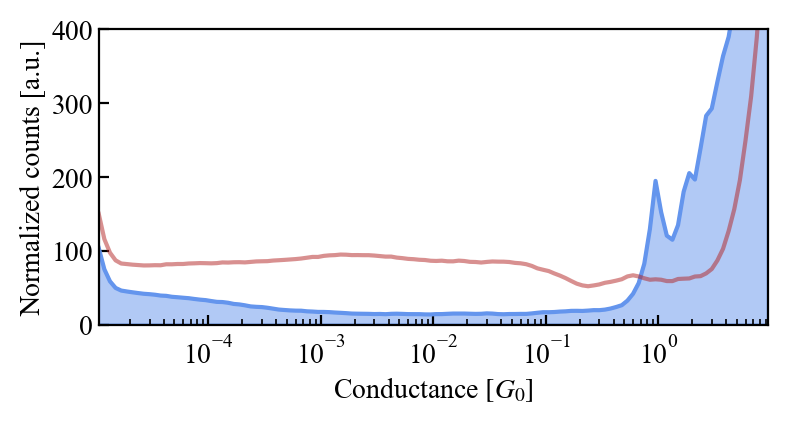

In [22]:
ax = hist_au.plot_hist_1d(dpi=200)
ax.set_ylim(0, 400)

(<AxesSubplot:xlabel='Trace number', ylabel='Conductance $[G_{0}]$'>,
 <AxesSubplot:xlabel='Trace number', ylabel='Conductance $[G_{0}]$'>)

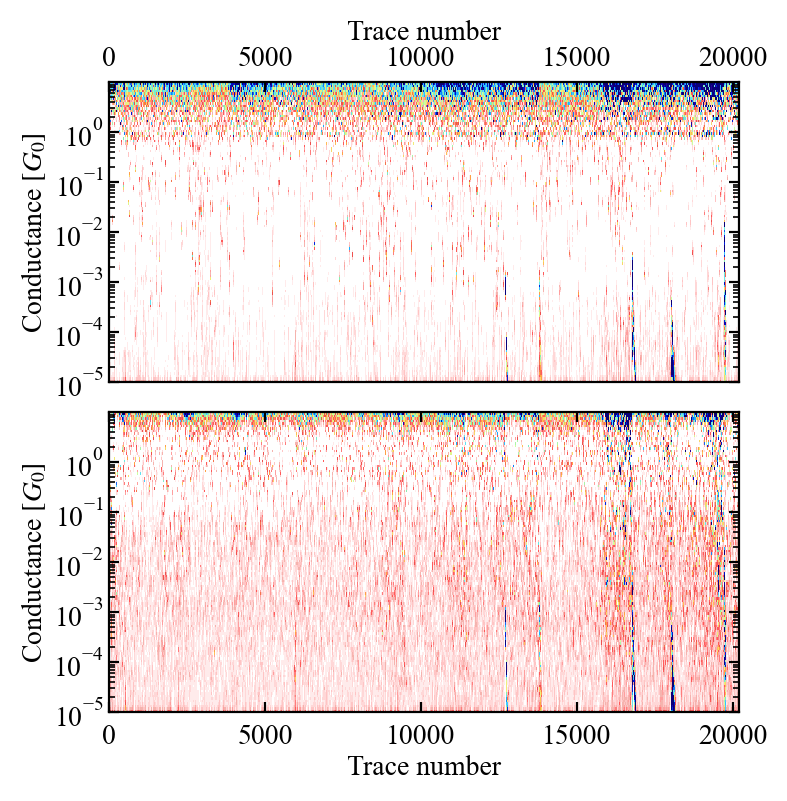

In [23]:
hist_au.plot_temporal_hist(dpi=200, vmax_pull=1000, vmax_push=1000)

(<AxesSubplot:xlabel='Piezo [V]', ylabel='Conductance $[G_{0}]$'>,
 <AxesSubplot:xlabel='Piezo [V]', ylabel='Conductance $[G_{0}]$'>)

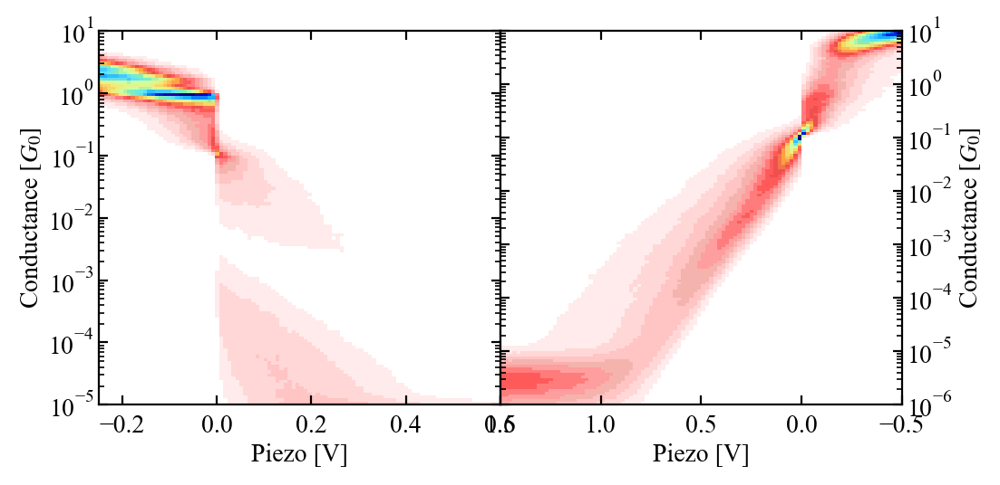

In [12]:
hist_au.plot_hist_2d_both(dpi=200)

8.0

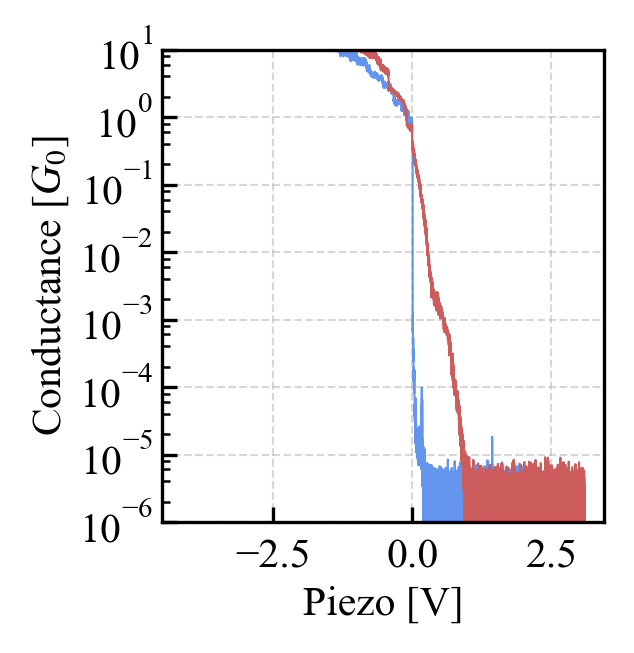

In [13]:
trace_pair = TracePair(17066, load_from=home_folder)
trace_pair.align_trace(align_at=0.5)
trace_pair.plot_trace_pair(dpi=300, aligned=True)

trace_pair.rate

In [7]:
def hist_1d_demo(hist: Histogram,
                 traces: Union[int, list, np.array, Tuple[int, ...]],
                 how='random', shift = 1, shift_0=0,
                 figsize=utils.cm2inch(7, 4), dpi=200,
                 hist_style: str = 'area', cmap='Blues', my_label=None,
                 axes: Optional[Tuple[matplotlib.axes.Axes, matplotlib.axes.Axes, matplotlib.axes.Axes, matplotlib.axes.Axes]]= None, fig = None):
                 # add_par_axis = False):
      
    if isinstance(traces, int):
        if how=='random':
            traces = np.random.choice(hist.traces, traces)      
        elif how=='equal':
            tot_num = hist.traces.shape[0]
            traces = np.linspace(0, tot_num-1, 10, endpoint=True, dtype=int)
        print(f'Plotted traces: {traces}')
    
    selected_colors = colormaps[cmap](np.linspace(0.5, 0.8, len(traces)))
    
    # load each tracepair
    trace_pairs_loaded = [TracePair(i, load_from=hist.folder) for i in traces]
    # align each trace at hist.align_at
    for i in range(len(trace_pairs_loaded)):
        trace_pairs_loaded[i].align_trace(align_at=hist.align_at)
    
    if axes is None:
        fig = plt.figure(figsize=figsize, dpi=dpi)
        gs = plt.GridSpec(1, 2, figure=fig,
                          left=0.08, right=0.92, top=0.9, bottom=0.13, width_ratios=(5, 3),
                          hspace=0, wspace=0.2)
        
        gs_singles = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(3, 2),
                                                      subplot_spec=gs[0],
                                                      wspace=0, hspace=0)
        
        gs_totals = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(2, 1),
                                                     subplot_spec=gs[1],
                                                     wspace=0.1, hspace=0)
        
        ax_traces = fig.add_subplot(gs_singles[0])
        ax_singles = fig.add_subplot(gs_singles[1])
        ax_hist_bot = fig.add_subplot(gs_totals[0])
        ax_hist_top = fig.add_subplot(gs_totals[1])
    else:
        if len(axes) != 4:
            raise ValueError(f'Len of axes not okay, got {len(axes)} instead of 4.')
        
        ax_traces = axes[0]
        ax_singles = axes[1]
        ax_hist_bot = axes[2]
        ax_hist_top = axes[3]

    ax_hist_top.yaxis.tick_right()
    ax_hist_top.yaxis.set_label_position('right')

    for ax in (ax_traces, ax_singles, ax_hist_bot, ax_hist_top):
        ax.set_ylim(10**np.round(min(np.log10(hist.hist_1d_bins))), 10**np.round(max(np.log10(hist.hist_1d_bins))))

    ax_traces.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=True, labelright=False,
                          labeltop=True, labelbottom=True)

    ax_singles.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=False,
                           labeltop=True, labelbottom=True)

#     ax_hist_bot.tick_params(which='both', left=True, right=False, top=True, bottom=True, labelleft=False, labelright=False,
#                             labeltop=True, labelbottom=True)
    
#     ax_hist_top.tick_params(which='both', left=False, right=True, top=True, bottom=True, labelleft=False, labelright=True,
#                             labeltop=True, labelbottom=True)
    
    ax_hist_bot.spines[['right']].set_visible(False)
    ax_hist_top.spines[['left']].set_visible(False)

    for i, trace in enumerate(traces):
        ax_traces.plot(trace_pairs_loaded[i].aligned_piezo_pull+ i*shift + shift_0, trace_pairs_loaded[i].conductance_pull, lw=0.5, c=selected_colors[i], label=my_label, zorder=-1)
        # ax_singles.barh(hist.hist_1d_bins[:-1], width=hist.temporal_hist_pull[np.where(hist.traces == trace)[0][0]][:-1]/hist.traces.shape[0], height=np.diff(hist.hist_1d_bins), alpha=0.6)
        ax_singles.barh(hist.hist_1d_bins[:-1], width=hist.temporal_hist_pull[np.where(hist.traces == trace)[0][0]][:-1], height=np.diff(hist.hist_1d_bins), alpha=0.6, color=selected_colors[i])
    
    if hist_style == 'area':
        ax_hist_bot.fill_betweenx(hist.hist_1d_bins, hist.hist_1d_pull, lw=0.5, alpha=0.5, color=selected_colors[-1], label=my_label)
        ax_hist_top.fill_betweenx(hist.hist_1d_bins, hist.hist_1d_pull, lw=0.5, alpha=0.5, color=selected_colors[-1], label=my_label)
    elif hist_style == 'line':
        ax_hist_bot.plot(hist.hist_1d_pull, hist.hist_1d_bins, lw=0.7, c=selected_colors[-1], label=my_label)
        ax_hist_top.plot(hist.hist_1d_pull, hist.hist_1d_bins, lw=0.7, c=selected_colors[-1], label=my_label)
    ax_hist_bot.set_xlim(0, 50)
    ax_hist_top.set_xlim(50, 600)

    ax_traces.set_xlim(-1)
    
    if my_label is not None:
        ax_traces.legend(fontsize=10, frameon=False, loc='upper right', bbox_to_anchor=(0.99, 0.75), handlelength=0.75)
        ax_hist_top.legend(fontsize=10, frameon=False, loc='upper right', bbox_to_anchor=(0.99, 0.75), handlelength=0.75)
    
#     if add_par_axis == 'add':
#         par_ax_hist_bot = ax_hist_bot.twiny()
#         par_ax_hist_top = ax_hist_top.twiny()
#         return ax_traces, ax_singles, ax_hist_bot, ax_hist_top, par_ax_hist_bot, par_ax_hist_top
    
#     if add_par_axis=='use':
#         return ax_traces, ax_singles, ax_hist_bot, ax_hist_top, ax_hist_bot, ax_hist_top
    
    return fig, ax_traces, ax_singles, ax_hist_bot, ax_hist_top

In [15]:
# hist_1d_demo(hist=hist_au, traces=5, figsize=utils.cm2inch(12, 6))

In [16]:
hist_au.temporal_hist_pull.shape

(20200, 120)

In [17]:
hist_au_1 = Histogram(folder=home_folder,
                      traces=before_evap,
                      conductance_log_scale=False,
                      conductance_range=(0, 10),  # 4.229e-5
                      conductance_bins_num=100,
                      conductance_bins_mode='total')

In [18]:
hist_au_1.calc_stats(align_at=0.5,
                     range_pull=(-1, 1),
                     range_push=(-0.5, 1.5))

  0%|          | 0/20200 [00:00<?, ?it/s]

D:\mcbj_stmbj\utils.py:913: RuntimeWarning: divide by zero encountered in log10
  ybins = np.logspace(np.log10(yrange[0]), np.log10(yrange[1]), num=int(num_bins[1]) + 1, base=10)
D:\mcbj_stmbj\venv\lib\site-packages\numpy\core\function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
D:\mcbj_stmbj\venv\lib\site-packages\numpy\core\function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start


Pull 2D histogram created from 20200 traces
Push 2D histogram created from 20200 traces


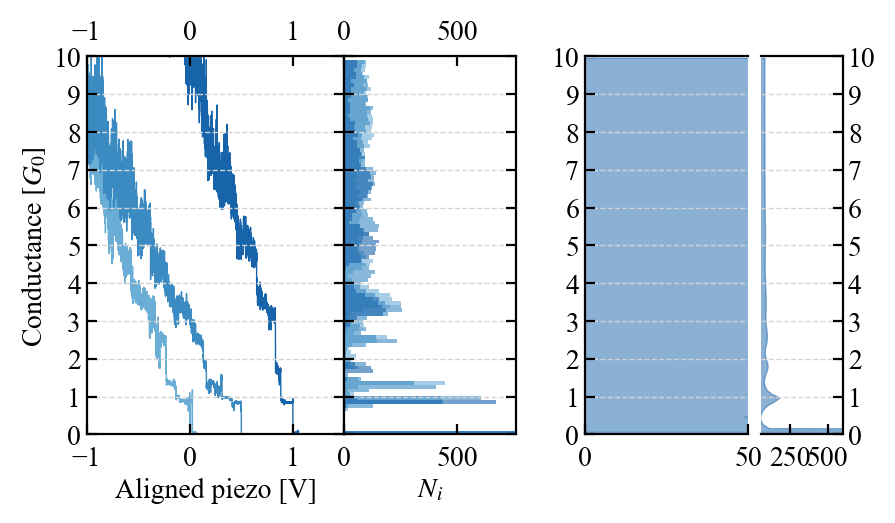

In [19]:
fig, ax_traces, ax_singles, ax_hist_bot, ax_hist_top = hist_1d_demo(hist=hist_au_1, traces=(13055, 17712, 4206), figsize=utils.cm2inch(12, 6), shift=0.5) # (16619, 13055, 17712, 4206, 9419, 5836)
ax_traces.set_xlim(-1, 1.5)
# ax_hist.set_xlim(0, 200)
ax_singles.set_xlim(0, 760)

# ax_hist.set_xlim(0, 25)
# ax_singles.set_xlim(0, 180)

ax_traces.set_ylabel(r'Conductance $[G_{0}]$')
# ax_hist.set_ylabel(r'Conductance $[G_{0}]$', rotation=270, labelpad=6)

ax_traces.set_xlabel(r'Aligned piezo [V]')
ax_singles.set_xlabel(r'$N_{i}$')
# ax_hist.set_xlabel(r'$\langle N_{i} \rangle$')

for ax in (ax_traces, ax_hist_bot, ax_hist_top, ax_singles):
    ax.set_yticks(np.arange(0, 11, 1))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)

*****************************************************

Plotted traces: [ 7626 10385 13089 12638]


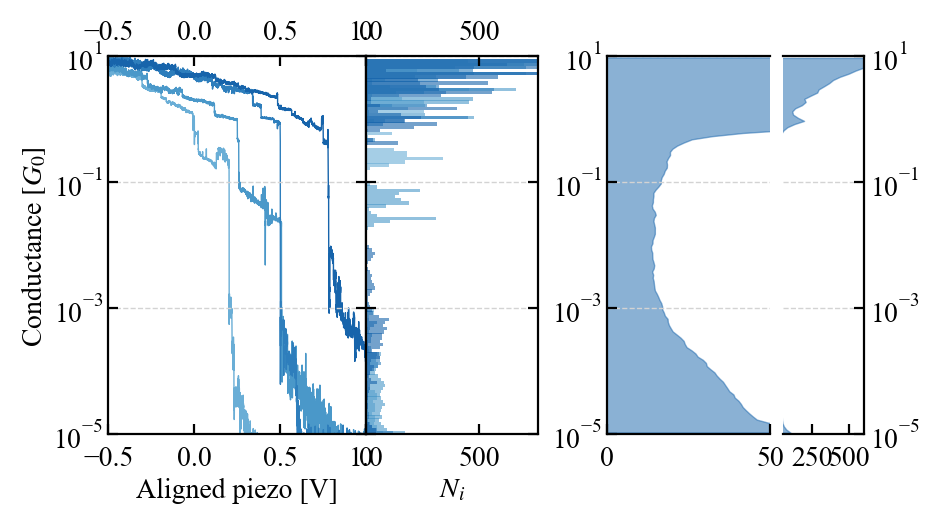

In [20]:
fig, ax_traces, ax_singles, ax_hist_bot, ax_hist_top = hist_1d_demo(hist=hist_au, traces=4, figsize=utils.cm2inch(12, 6), shift=0.25) # (16619, 13055, 17712, 4206, 9419, 5836)

ax_traces.set_xlim(-0.5, 1)
# ax_hist.set_xlim(0, 220)
ax_singles.set_xlim(0, 760)

# ax_hist.set_xlim(0, 25)
# ax_singles.set_xlim(0, 180)

ax_traces.set_ylabel(r'Conductance $[G_{0}]$')
# ax_hist.set_ylabel(r'Conductance $[G_{0}]$', rotation=270, labelpad=6)

ax_traces.set_xlabel(r'Aligned piezo [V]')
ax_singles.set_xlabel(r'$N_{i}$')
# ax_hist.set_xlabel(r'$\langle N_{i} \rangle$')

for ax in (ax_traces, ax_hist_bot, ax_hist_top, ax_singles):
    ax.set_yscale('log')
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)

In [21]:
hist_bpy = Histogram(folder=home_folder,
                     traces=after_evap,
                     conductance_range=(1e-5, 10),  # 4.229e-5
                     conductance_bins_num=20,
                     conductance_bins_mode='decade')

In [22]:
hist_bpy.calc_stats(align_at=0.2,
                    range_pull=(-0.25, 0.6),
                    range_push=(-0.25, 1.5))

  0%|          | 0/20198 [00:00<?, ?it/s]

Pull 2D histogram created from 20198 traces
Push 2D histogram created from 20198 traces


In [23]:
# hist_bpy.plot_temporal_hist(dpi=200, vmax_pull=1000, vmax_push=1000)

(<AxesSubplot:xlabel='Piezo [V]', ylabel='Conductance $[G_{0}]$'>,
 <AxesSubplot:xlabel='Piezo [V]', ylabel='Conductance $[G_{0}]$'>)

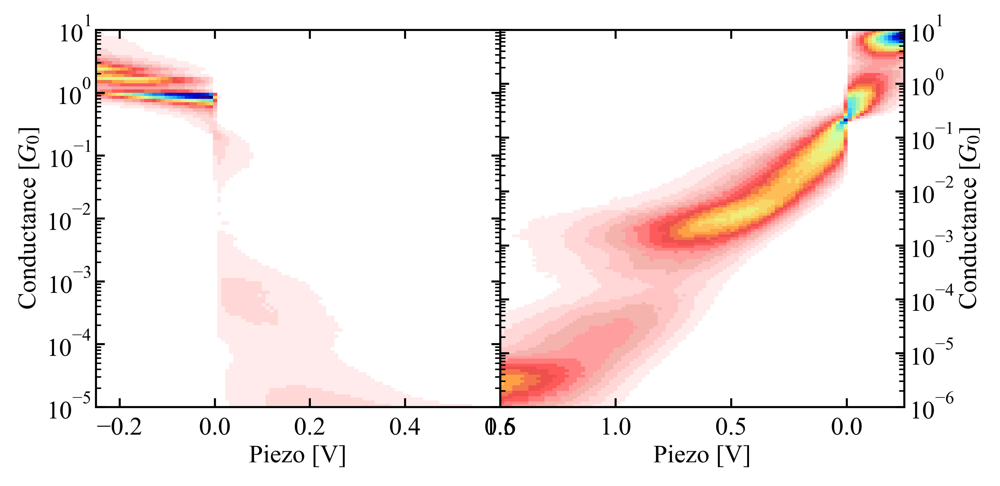

In [24]:
hist_bpy.plot_hist_2d_both()

In [25]:
hist_bpy_8000_1 = Histogram(folder=home_folder,
                          traces=after_evap[:8000],
                          conductance_range=(1e-6, 10),  # 4.229e-5
                          conductance_bins_num=100,
                          conductance_bins_mode='decade')

In [26]:
hist_bpy_8000_1.calc_stats(align_at=0.1,
                           range_pull=(-0.2, 0.4),
                           range_push=(-0.25, 1.5),
                           xbins_pull=200)

  0%|          | 0/8000 [00:00<?, ?it/s]

Pull 2D histogram created from 8000 traces
Push 2D histogram created from 8000 traces


(<AxesSubplot:xlabel='Trace number', ylabel='Conductance $[G_{0}]$'>,
 <AxesSubplot:xlabel='Trace number', ylabel='Conductance $[G_{0}]$'>)

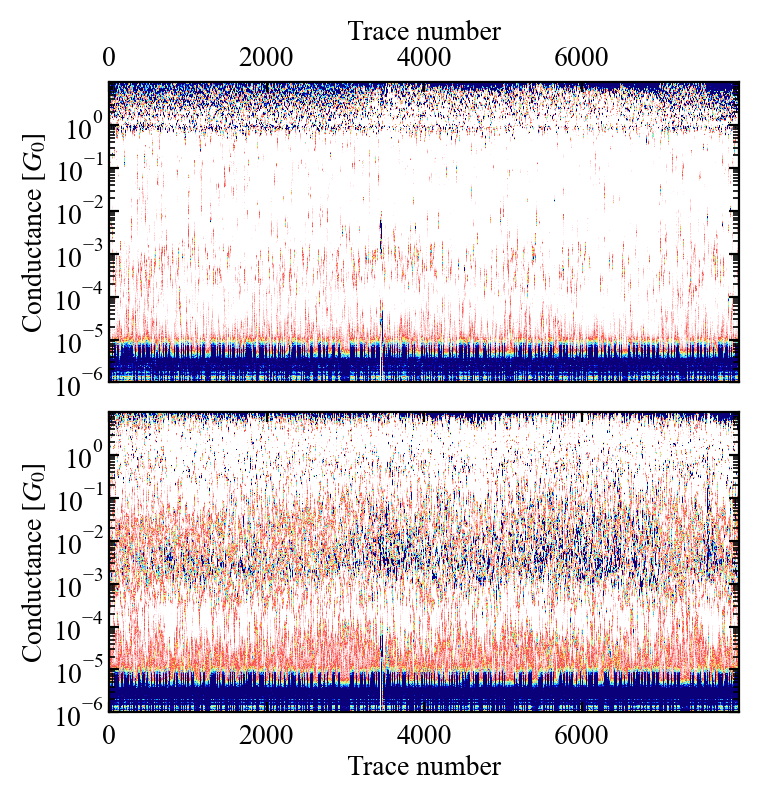

In [31]:
hist_bpy_8000_1.plot_temporal_hist(dpi=200, vmax_pull=100, vmax_push=100)

(<AxesSubplot:xlabel='Piezo [V]', ylabel='Conductance $[G_{0}]$'>,
 <AxesSubplot:xlabel='Piezo [V]', ylabel='Conductance $[G_{0}]$'>)

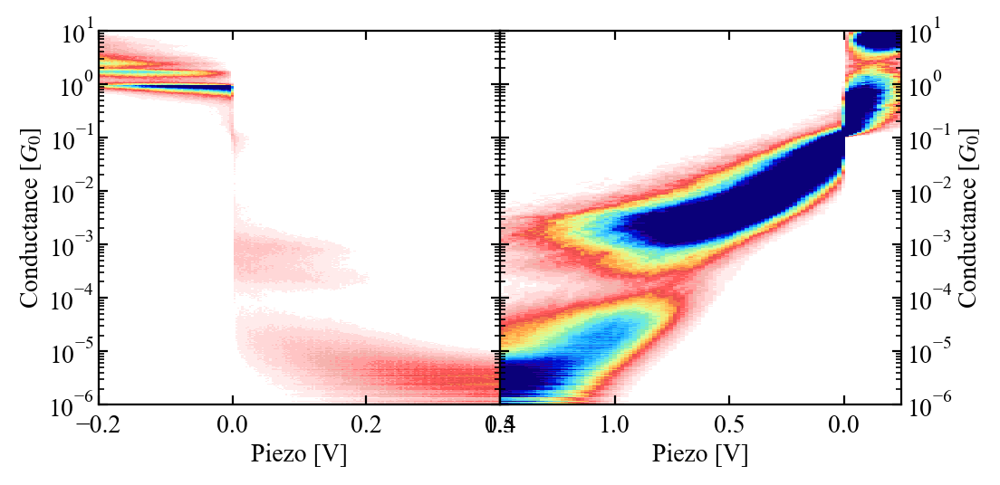

In [33]:
hist_bpy_8000_1.plot_hist_2d_both(dpi=200, vmin=100, vmax=5000)

In [34]:
hist_bpy_8000_1.calc_corr_hist_2d()

  0%|          | 0/8000 [00:00<?, ?it/s]

In [8]:
hist_bpy_8000 = Histogram(folder=home_folder,
                          traces=after_evap[:8000],
                          conductance_range=(1e-5, 10),  # 4.229e-5
                          conductance_bins_num=20,
                          conductance_bins_mode='decade')

In [9]:
hist_bpy_8000.calc_stats(align_at=0.1,
                         range_pull=(-0.25, 0.5),
                         range_push=(-0.5, 1.5))

  0%|          | 0/8000 [00:00<?, ?it/s]

Pull 2D histogram created from 8000 traces
Push 2D histogram created from 8000 traces


Plotted traces: [39715 43724 37316]


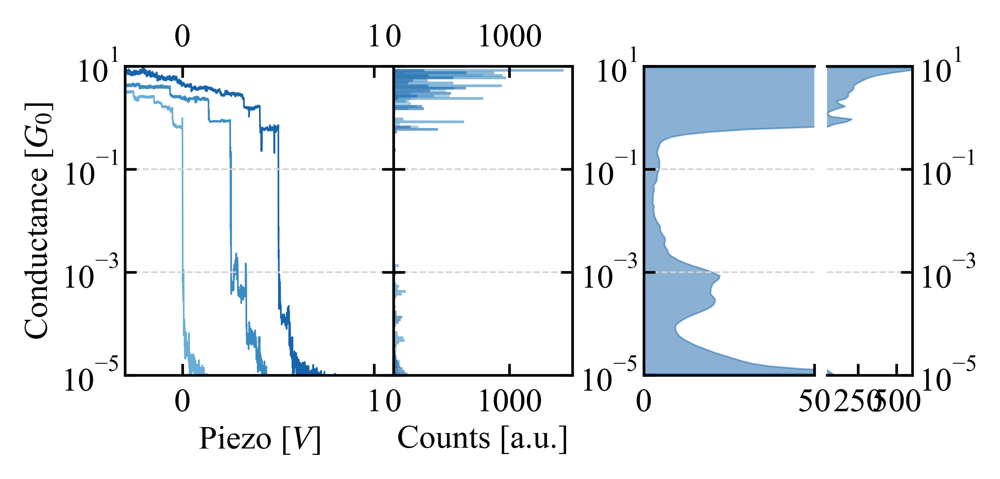

In [10]:
fig, ax_traces, ax_singles, ax_hist_bot, ax_hist_top = hist_1d_demo(hist=hist_bpy_8000, traces=3, shift=0.25,
                                                                    figsize=utils.cm2inch(10, 3*(10/7)), dpi=600)
# 37376 38098, 39638, 41171, 42652, 43675, 41651, 41562, 40424, 41286, 42699, 38807, 41551 
ax_traces.set_xlim(-0.3, 1.1)
# ax_hist.set_xlim(0, 350)
ax_traces.set_ylabel(r'Conductance [$G_{0}$]')
# ax_hist.set_ylabel(r'Conductance [$G_{0}$]')

ax_traces.set_xlabel(r'Piezo [$V$]')
ax_singles.set_xlabel('Counts [a.u.]')
# ax_hist.set_xlabel('Counts [a.u.]')

for ax in (ax_traces, ax_hist_bot, ax_hist_top, ax_singles):
    ax.set_yscale('log')
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)

In [11]:
hist_bpy_8000.calc_corr_hist_2d()

  0%|          | 0/8000 [00:00<?, ?it/s]

8.0

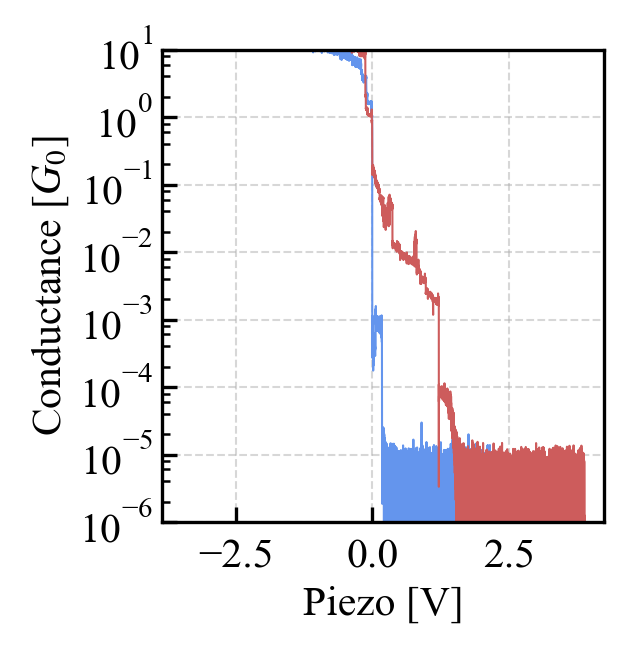

In [12]:
trace_pair = TracePair(41171, load_from=home_folder)
trace_pair.align_trace(align_at=0.5)
trace_pair.plot_trace_pair(dpi=300, aligned=True)

trace_pair.rate

In [13]:
hist_au_8000 = Histogram(folder=home_folder,
                    traces=before_evap[8000:16000],
                    conductance_range=(1e-5, 10),  # 4.229e-5
                    conductance_bins_num=20,
                    conductance_bins_mode='decade')

In [14]:
print(hist_au_8000.traces.shape)
print(hist_bpy_8000.traces.shape)

(8000,)
(8000,)


In [15]:
hist_au_8000.calc_stats(align_at=0.1,
                   range_pull=(-0.25, 0.6),
                   range_push=(-0.5, 1.5))

  0%|          | 0/8000 [00:00<?, ?it/s]

Pull 2D histogram created from 8000 traces
Push 2D histogram created from 8000 traces


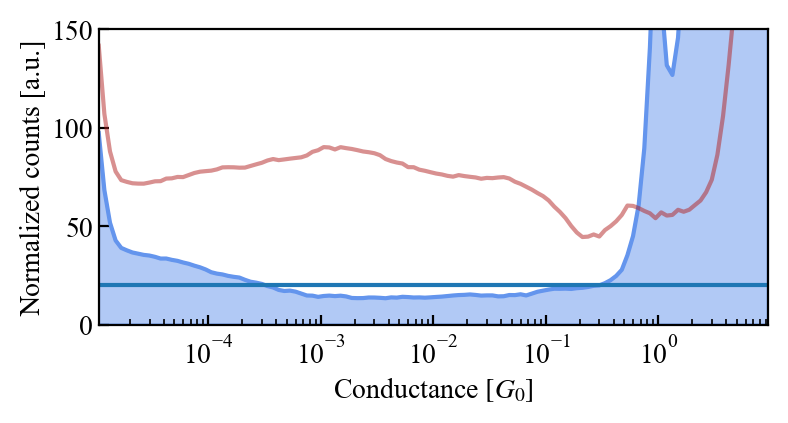

In [16]:
ax = hist_au_8000.plot_hist_1d(dpi=200)
ax.set_ylim(0, 150)
ax.axhline(20)

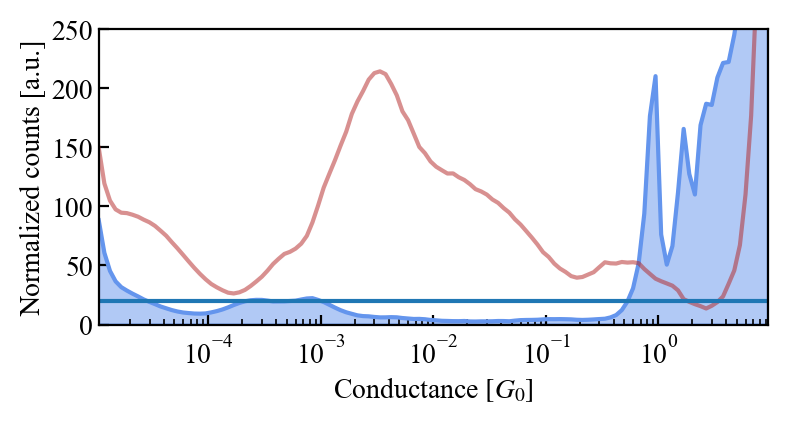

In [17]:
ax = hist_bpy_8000.plot_hist_1d(dpi=200)
ax.set_ylim(0, 250)
ax.axhline(20)

In [18]:
# selected_colors = colormaps[cmap](np.linspace(0.5, 0.8, len(traces)))
np.linspace(0.5, 0.8, 2)

colormaps['Reds'](0.8)

(0.7364705882352941, 0.08, 0.10117647058823528, 1.0)

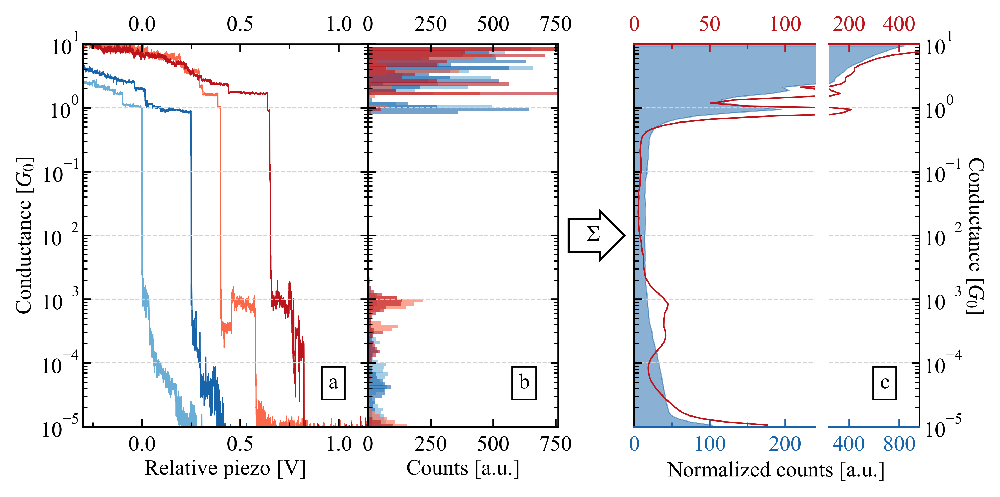

In [24]:
fig, ax_traces, ax_singles, ax_hist_bot, ax_hist_top = hist_1d_demo(hist=hist_au, traces=(628, 10004),  #628
                                                                    figsize=utils.cm2inch(16, 8), shift=0.25,
                                                                    my_label=None, hist_style='area', dpi=600) # (628, 16619, 13055, 17712, 4206, 9419, 5836)

par_ax_hist_bot = ax_hist_bot.twiny()
par_ax_hist_top = ax_hist_top.twiny()


fig, ax_traces, ax_singles, par_ax_hist_bot, par_ax_hist_top = hist_1d_demo(hist=hist_bpy_8000, traces=(41171, 38098),
                                                                            figsize=utils.cm2inch(16, 8), hist_style='line', cmap='Reds', my_label=None,
                                                                            shift=0.25, shift_0=0.4, axes=(ax_traces, ax_singles, par_ax_hist_bot, par_ax_hist_top), fig=fig)

ax_traces.set_xlim(-0.3, 1.15)

ax_hist_bot.set_xlim(0, 240)
ax_hist_top.set_xlim(240, 960)
ax_hist_top.set_xticks([400, 800])

par_ax_hist_bot.set_xlim(0, 120)
par_ax_hist_top.set_xlim(120, 480)
par_ax_hist_top.set_xticks([200, 400])

# ax_hist_bot.set_xlim(0, 320)
# ax_hist_top.set_xlim(320, 960)
# ax_hist_top.set_xticks([400, 800])

# par_ax_hist_bot.set_xlim(0, 160)
# par_ax_hist_top.set_xlim(160, 480)
# par_ax_hist_top.set_xticks([200, 400])

ax_singles.set_xlim(0, 760)

# ax_hist.set_xlim(0, 25)
# ax_singles.set_xlim(0, 180)

ax_traces.set_ylabel(r'Conductance $[G_{0}]$', fontsize=10)
ax_hist_top.set_ylabel(r'Conductance $[G_{0}]$', rotation=270, labelpad=10, fontsize=10)

ax_traces.set_xlabel(r'Relative piezo [V]', fontsize=10)
ax_singles.set_xlabel(r'Counts [a.u.]', fontsize=10)
ax_hist_bot.text(s=r'Normalized counts [a.u.]', x=188, y=2e-6, ha='center', va='center', fontsize=10) # x=250

# ax_traces.set_xticks(np.arange(-0.25, 1.1, 0.25))
ax_traces.set_xticks(np.arange(-0.25, 1.1, 0.5), minor=True)
ax_traces.set_xticks(np.arange(0, 1.1, 0.5))
ax_singles.set_xticks(np.arange(0, ax_singles.get_xlim()[1], 250))

ax_singles.text(890, 1e-2, r"  $\Sigma$  ",
                ha="center", va="center", rotation=0, size=10,
                bbox=dict(boxstyle="rarrow, pad=0.3",
                          fc="None", ec="black", lw=1))
ax_widths = {}
for ax in (ax_traces, ax_singles, ax_hist_top):
    ax_widths[ax] = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
for ax, i in zip((ax_traces, ax_singles, ax_hist_top), ('a', 'b', 'c')):
    ax.text(s=i, x=ax.get_xlim()[1]-0.25*((ax.get_xlim()[1]-ax.get_xlim()[0])/ax_widths[ax]), y=4e-5, fontsize=10, bbox=bbox_props)

for ax in (ax_traces, ax_hist_bot, ax_hist_top, ax_singles):
    ax.set_yscale('log')
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.yaxis.set_minor_formatter(ticker.NullFormatter())
    
ax_hist_bot.tick_params(which='both', left=True, right=False, top=False, bottom=True, labelleft=False, labelright=False,
                        labeltop=False, labelbottom=True)

ax_hist_top.tick_params(which='both', left=False, right=True, top=False, bottom=True, labelleft=False, labelright=True,
                        labeltop=False, labelbottom=True)

par_ax_hist_bot.tick_params(which='both', left=True, right=False, top=True, bottom=False, labelleft=False, labelright=False,
                            labeltop=True, labelbottom=False)

par_ax_hist_top.tick_params(which='both', left=False, right=True, top=True, bottom=False, labelleft=False, labelright=True,
                            labeltop=True, labelbottom=False)

par_ax_hist_bot.spines['top'].set_color(colormaps['Reds'](0.8))
par_ax_hist_bot.tick_params(axis='x', which='both', colors=colormaps['Reds'](0.8))

par_ax_hist_top.spines['top'].set_color(colormaps['Reds'](0.8))
par_ax_hist_top.tick_params(axis='x', which='both', colors=colormaps['Reds'](0.8))

ax_hist_bot.spines['bottom'].set_color(colormaps['Blues'](0.8))
ax_hist_bot.tick_params(axis='x', which='both', colors=colormaps['Blues'](0.8))

ax_hist_top.spines['bottom'].set_color(colormaps['Blues'](0.8))
ax_hist_top.tick_params(axis='x', which='both', colors=colormaps['Blues'](0.8))

par_ax_hist_bot.spines['bottom'].set_color(colormaps['Blues'](0.8))
par_ax_hist_top.spines['bottom'].set_color(colormaps['Blues'](0.8))

# par_ax_hist_bot.set_xticks([0, 50, 100])
# ax_hist_bot.set_xticks([0, 100, 200])

from matplotlib.ticker import MultipleLocator

ax_hist_bot.xaxis.set_major_locator(MultipleLocator(base=100))
par_ax_hist_bot.xaxis.set_major_locator(MultipleLocator(base=50))

ax_hist_bot.xaxis.set_minor_locator(MultipleLocator(base=50))
par_ax_hist_bot.xaxis.set_minor_locator(MultipleLocator(base=25))
    
# plt.savefig(home_folder.joinpath(f'results/principal_components/histogram1d_calculation_1.png'))

56.54325701307584


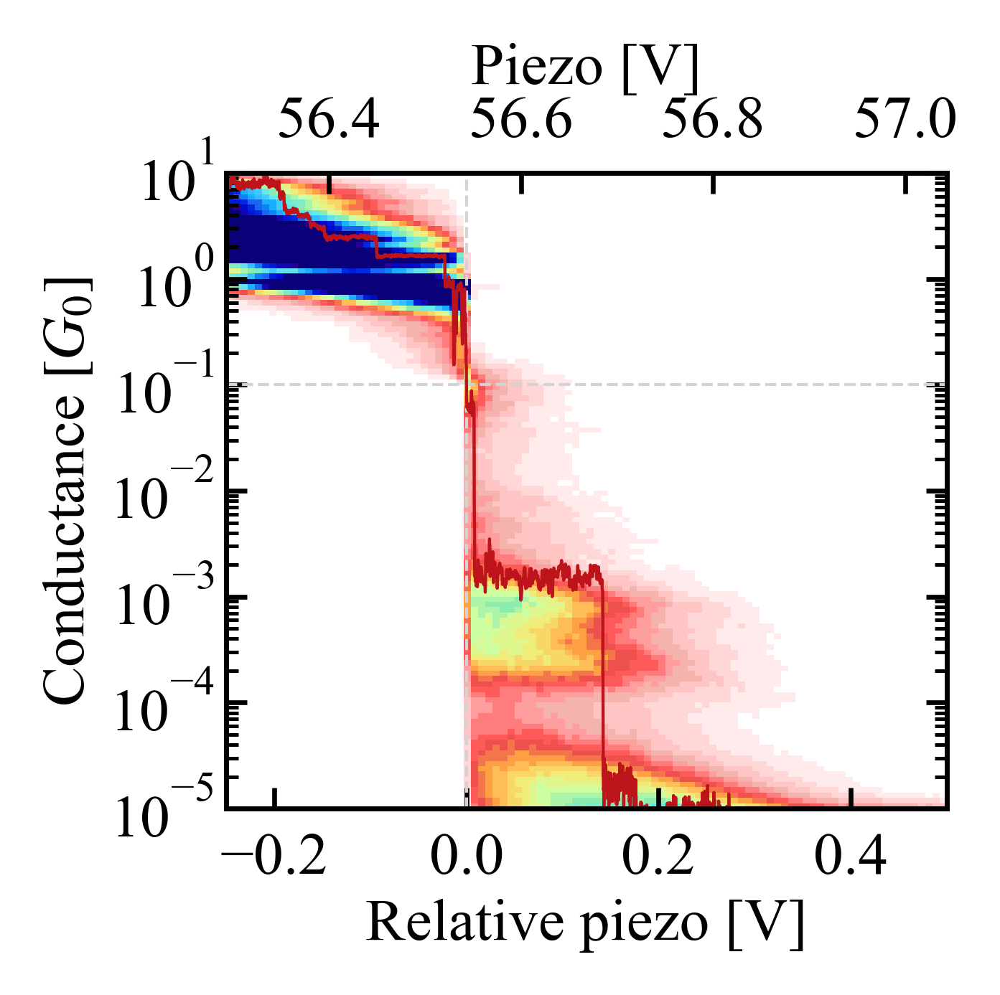

In [53]:
ax_pull = hist_bpy_8000.plot_hist_2d_one(direction='pull', dpi=600, vmin=0, vmax=15000)
# 37376 38098, 39638, 41171, 42652, 43675, 41651, 41562, 40424, 41286, 42699, 38807, 41551 
traces = (39707, )#(41171, 38098) # 39989
selected_color = colormaps['Reds'](np.linspace(0.5, 0.8, 2))[1]
my_label='BPY'
    
trace_pairs_loaded = [TracePair(i, load_from=hist_bpy_8000.folder) for i in traces]
# align each tarce at 0.5 G0
for i in range(len(trace_pairs_loaded)):
    trace_pairs_loaded[i].align_trace(align_at=hist_bpy_8000.align_at)

par = ax_pull.twiny()

for i, trace in enumerate(traces):
        ax_pull.plot(trace_pairs_loaded[i].aligned_piezo_pull, trace_pairs_loaded[i].conductance_pull, lw=0.5, c=selected_color, label=my_label, alpha=0.7)
        par.plot(trace_pairs_loaded[i].piezo_pull, trace_pairs_loaded[i].conductance_pull, lw=0.5, c=selected_color, label=my_label)

par.set_xlim(trace_pairs_loaded[i].piezo_shift_pull-abs(ax_pull.get_xlim()[0]), trace_pairs_loaded[i].piezo_shift_pull+ax_pull.get_xlim()[1])
        
ax_pull.set_ylim(1e-5, 10)
ax_pull.axhline(hist_bpy_8000.align_at, lw=0.5, ls='--', c='lightgrey')
ax_pull.axvline(0, lw=0.5, ls='--', c='lightgrey')
# ax_pull.axvline(-0.25, lw=0.5, ls='--', c='lightgrey')
# ax_pull.axvline(0.5, lw=0.5, ls='--', c='lightgrey')

# par.axvline(trace_pairs_loaded[i].piezo_shift_pull, lw=0.5, ls='--', c='red')

ax_pull.set_xlabel('Relative piezo [V]')
par.set_xlabel('Piezo [V]', labelpad=2)

par.xaxis.set_label_position('top')

print(trace_pairs_loaded[i].piezo_shift_pull)

In [39]:
def plot_hist_2d_one(hist, direction: str = 'pull', ax: Optional[matplotlib.axes.Axes] = None,
                     dpi: int = 600, **kwargs):
    """
    Plot 2d conductance-displacement histogram for 'pull' or 'push' traces defined by the *direction* parameter

    Parameters
    ----------
    direction : str,
        the direction for which you want to plot the 2d histogram
    ax : `~matplotlib.axes.Axes`
        pre-defined axis for plot
    dpi : int, resolution in dots per inch
    kwargs :
        additional arguments for `~matplotlib.axes.Axes.pcolormesh`

    Returns
    -------
    ax : `~matplotlib.axes.Axes`
        axis with plot

    """
    if ax is None:
        fig = plt.figure(figsize=utils.cm2inch(5, 5), dpi=dpi)  # figsize: (width, height) in inches
        gs = gridspec.GridSpec(nrows=1, ncols=1,
                               figure=fig, left=0.1, right=0.95, top=0.95, bottom=0.2, wspace=0, hspace=0.1)
        ax = fig.add_subplot(gs[0])

    if direction == 'pull':
        x_mesh = hist.hist_2d_xmesh_pull
        y_mesh = hist.hist_2d_ymesh_pull
        hist_2d = hist.hist_2d_pull/max(hist.hist_2d_pull[:, np.where(hist.hist_2d_xmesh_pull[0] > 0)[0][0]:].flatten())
        ax.set_xlim(min(x_mesh.flatten()), max(x_mesh.flatten()))
    elif direction == 'push':
        x_mesh = hist.hist_2d_xmesh_push
        y_mesh = hist.hist_2d_ymesh_push
        hist_2d = hist.hist_2d_push/max(hist.hist_2d_push[:, np.where(hist.hist_2d_xmesh_push[0] > 0)[0][0]:].flatten())
        ax.set_xlim(max(x_mesh.flatten()), min(x_mesh.flatten()))
    else:
        raise ValueError(f'Unknown parameter for direction: {direction}. Valid choices include: ["pull", "push"]')

    ax.set_ylabel(r'Conductance $[G_{0}]$')
    ax.set_xlabel(r'Piezo [V]')

    ax.xaxis.set_ticks_position('both')
    ax.yaxis.set_ticks_position('both')

    if hist.conductance_log_scale:
        ax.set_yscale('log')
        ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
        ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
        ax.yaxis.set_minor_formatter(ticker.NullFormatter())
    
    im_norm = ax.pcolormesh(x_mesh, y_mesh, hist_2d, cmap=utils.cmap_geo32, **kwargs)

    return ax, im_norm
           

def hist_2d_demo(hist: Histogram,
                 trace: int,
                 selected_color='cornflowerblue', my_label=None,
                 ax:matplotlib.axes.Axes = None, **kwargs):
        
    if ax is None:
        ax_2d, im_norm = plot_hist_2d_one(hist=hist, direction='pull', dpi=600, **kwargs)
        par = ax_2d.twiny()
    else:
        ax_2d = ax
        ax_2d, im_norm = plot_hist_2d_one(hist=hist, direction='pull', dpi=600, ax=ax_2d, **kwargs)
        par = ax_2d.twiny()
    
    print(im_norm)
    
    # 37376 38098, 39638, 41171, 42652, 43675, 41651, 41562, 40424, 41286, 42699, 38807, 41551 
    # traces = (39707, )#(41171, 38098) # 39989
    # selected_color = colormaps[cmap](np.linspace(0.5, 0.7, 2))[1]
    
    if my_label is not None:
        # ax_2d.text(s=my_label, x=0.4, y=1, ha='center', va='center', fontsize=6, color=selected_color)
        ax_width = ax_2d.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
        # ax_2d.text(s=my_label, x=ax.get_xlim()[1]-0.5*((ax.get_xlim()[1]-ax.get_xlim()[0])/ax_width), y=2e-1,
        #            ha='left', va='center', fontsize=8, color=selected_color)
        ax_2d.text(s=my_label, x=-0.2, y=2e-2,
                   ha='left', va='center', fontsize=8, color=selected_color)
                
    trace_pair_loaded = TracePair(trace, load_from=hist.folder)
    trace_pair_loaded.align_trace(align_at=hist.align_at)

    for i, trace in enumerate(traces):
            ax_2d.plot(trace_pair_loaded.aligned_piezo_pull, trace_pair_loaded.conductance_pull, lw=0.5, c=selected_color, label=my_label, alpha=0.7)
            par.plot(trace_pair_loaded.piezo_pull, trace_pair_loaded.conductance_pull, lw=0.5, c=selected_color, label=my_label)

    par.set_xlim(trace_pair_loaded.piezo_shift_pull-abs(ax_2d.get_xlim()[0]), trace_pair_loaded.piezo_shift_pull+ax_2d.get_xlim()[1])

    ax_2d.set_ylim(1e-5, 10)
    ax_2d.axhline(hist.align_at, lw=0.5, ls='--', c='lightgrey')
    ax_2d.axvline(0, lw=0.5, ls='--', c='lightgrey')
    # ax_2d.axvline(-0.25, lw=0.5, ls='--', c='lightgrey')
    # ax_2d.axvline(0.5, lw=0.5, ls='--', c='lightgrey')

    # par.axvline(trace_pairs_loaded[i].piezo_shift_pull, lw=0.5, ls='--', c='red')
    
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes

    cbbox = inset_axes(ax_2d, '40%', '22%', loc = 'upper left', bbox_to_anchor=(0.45,0,0.8,1), bbox_transform=ax.transAxes)
    [cbbox.spines[k].set_visible(False) for k in cbbox.spines]
    cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
    cbbox.set_facecolor([1,1,1,0.7])

    cbaxes = inset_axes(cbbox, '85%', '20%', loc = 'upper right')

    cb=fig.colorbar(im_norm, cax=cbaxes, orientation='horizontal') #make colorbar
    
    if 'vmin' in kwargs and 'vmax' in kwargs:
        cbaxes.set_xticks(np.linspace(start=kwargs['vmin'], stop=kwargs['vmax'], num=3))
    elif 'vmin' in kwargs:
        cbaxes.set_xticks(np.linspace(start=kwargs['vmin'], stop=max(im_norm.flatten()), num=3))
    elif 'vmax' in kwargs:
        cbaxes.set_xticks(np.linspace(start=min(im_norm.flatten()), stop=kwargs['vmax'], num=3))
    else:
        cbaxes.set_xticks(np.linspace(start=min(im_norm.flatten()), stop=max(im_norm.flatten()), num=3))
    
    ax_2d.set_xlabel('Relative piezo [V]')
    par.set_xlabel('Piezo [V]', labelpad=2)

    par.xaxis.set_label_position('top')
    
    return ax_2d, par, cb

Text(0.5, 0, 'Norm. counts [a.u.]')

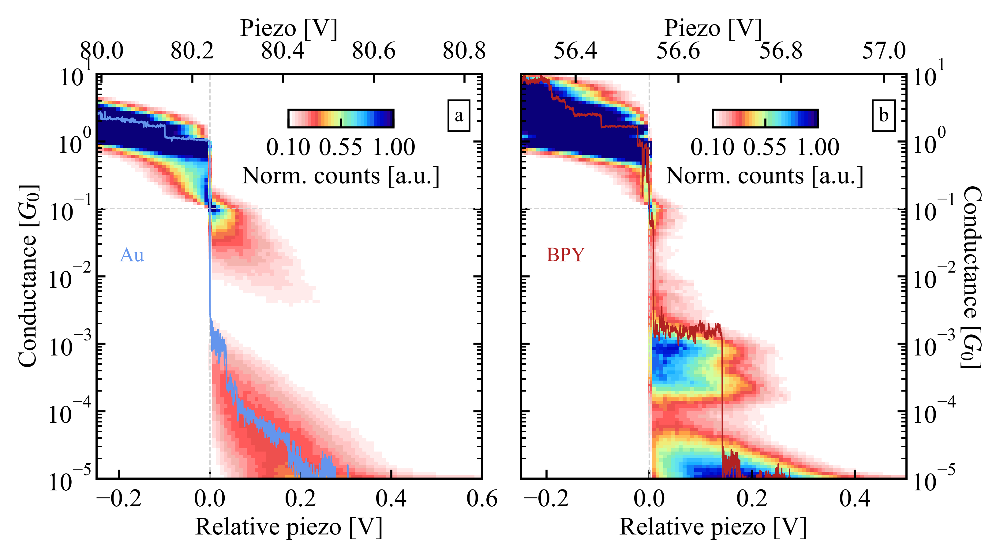

In [55]:
fig = plt.figure(figsize=utils.cm2inch(14, 7), dpi=600)
gs = plt.GridSpec(1, 2, figure=fig,
                  left=0.1, right=0.9, top=0.9, bottom=0.1, width_ratios=(1, 1),
                  hspace=0, wspace=0.1)

# gs_singles = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(3, 2),
#                                               subplot_spec=gs[0],
#                                               wspace=0, hspace=0)

# gs_totals = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(2, 1),
#                                              subplot_spec=gs[1],
#                                              wspace=0.1, hspace=0)

ax_2d_au = fig.add_subplot(gs[0])
ax_2d_bpy = fig.add_subplot(gs[1])

ax_2d_au, par_au, cb_au = hist_2d_demo(hist=hist_au,
                                trace=628, # 10004
                                selected_color='cornflowerblue', my_label='Au',
                                ax=ax_2d_au, vmin=0.1, vmax=1)  # vmin=5000, vmax=75000

ax_2d_bpy, par_bpy, cb_bpy = hist_2d_demo(hist=hist_bpy_8000,
                                  trace=39707, # 41171, 38098
                                  selected_color='firebrick', my_label='BPY',
                                  ax=ax_2d_bpy, vmin=0.1, vmax=1)  # vmin=1000, vmax=15000

ax_2d_bpy.yaxis.tick_right()
ax_2d_bpy.yaxis.set_label_position('right')
ax_2d_bpy.set_ylabel(r'Conductance $[G_{0}]$', rotation=270, labelpad=10)

ax_2d_bpy.tick_params(which='both', left=True, right=True, top=False, bottom=True, labelleft=False, labelright=True,
                      labeltop=False, labelbottom=True)

ax_widths = {}
for ax in (ax_2d_au, ax_2d_bpy):
    ax_widths[ax] = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
for ax, i in zip((ax_2d_au, ax_2d_bpy), ('a', 'b')):
    ax.text(s=i, x=ax.get_xlim()[1]-0.15*((ax.get_xlim()[1]-ax.get_xlim()[0])/ax_widths[ax]), y=2, fontsize=8, bbox=bbox_props)

# ax_colorbar = ax_corr.inset_axes(bounds=(0.1, 0.58, 0.04, 0.35), alpha=0.5, fc='white')
# cbar = plt.colorbar(im_norm, ax_colorbar)
# cb.ax.set_yticks(np.arange(-0.3, 0.31, 0.15))
# cb.ax.set_ylabel('Correlation', rotation=270, labelpad=6)
cb_au.ax.set_xlabel('Norm. counts [a.u.]', fontsize=10)
cb_bpy.ax.set_xlabel('Norm. counts [a.u.]', fontsize=10)
# plt.savefig(home_folder.joinpath(f'results/principal_components/histogram2d_calculation.png'), bbox_inches='tight')

In [380]:
hist.hist_2d_pull/max(hist.hist_2d_pull[:, np.where(hist_au.hist_2d_xmesh_pull[0] > 0)[0][0]:].flatten())

30

# PCA

In [25]:
hist_bpy_8000 = Histogram(folder=home_folder,
                          traces=after_evap[:8000],
                          conductance_range=(1e-5, 10),  # 4.229e-5
                          conductance_bins_num=20,
                          conductance_bins_mode='decade')

In [26]:
hist_bpy_8000.calc_stats(align_at=0.1,
                         range_pull=(-0.25, 0.5),
                         range_push=(-0.5, 1.5))

  0%|          | 0/8000 [00:00<?, ?it/s]

Pull 2D histogram created from 8000 traces
Push 2D histogram created from 8000 traces


In [27]:
nori_hist_1d = np.loadtxt('D:/BJ_Data/22_03_23/Nori_PCA/POConductanceHist1D_all_long.txt', skiprows=1)
nori_hist_bins = 10**np.arange(start=-5.82391, step=0.0689284, stop=-5.82391+100*0.0689284)

In [28]:
pc_nori=PCA(hist=Histogram(folder=home_folder,
                 traces=after_evap[:2000],  #8000
                 conductance_range=(1e-5, 10),  # 4.229e-5
                 conductance_bins_num=100,
                 conductance_bins_mode='total'))
pc_nori.load_principal_components(fname='D:/BJ_Data/22_03_23/Nori_PCA/STM_PCs.txt', source_type='igor')
pc_nori.hist.hist_1d_bins = nori_hist_bins
pc_nori.hist.hist_1d_pull = nori_hist_1d

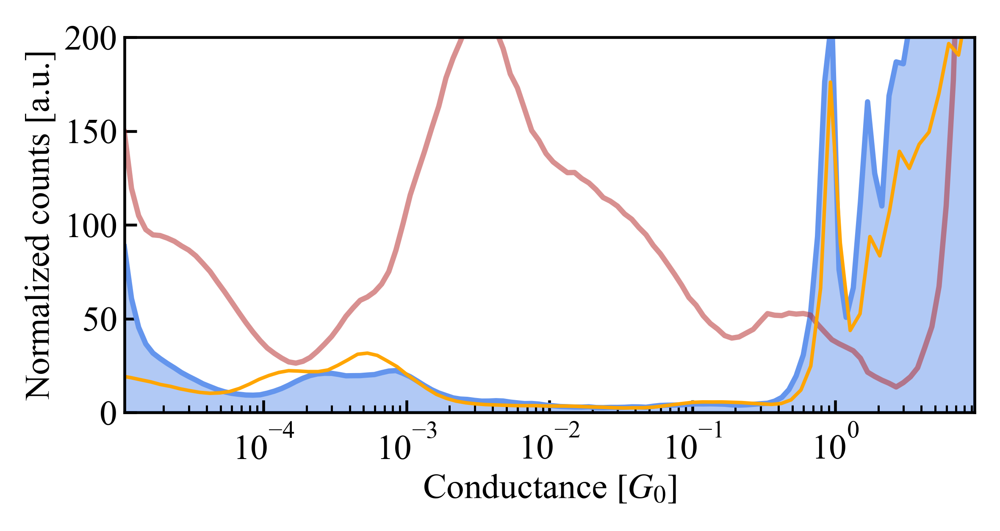

In [29]:
ax = hist_bpy_8000.plot_hist_1d()
ax.set_ylim(0, 200)
ax.plot(nori_hist_bins, 3*nori_hist_1d, lw=1, c='orange')

In [30]:
traces = np.random.choice(hist_bpy_8000.traces, 10)

trace_pairs_loaded = [TracePair(i, load_from=hist_bpy_8000.folder) for i in traces]

In [31]:
for i in range(len(trace_pairs_loaded)):
        trace_pairs_loaded[i].align_trace(align_at=0.5)

40110


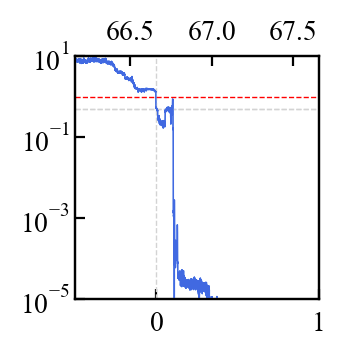

In [32]:
my_label='asd'

i = 3
print(trace_pairs_loaded[i].trace_num) # 37000, 39087
fig, ax = plt.subplots(1, figsize=utils.cm2inch(4, 4), dpi=200)

ax.plot(trace_pairs_loaded[i].aligned_piezo_pull, trace_pairs_loaded[i].conductance_pull, lw=0.5, c='cornflowerblue', label=my_label)
par = ax.twiny()
par.plot(trace_pairs_loaded[i].piezo_pull, trace_pairs_loaded[i].conductance_pull, lw=0.5, c='royalblue', label=my_label)

ax.set_yscale('log')
ax.set_ylim(1e-5, 10)
ax.set_xlim(-0.5, 1)
par.set_xlim(trace_pairs_loaded[i].piezo_shift_pull-0.5, trace_pairs_loaded[i].piezo_shift_pull+1)

ax.axvline(0, ls='--', lw=0.5, c='lightgrey')
ax.axhline(0.5, ls='--', lw=0.5, c='lightgrey')
ax.axhline(1, ls='--', lw=0.5, c='red')
ax.axhline(trace_pairs_loaded[i].align_at, ls='--', lw=0.5, c='lightgrey')

In [33]:
trace_pairs_loaded[i].piezo_shift_pull

66.66004634207998

In [34]:
hist_bpy_8000.calc_corr_hist_2d()

  0%|          | 0/8000 [00:00<?, ?it/s]

In [35]:
hist_bpy_8000.corr_2d_pull

array([[ 1.        ,  0.89553327,  0.72398803, ..., -0.03447215,
        -0.04484461, -0.05587525],
       [ 0.89553327,  1.        ,  0.91479413, ..., -0.04570181,
        -0.06539782, -0.08152161],
       [ 0.72398803,  0.91479413,  1.        , ..., -0.04842617,
        -0.07205198, -0.09184176],
       ...,
       [-0.03447215, -0.04570181, -0.04842617, ...,  1.        ,
         0.58704744,  0.42609931],
       [-0.04484461, -0.06539782, -0.07205198, ...,  0.58704744,
         1.        ,  0.76380818],
       [-0.05587525, -0.08152161, -0.09184176, ...,  0.42609931,
         0.76380818,  1.        ]])

(<AxesSubplot:xlabel='Conductance $[G_{0}]$', ylabel='Conductance $[G_{0}]$'>,
 <AxesSubplot:>)

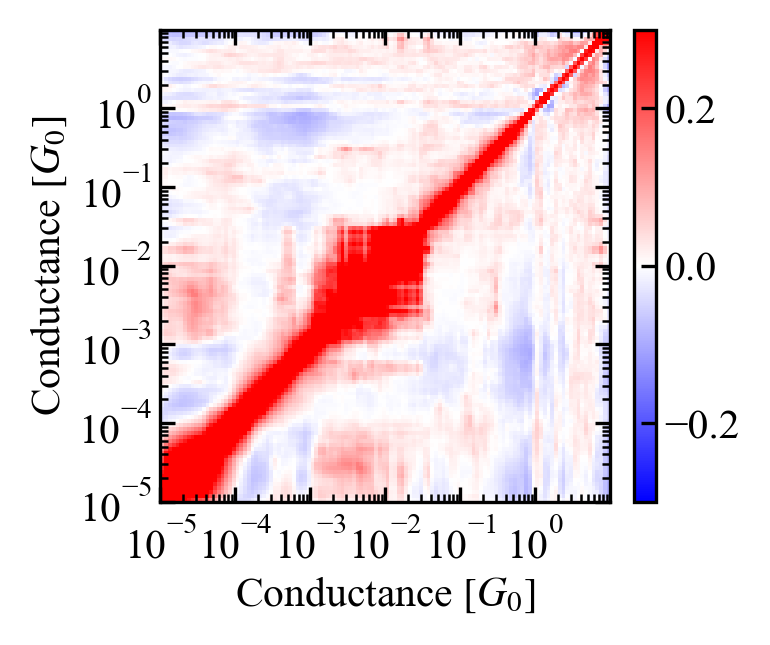

In [37]:
hist_bpy_8000.plot_corr(mode='pull', dpi=300, vmin=-0.3, vmax=0.3)

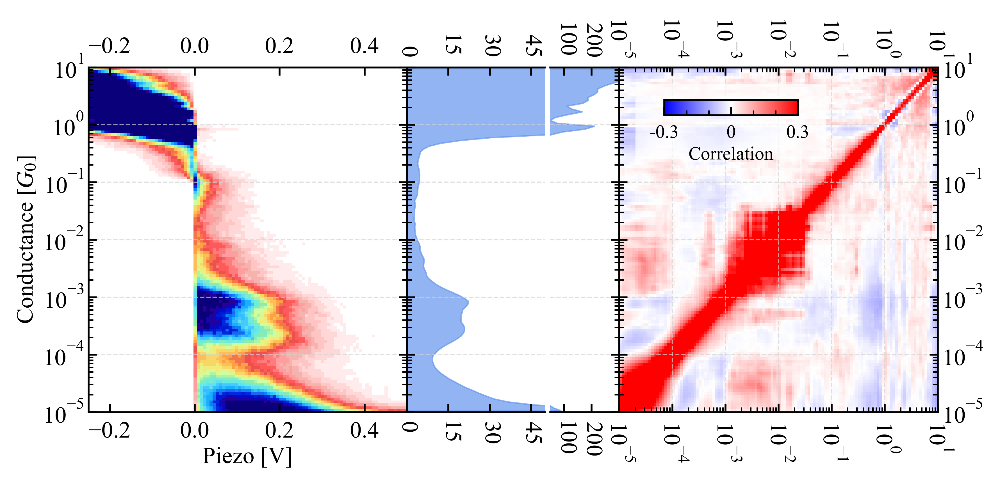

In [40]:
figsize=utils.cm2inch(16, 6.5)
dpi=600
fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(1, 3, figure=fig,
                  left=0.1, right=0.9, top=0.9, bottom=0.1, width_ratios=(3, 2, 3),
                  hspace=0, wspace=0)

gs_1d = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(2, 1),
                                         subplot_spec=gs[1],
                                         wspace=0.05, hspace=0)

ax_2d = fig.add_subplot(gs[0])
ax_1d_bot = fig.add_subplot(gs_1d[0])
ax_1d_top = fig.add_subplot(gs_1d[1])
ax_corr = fig.add_subplot(gs[2])

ax_corr.set_xscale('log')
ax_corr.set_yscale('log')

ax_1d_bot.set_yscale('log')
ax_1d_top.set_yscale('log')

ax_2d.set_ylim(1e-5, 10)

ax_corr.set_xlim(1e-5, 10)
ax_corr.set_ylim(1e-5, 10)

ax_1d_bot.set_ylim(1e-5, 10)
ax_1d_top.set_ylim(1e-5, 10)
ax_1d_bot.set_xlim(0, 50)
ax_1d_top.set_xlim(50, 300)

ax_1d_bot.spines[['right']].set_visible(False)
ax_1d_top.spines[['left']].set_visible(False)

ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=True, labelbottom=True)

ax_1d_bot.tick_params(which='both', left=True, right=False, top=True, bottom=True,
                      labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_1d_top.tick_params(which='both', left=False, right=True, top=True, bottom=True,
                      labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_1d_bot.set_xticks(np.arange(0, 50, 15))
ax_1d_bot.set_xticklabels(np.arange(0, 50, 15), rotation=270, ha='center')
ax_1d_top.set_xticks(np.arange(100, 300, 100))
ax_1d_top.set_xticklabels(np.arange(100, 300, 100), rotation=270, ha='center')

ax_corr.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=False, labelright=True, labeltop=True, labelbottom=True)

ax_1d_bot.fill_betweenx(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7)
ax_1d_top.fill_betweenx(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7)

ax_2d, im_norm = plot_hist_2d_one(hist=hist_bpy_8000, direction='pull', dpi=600, ax=ax_2d, vmax=0.8)

x_mesh, y_mesh = np.meshgrid(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_bins)
im_norm = ax_corr.pcolormesh(x_mesh, y_mesh, hist_bpy_8000.corr_2d_pull, cmap='bwr', vmin=-0.3, vmax=0.3)

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

cbbox = inset_axes(ax_corr, '60%', '22%', loc = 'upper left')
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

cbaxes = inset_axes(cbbox, '70%', '20%', loc = 'upper center')

cb=fig.colorbar(im_norm, cax=cbaxes, orientation='horizontal') #make colorbar
cb.ax.set_xticks([-0.3, 0, 0.3])
cb.ax.set_xticklabels([-0.3, 0, 0.3], fontsize=8)
cb.ax.set_xticks([-0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3], minor=True)

# ax_colorbar = ax_corr.inset_axes(bounds=(0.1, 0.58, 0.04, 0.35), alpha=0.5, fc='white')
# cbar = plt.colorbar(im_norm, ax_colorbar)
# cb.ax.set_yticks(np.arange(-0.3, 0.31, 0.15))
# cb.ax.set_ylabel('Correlation', rotation=270, labelpad=6)
cb.ax.set_xlabel('Correlation', fontsize=8)

plt.setp(ax_corr.get_xticklabels(), rotation=270)

ax_1d_bot.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_1d_bot.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_1d_bot.yaxis.set_minor_formatter(ticker.NullFormatter())

ax_1d_top.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_1d_top.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_1d_top.yaxis.set_minor_formatter(ticker.NullFormatter())

ax_corr.xaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_corr.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_corr.xaxis.set_minor_formatter(ticker.NullFormatter())
ax_corr.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_corr.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_corr.yaxis.set_minor_formatter(ticker.NullFormatter())

ax_2d.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)
ax_1d_bot.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)
ax_1d_top.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)
ax_corr.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)

ax_corr.grid(visible=True, which='major', axis='x', c='lightgrey', ls='--', lw=0.5, alpha=0.7)

In [41]:
pc = PCA(hist=hist_bpy_8000, num_of_pcs=5)
pc.calc_principal_components(direction='pull')

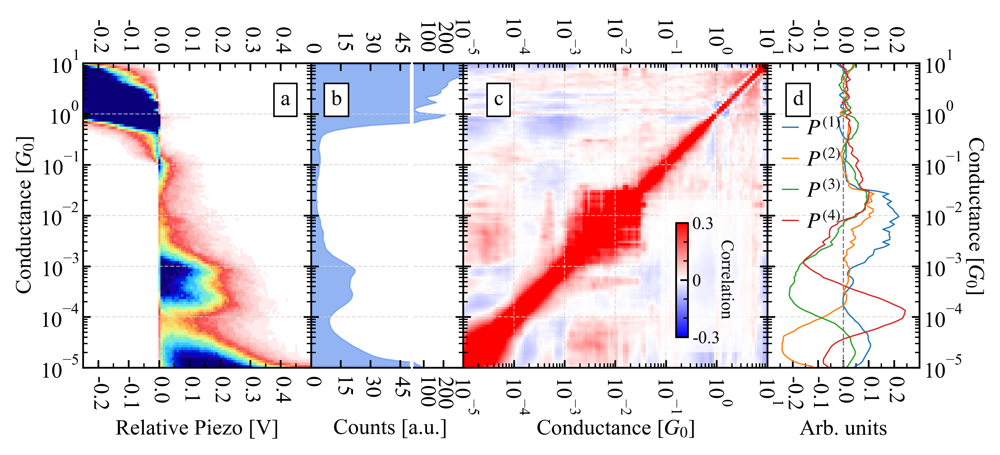

In [42]:
figsize=utils.cm2inch(16, 7)
dpi=600
fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(1, 4, figure=fig,
                  left=0.08, right=0.92, top=0.87, bottom=0.17, width_ratios=(3, 2, 4, 2),
                  hspace=0, wspace=0)

gs_1d = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(2, 1),
                                         subplot_spec=gs[1],
                                         wspace=0.05, hspace=0)

ax_2d = fig.add_subplot(gs[0])
ax_1d_bot = fig.add_subplot(gs_1d[0])
ax_1d_top = fig.add_subplot(gs_1d[1])
ax_corr = fig.add_subplot(gs[2])
ax_pc = fig.add_subplot(gs[3])

# ax_pc = pc.plot_pcs(ax=ax_pc)

ax_corr.set_xscale('log')
ax_corr.set_yscale('log')

ax_1d_bot.set_yscale('log')
ax_1d_top.set_yscale('log')

ax_2d.set_ylim(1e-5, 10)

ax_corr.set_xlim(1e-5, 10)
ax_corr.set_ylim(1e-5, 10)

ax_pc.set_ylim(1e-5, 10)

ax_1d_bot.set_ylim(1e-5, 10)
ax_1d_top.set_ylim(1e-5, 10)
ax_1d_bot.set_xlim(0, 50)
ax_1d_top.set_xlim(50, 300)

ax_2d.set_xlim(-0.25, 0.45)

ax_1d_bot.spines[['right']].set_visible(False)
ax_1d_top.spines[['left']].set_visible(False)

ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=True, labelbottom=True)

ax_1d_bot.tick_params(which='both', left=True, right=False, top=True, bottom=True,
                      labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_1d_top.tick_params(which='both', left=False, right=True, top=True, bottom=True,
                      labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_2d.set_xticks(np.round(np.arange(-0.2, 0.5, 0.1), 1))
ax_2d.set_xticks(np.arange(-0.2, 0.5, 0.05), minor=True)
ax_2d.set_xticklabels(np.round(np.arange(-0.2, 0.5, 0.1), 1), rotation=270, ha='center')

ax_1d_bot.set_xticks(np.arange(0, 50, 15))
ax_1d_bot.set_xticklabels(np.arange(0, 50, 15), rotation=270, ha='center')
ax_1d_top.set_xticks(np.arange(100, 300, 100))
ax_1d_top.set_xticklabels(np.arange(100, 300, 100), rotation=270, ha='center')

ax_pc.set_xlim(-0.3, 0.3)
ax_pc.set_xticks(np.round(np.arange(-0.2, 0.3, 0.1), 1))
ax_pc.set_xticks(np.arange(-0.3, 0.35, 0.05), minor=True)
ax_pc.set_xticklabels(np.round(np.arange(-0.2, 0.3, 0.1), 1), rotation=270, ha='center')

ax_corr.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_pc.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=False, labelright=True, labeltop=True, labelbottom=True)

ax_1d_bot.fill_betweenx(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7)
ax_1d_top.fill_betweenx(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7)

ax_2d, im_norm = plot_hist_2d_one(hist=hist_bpy_8000, direction='pull', dpi=600, ax=ax_2d, vmax=0.8)

x_mesh, y_mesh = np.meshgrid(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_bins)
im_norm = ax_corr.pcolormesh(x_mesh, y_mesh, hist_bpy_8000.corr_2d_pull, cmap='bwr', vmin=-0.3, vmax=0.3)

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# cbbox = inset_axes(ax_corr, '60%', '25%', loc = 'lower right')
cbbox = inset_axes(ax_corr, '30%', '50%', loc = 'lower right')
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

# cbaxes = inset_axes(cbbox, '70%', '13%', loc = 'lower center')
cbaxes = inset_axes(cbbox, '13%', '75%', loc = 'lower left')

# cb=fig.colorbar(im_norm, cax=cbaxes, orientation='horizontal') #make colorbar
cb=fig.colorbar(im_norm, cax=cbaxes, orientation='vertical') #make colorbar
# cb.ax.tick_params(which='both', left=False, right=False, top=True, bottom=False,
#                   labelleft=False, labelright=False, labeltop=True, labelbottom=False)
cb.ax.tick_params(which='both', left=False, right=True, top=False, bottom=False,
                  labelleft=False, labelright=True, labeltop=False, labelbottom=False)
# cb.ax.set_xticks([-0.3, 0, 0.3])
# cb.ax.set_xticklabels([-0.3, 0, 0.3], fontsize=8)
# cb.ax.set_xticks([-0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3], minor=True)

cb.ax.set_yticks([-0.3, 0, 0.3])
cb.ax.set_yticklabels([-0.3, 0, 0.3], fontsize=8)
cb.ax.set_yticks([-0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3], minor=True)

# cb.ax.xaxis.set_label_position('top')
# ax_colorbar = ax_corr.inset_axes(bounds=(0.1, 0.58, 0.04, 0.35), alpha=0.5, fc='white')
# cbar = plt.colorbar(im_norm, ax_colorbar)
# cb.ax.set_yticks(np.arange(-0.3, 0.31, 0.15))
# cb.ax.set_ylabel('Correlation', rotation=270, labelpad=6)
# cb.ax.set_xlabel('Correlation', fontsize=8)
cb.ax.set_ylabel('Correlation', fontsize=8, rotation=270, labelpad=6)

plt.setp(ax_corr.get_xticklabels(), rotation=270)

ax_pc.set_prop_cycle = cycler('color', pc.color_map)  # set the colors for the PCs

for pc_key in pc.pc_keys[:-1]:
    which_pc = re.search(r'\d', pc_key).group(0)
    # s = "".join(["$P^{(", f"{which_pc}", ")}$"])
    # print(s)
    # raw_s = r'{}'.format(s)
    ax_pc.plot(pc.principal_components[pc_key], pc.hist.hist_1d_bins, label=r"$P^{("+f"{which_pc}"+r")}$", lw=0.6)

ax_pc.set_yscale('log')
ax_pc.plot(np.zeros_like(pc.hist.hist_1d_bins), pc.hist.hist_1d_bins, lw=0.6, ls='--', c='grey')
ax_pc.legend(loc='upper left', bbox_to_anchor=(-0.03, 0.88), ncol=1, fontsize=10, frameon=False, handlelength=0.7, handletextpad=0.4)

ax_1d_bot.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_1d_bot.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_1d_bot.yaxis.set_minor_formatter(ticker.NullFormatter())

ax_1d_top.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_1d_top.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_1d_top.yaxis.set_minor_formatter(ticker.NullFormatter())

ax_corr.xaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_corr.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_corr.xaxis.set_minor_formatter(ticker.NullFormatter())
ax_corr.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_corr.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_corr.yaxis.set_minor_formatter(ticker.NullFormatter())

ax_pc.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_pc.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_pc.yaxis.set_minor_formatter(ticker.NullFormatter())

ax_2d.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)
ax_1d_bot.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)
ax_1d_top.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)
ax_pc.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)
ax_corr.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)

ax_corr.grid(visible=True, which='major', axis='x', c='lightgrey', ls='--', lw=0.5, alpha=0.7)


bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)

ax_2d.text(x=0.4, y=1.5, s='a', fontsize=10, bbox=bbox_props)
ax_1d_bot.text(x=10, y=1.5, s='b', fontsize=10, bbox=bbox_props)
ax_corr.text(x=4e-5, y=1.5, s='c', fontsize=10, bbox=bbox_props)
ax_pc.text(x=-0.2, y=1.5, s='d', fontsize=10, bbox=bbox_props)

ax_2d.set_xlabel('Relative Piezo [V]')
ax_corr.set_xlabel(r'Conductance $[G_{0}]$')
ax_pc.set_xlabel('')
ax_pc.set_ylabel(r'Conductance $[G_{0}]$', labelpad=10, rotation=270)
ax_pc.set_xlabel('Arb. units')

ax_pc.yaxis.set_label_position('right')

ax_1d_bot.text(x=40, y=4e-7, s='Counts [a.u.]', ha='center', va='bottom', fontsize=10)

fig.align_xlabels([ax_2d, ax_corr, ax_pc])

# plt.savefig(home_folder.joinpath(f'results/principal_components/totalhists_corr_pcs_1.png'))

In [43]:
sum(hist_bpy_8000.hist_2d_ymesh_pull[:, 0] >=1e-5)

121

In [44]:
print(hist_bpy_8000.hist_2d_pull.shape)
print(hist_bpy_8000.hist_1d_pull.shape)

(120, 100)
(120,)


(1e-05, 10)

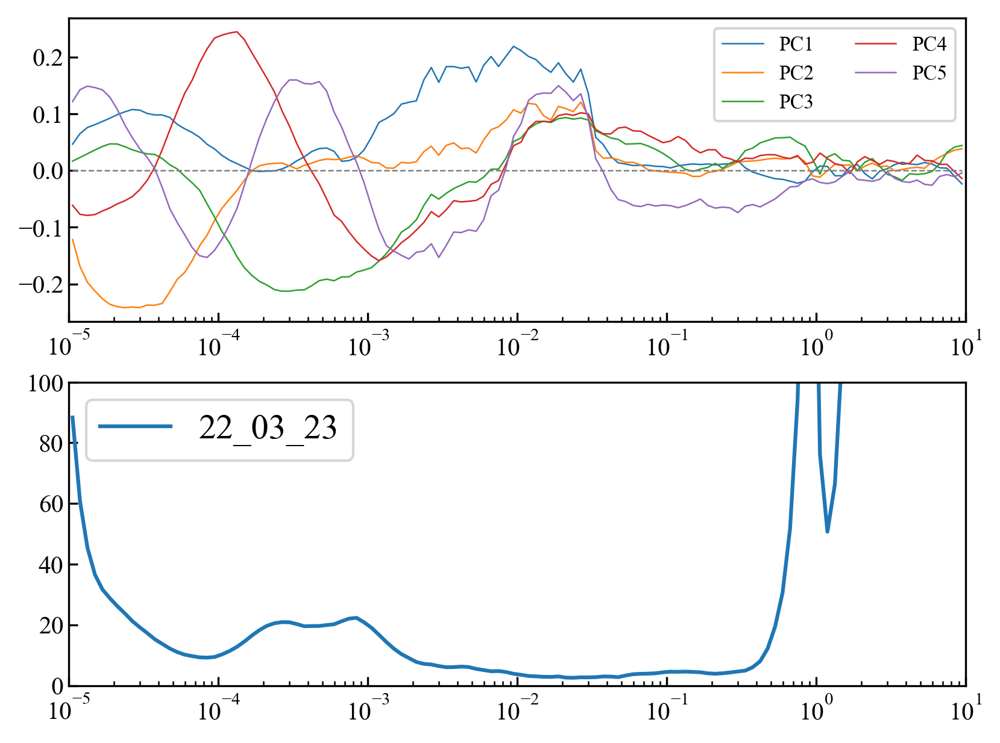

In [45]:
fig, (ax1, ax2) = plt.subplots(nrows=2, dpi=300)

ax1 = pc.plot_pcs(ax=ax1)
# ax1 = pc_nori.plot_pcs(ax=ax1)

# ax1.plot(hist.hist_1d_bins, pc.principal_components['PC4'], ls='--')
# par = ax.twinx()
ax2.plot(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_pull, label='22_03_23')
ax2.set_ylim(0, 100)

# ax2.plot(nori_hist_bins, nori_hist_1d*3, label='Nóri')
ax2.legend()
ax2.set_xscale('log')
ax1.set_xlim(1e-5, 10)
ax2.set_xlim(1e-5, 10)

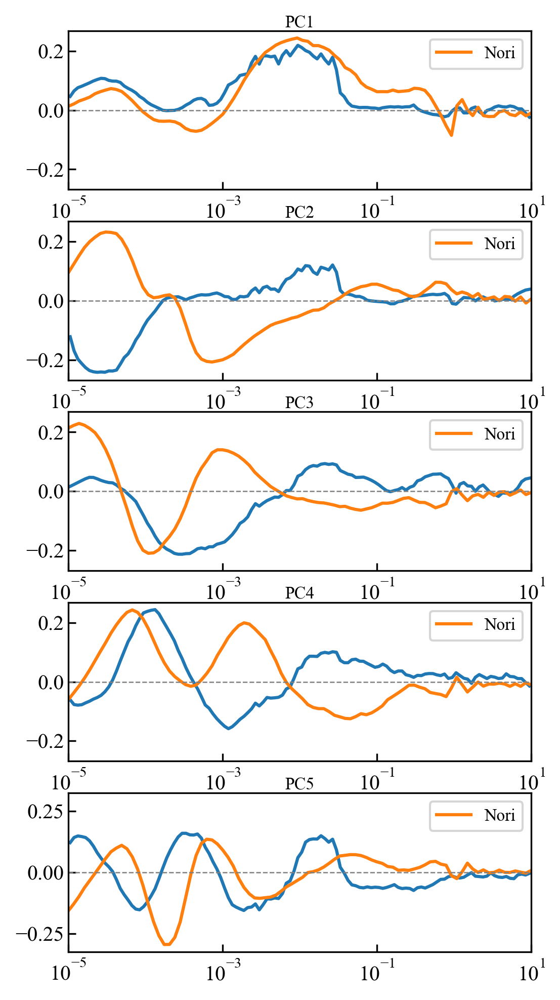

In [46]:
axs = compare_principal_components((pc, pc_nori), labels=('', 'Nori'))

for ax in axs:
    ax.set_xlim(1e-5, 10)

In [47]:
pc.project_to_pcs()
pc.calc_pc_hist_all(num_of_bins=100, hist_min=None, hist_max = None)
pc.select_percentage(percentage=20, calc_histograms=True)

Calculating the projections to PCs.:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

In [48]:
def plot_pc_hist(pc_key: str, plot_groups: bool = False, group_colors: Tuple[str, str] = ('b', 'r'),
                 dpi: int = 300, ax=None):
    if ax is None:
        fig, ax = plt.subplots(1, figsize=utils.cm2inch(6, 3), dpi=dpi)

    ax.bar(x=pc.pc_hist_bins[pc_key],
           height=pc.pc_hist_1d[pc_key],
           width=np.mean(np.diff(pc.pc_hist_bins[pc_key])),
           align='edge', color='white', edgecolor='k', lw=0.7)
    if plot_groups:
        ax.bar(x=pc.pc_hist_bins_group1[pc_key],
               height=pc.pc_hist_1d_group1[pc_key],
               width=np.mean(np.diff(pc.pc_hist_bins_group1[pc_key])),
               align='edge', color=group_colors[0], edgecolor='None', lw=0, alpha=0.6)
        ax.bar(x=pc.pc_hist_bins_group2[pc_key],
               height=pc.pc_hist_1d_group2[pc_key],
               width=np.mean(np.diff(pc.pc_hist_bins_group1[pc_key])),
               align='edge', color=group_colors[1], edgecolor='None', lw=0, alpha=0.6)

    return ax

def plot_pc_hist_horizontal(pc, pc_key: str, plot_groups: bool = False, group_colors=('b', 'r'), main_color='k',
                 dpi: int = 300, ax=None):
    if ax is None:
        fig, ax = plt.subplots(1, figsize=utils.cm2inch(3, 6), dpi=dpi)

    ax.barh(y=pc.pc_hist_bins[pc_key],
           width=pc.pc_hist_1d[pc_key],
           height=np.mean(np.diff(pc.pc_hist_bins[pc_key])),
           align='edge', color='white', edgecolor=main_color, lw=0.7)
    if plot_groups:
        ax.barh(y=pc.pc_hist_bins_group1[pc_key],
                width=pc.pc_hist_1d_group1[pc_key],
                height=np.mean(np.diff(pc.pc_hist_bins_group1[pc_key])),
                align='edge', color=group_colors[0], edgecolor='None', lw=0, alpha=0.8)
        ax.barh(y=pc.pc_hist_bins_group2[pc_key],
                width=pc.pc_hist_1d_group2[pc_key],
                height=np.mean(np.diff(pc.pc_hist_bins_group1[pc_key])),
                align='edge', color=group_colors[1], edgecolor='None', lw=0, alpha=0.8)

    return ax

(-1276.4030225938286, 1536.681697903998)


(-425.46767419794287, 512.2272326346659)

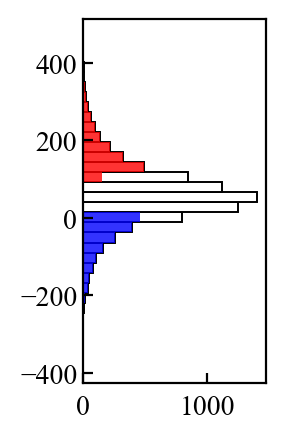

In [49]:
ax = plot_pc_hist_horizontal(pc=pc, pc_key='PC4', plot_groups = True, group_colors = ('b', 'r'),
                  dpi = 200, ax=None)

print(ax.get_ylim())
auto_ylim = ax.get_ylim()
ax.set_ylim(auto_ylim[0]/3, auto_ylim[1]/3)
# ax.set_xlim(0, 500)
# ax.axhline()

In [50]:
pc.calc_group_histograms()

Calculating 1D and 2D histograms of PC1 group1.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces
Calculating 1D and 2D histograms of PC1 group2.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces
Calculating 1D and 2D histograms of PC2 group1.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces
Calculating 1D and 2D histograms of PC2 group2.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces
Calculating 1D and 2D histograms of PC3 group1.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces
Calculating 1D and 2D histograms of PC3 group2.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces
Calculating 1D and 2D histograms of PC4 group1.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces
Calculating 1D and 2D histograms of PC4 group2.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces
Calculating 1D and 2D histograms of PC5 group1.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces
Calculating 1D and 2D histograms of PC5 group2.


  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

2D histogram pull direction created from 1600 traces
2D histogram push direction created from 1600 traces


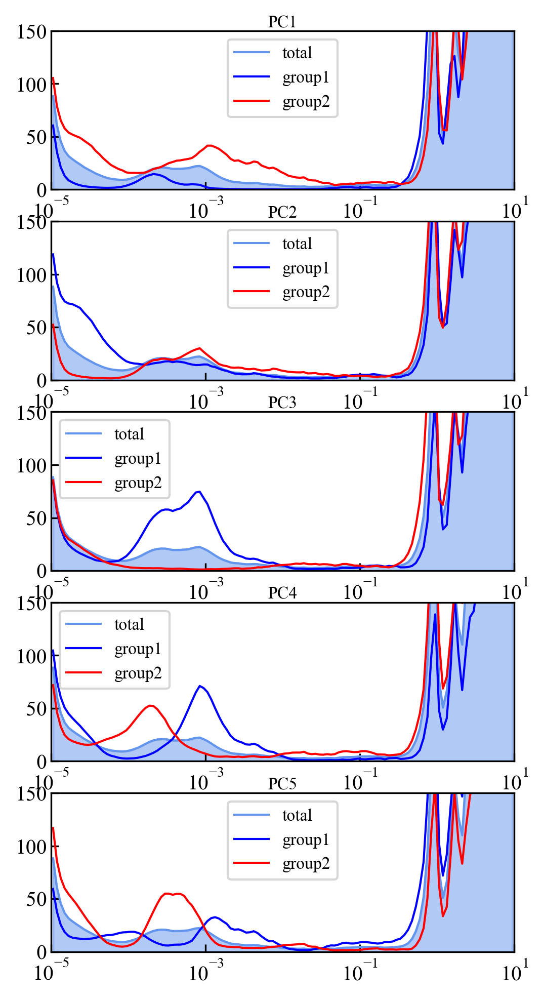

In [51]:
ax = pc.plot_group_histograms_1d(ylims=(0, 150), group1_color='b', group2_color='r')

In [52]:
# pc.__dict__
pc.hist_group1['PC1'].traces.shape

(1600,)

In [151]:
# pc.hist_group1[f'PC1'].hist_2d_ymesh_pull

In [53]:
mix_noris_pcs = {1: 1, 2: 2, 3: 4, 4: 3}
inv_noris_pcs = {1: 1, 2: -1, 3: -1, 4: -1}

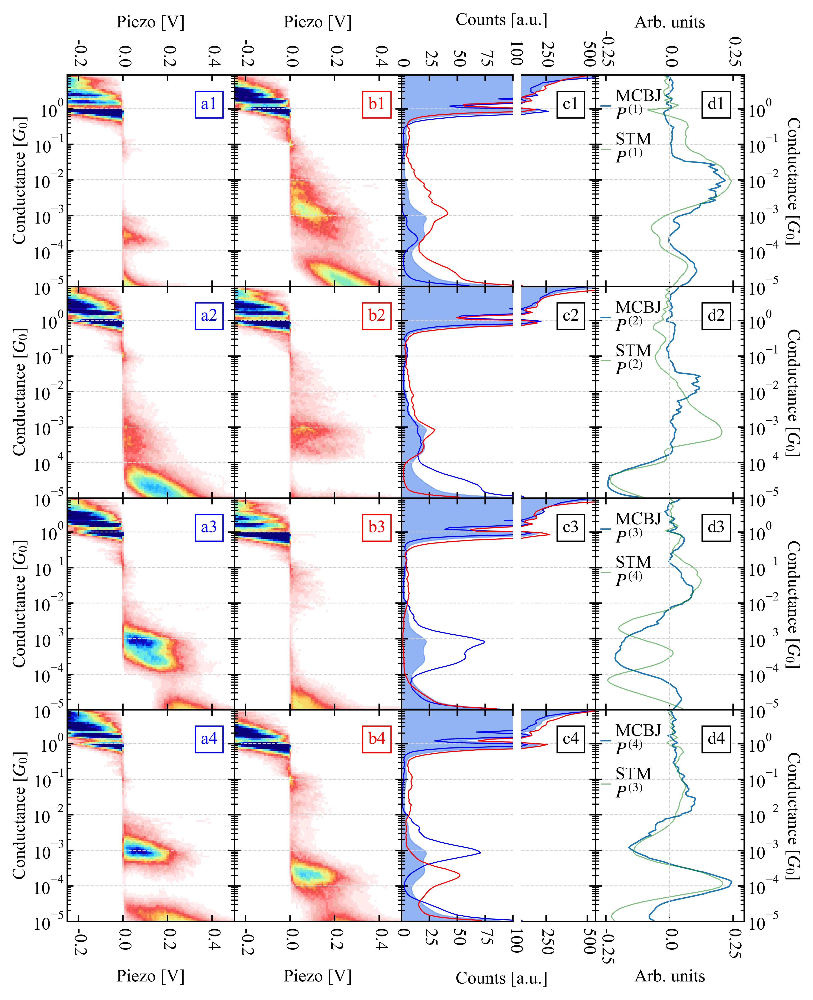

In [54]:
n=4 #pc.num_of_pcs
figsize=utils.cm2inch(16, 20)
dpi=600
fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(1, 2, figure=fig,
                  left=0.08, right=0.92, top=0.92, bottom=0.08, width_ratios=(2, 1),
                  hspace=0, wspace=0.025)

gs1 = gridspec.GridSpecFromSubplotSpec(nrows=n, ncols=3, width_ratios=(3, 3, 2),
                                       subplot_spec=gs[0],
                                       wspace=0.0, hspace=0)

gs2 = gridspec.GridSpecFromSubplotSpec(nrows=n, ncols=2, width_ratios=(1, 2),
                                       subplot_spec=gs[1],
                                       wspace=0.0, hspace=0)

ax_2d_gr1 = [fig.add_subplot(gs1[i, 0]) for i in range(gs1._nrows)]
ax_2d_gr2 = [fig.add_subplot(gs1[i, 1]) for i in range(gs1._nrows)]
ax_1d_bot = [fig.add_subplot(gs1[i, 2]) for i in range(gs1._nrows)]
ax_1d_top = [fig.add_subplot(gs2[i, 0]) for i in range(gs2._nrows)]
ax_pc = [fig.add_subplot(gs2[i, 1]) for i in range(gs2._nrows)]

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)

for i, ax in enumerate(ax_2d_gr1):
    ax = pc.hist_group1[f'PC{i+1}'].plot_hist_2d_one(direction='pull', ax=ax, vmax=5000)
    if i == 0:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=True, labelright=False, labeltop=True, labelbottom=False)
        ax.xaxis.set_label_position('top')
    elif i == n-1:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                   labelleft=True, labelright=False, labeltop=False, labelbottom=True)
    else:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                   labelleft=True, labelright=False, labeltop=False, labelbottom=False)
        
    # ax.tick_params(which='minor', left=False, right=False, top=False, bottom=False,
    #                labelleft=False, labelright=False, labeltop=False, labelbottom=False)
    
    ax.set_ylim(1e-5, 9)
    ax.set_xticks(np.arange(-0.2, 0.41, 0.2))
    ax.set_xticklabels(np.round(np.arange(-0.2, 0.41, 0.2), 1), rotation=270, ha='center')
    ax.set_xlabel('Piezo [V]')
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    
    ax.text(x=0.35, y=1, s=f'a{i+1}', fontsize=10, c='b', bbox=dict(boxstyle="square", lw=0.7, fc="w", ec="b", alpha=1))
    
for i, ax in enumerate(ax_2d_gr2):
    ax = pc.hist_group2[f'PC{i+1}'].plot_hist_2d_one(direction='pull', ax=ax, vmax=5000)
    if i == 0:
        ax.tick_params(which='major', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=False, labeltop=True, labelbottom=False)
        ax.xaxis.set_label_position('top')
    elif i == n-1:
        ax.tick_params(which='major', left=True, right=True, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=True)
    else:
        ax.tick_params(which='major', left=True, right=True, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=False)
        
#     ax.tick_params(which='minor', left=False, right=True, top=False, bottom=False,
#                    labelleft=False, labelright=False, labeltop=False, labelbottom=False)
    
    ax.set_ylabel('')
    ax.set_ylim(1e-5, 9)
    ax.set_xticks(np.arange(-0.2, 0.41, 0.2))
    ax.set_xticklabels(np.round(np.arange(-0.2, 0.41, 0.2), 1), rotation=270, ha='center')
    ax.set_xlabel('Piezo [V]')
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    
    ax.text(x=0.35, y=1, s=f'b{i+1}', fontsize=10, c='r', bbox=dict(boxstyle="square", lw=0.7, fc="w", ec="r", alpha=1))

for i, ax in enumerate(ax_1d_bot):
    ax.fill_betweenx(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7)
    ax.plot(pc.hist_group1[f'PC{i+1}'].hist_1d_pull, pc.hist_group1[f'PC{i+1}'].hist_1d_bins, c='b', lw=0.6)
    ax.plot(pc.hist_group2[f'PC{i+1}'].hist_1d_pull, pc.hist_group2[f'PC{i+1}'].hist_1d_bins, c='r', lw=0.6)
    
    ax.set_yscale('log')
    if i == 0:
        ax.tick_params(which='both', left=True, right=False, top=True, bottom=True,
                       labelleft=False, labelright=False, labeltop=True, labelbottom=False)
        ax.text(x=90, y=230, s='Counts [a.u.]', ha='center', fontsize=10)
    elif i == n-1:
        ax.tick_params(which='both', left=True, right=False, top=True, bottom=True,
                       labelleft=False, labelright=False, labeltop=False, labelbottom=True)
        ax.text(x=90, y=1.8e-7, s='Counts [a.u.]', ha='center', fontsize=10)
    else:
        ax.tick_params(which='both', left=True, right=False, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=False)
    ax.set_xlim(0, 100)
    ax.spines[['right']].set_visible(False)
    ax.set_ylim(1e-5, 9)
    ax.set_xticks(np.arange(0, 101, 25))
    ax.set_xticklabels(np.arange(0, 101, 25), rotation=270, ha='center')
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    
for i, ax in enumerate(ax_1d_top):
    ax.fill_betweenx(pc.hist.hist_1d_bins, pc.hist.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7)
    ax.plot(pc.hist_group1[f'PC{i+1}'].hist_1d_pull, pc.hist_group1[f'PC{i+1}'].hist_1d_bins, c='b', lw=0.6)
    ax.plot(pc.hist_group2[f'PC{i+1}'].hist_1d_pull, pc.hist_group2[f'PC{i+1}'].hist_1d_bins, c='r', lw=0.6)
    
    ax.set_yscale('log')
    if i == 0:
        ax.tick_params(which='both', left=False, right=True, top=True, bottom=True,
                       labelleft=False, labelright=False, labeltop=True, labelbottom=False)
    elif i == n-1:
        ax.tick_params(which='both', left=False, right=True, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=True)
    else:
        ax.tick_params(which='both', left=False, right=True, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=False)
    ax.set_xlim(100, 550)
    ax.set_xticks([250, 500])
    ax.set_xticklabels([250, 500], rotation=270, ha='center')
    ax.spines[['left']].set_visible(False)
    ax.set_ylim(1e-5, 9)
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    
    ax.text(x=350, y=1, s=f'c{i+1}', fontsize=10, bbox=bbox_props)
    
for i, ax in enumerate(ax_pc):
    # ax.plot(pc.principal_components[f'PC{i+1}'], pc.hist.hist_1d_bins, label=f'MCBJ\nPC{i+1}', lw=0.8)
    ax.plot(pc.principal_components[f'PC{i+1}'], pc.hist.hist_1d_bins, label="MCBJ\n"+r"$P^{("+f"{i+1}"+r")}$", lw=0.8)
    # ax.plot(pc_nori.principal_components[f'PC{i+1}'], pc_nori.hist.hist_1d_bins, label=f'PC{i+1}', lw=0.6)
    # ax.plot(inv_noris_pcs[i+1] * pc_nori.principal_components[f'PC{mix_noris_pcs[i+1]}'], pc_nori.hist.hist_1d_bins, label=f'STM\nPC{mix_noris_pcs[i+1]}', lw=0.6, c='g', alpha=0.5)
    ax.plot(inv_noris_pcs[i+1] * pc_nori.principal_components[f'PC{mix_noris_pcs[i+1]}'], pc_nori.hist.hist_1d_bins, label="STM\n"+r"$P^{("+f"{mix_noris_pcs[i+1]}"+r")}$", lw=0.6, c='g', alpha=0.5)
    
    ax.set_yscale('log')
    if i == 0:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=True, labelbottom=False)
        ax.xaxis.set_label_position('top')
    elif i == n-1:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=True)
    else:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=False)
    ax.set_xlim(1.2*min([min(pc.principal_components[f'PC{j}']) for j in range(1, n+1)]),
                1.2*max([max(pc.principal_components[f'PC{j}']) for j in range(1, n+1)]))
    
    ax.set_xticks(np.round(np.arange(-0.25, 0.251, 0.25), 2))
    ax.set_xticklabels(np.round(np.arange(-0.25, 0.251, 0.25), 2), rotation=270, ha='center')
    
    ax.axvline(0, ls='--', lw=0.5, c='lightgrey')
    ax.set_ylim(1e-5, 9)
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'Conductance $[G_{0}]$', rotation=270, labelpad=12)
    
    ax.set_xlabel('Arb. units')
    
    ax.text(x=0.15, y=1, s=f'd{i+1}', fontsize=10, bbox=bbox_props)
    
    ax.legend(fontsize=10, frameon=False, loc='upper left', handlelength=0.5, handletextpad=0.3, bbox_to_anchor=(-0.07, 1.01))  #,  bbox_to_anchor=(0, 0.5)
    
fig.align_xlabels([ax_2d_gr1[0], ax_2d_gr2[0], ax_pc[0]])
fig.align_xlabels([ax_2d_gr1[-1], ax_2d_gr2[-1], ax_pc[-1]])

    
# plt.savefig(home_folder.joinpath(f'results/principal_components/group_hists_and_pcs_with_Noris.png'))

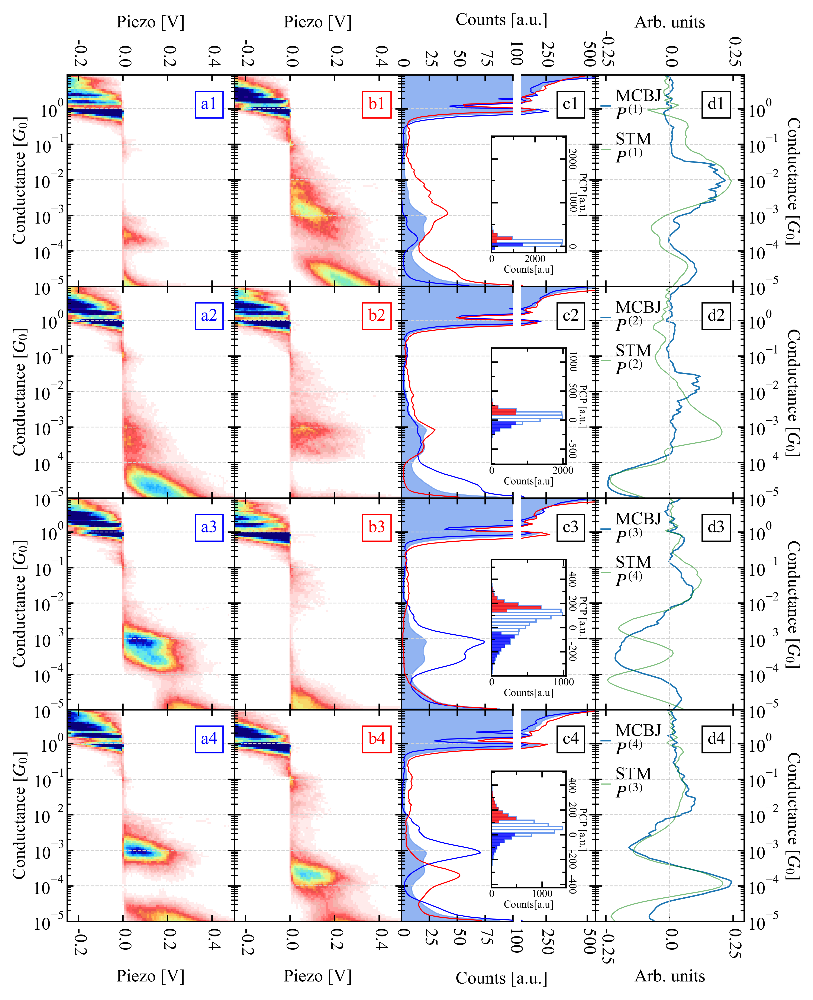

In [56]:
n=4 #pc.num_of_pcs
figsize=utils.cm2inch(16, 20)
dpi=600
fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(1, 2, figure=fig,
                  left=0.08, right=0.92, top=0.92, bottom=0.08, width_ratios=(2, 1),
                  hspace=0, wspace=0.025)

gs1 = gridspec.GridSpecFromSubplotSpec(nrows=n, ncols=3, width_ratios=(3, 3, 2),
                                       subplot_spec=gs[0],
                                       wspace=0.0, hspace=0)

gs2 = gridspec.GridSpecFromSubplotSpec(nrows=n, ncols=2, width_ratios=(1, 2),
                                       subplot_spec=gs[1],
                                       wspace=0.0, hspace=0)

ax_2d_gr1 = [fig.add_subplot(gs1[i, 0]) for i in range(gs1._nrows)]
ax_2d_gr2 = [fig.add_subplot(gs1[i, 1]) for i in range(gs1._nrows)]
ax_1d_bot = [fig.add_subplot(gs1[i, 2]) for i in range(gs1._nrows)]
ax_1d_top = [fig.add_subplot(gs2[i, 0]) for i in range(gs2._nrows)]
ax_pc = [fig.add_subplot(gs2[i, 1]) for i in range(gs2._nrows)]

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)

for i, ax in enumerate(ax_2d_gr1):
    ax = pc.hist_group1[f'PC{i+1}'].plot_hist_2d_one(direction='pull', ax=ax, vmax=5000)
    if i == 0:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=True, labelright=False, labeltop=True, labelbottom=False)
        ax.xaxis.set_label_position('top')
    elif i == n-1:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                   labelleft=True, labelright=False, labeltop=False, labelbottom=True)
    else:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                   labelleft=True, labelright=False, labeltop=False, labelbottom=False)
        
    # ax.tick_params(which='minor', left=False, right=False, top=False, bottom=False,
    #                labelleft=False, labelright=False, labeltop=False, labelbottom=False)
    
    ax.set_ylim(1e-5, 9)
    ax.set_xticks(np.arange(-0.2, 0.41, 0.2))
    ax.set_xticklabels(np.round(np.arange(-0.2, 0.41, 0.2), 1), rotation=270, ha='center')
    ax.set_xlabel('Piezo [V]')
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    
    ax.text(x=0.35, y=1, s=f'a{i+1}', fontsize=10, c='b', bbox=dict(boxstyle="square", lw=0.7, fc="w", ec="b", alpha=1))
    
for i, ax in enumerate(ax_2d_gr2):
    ax = pc.hist_group2[f'PC{i+1}'].plot_hist_2d_one(direction='pull', ax=ax, vmax=5000)
    if i == 0:
        ax.tick_params(which='major', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=False, labeltop=True, labelbottom=False)
        ax.xaxis.set_label_position('top')
    elif i == n-1:
        ax.tick_params(which='major', left=True, right=True, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=True)
    else:
        ax.tick_params(which='major', left=True, right=True, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=False)
        
#     ax.tick_params(which='minor', left=False, right=True, top=False, bottom=False,
#                    labelleft=False, labelright=False, labeltop=False, labelbottom=False)
    
    ax.set_ylabel('')
    ax.set_ylim(1e-5, 9)
    ax.set_xticks(np.arange(-0.2, 0.41, 0.2))
    ax.set_xticklabels(np.round(np.arange(-0.2, 0.41, 0.2), 1), rotation=270, ha='center')
    ax.set_xlabel('Piezo [V]')
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    
    ax.text(x=0.35, y=1, s=f'b{i+1}', fontsize=10, c='r', bbox=dict(boxstyle="square", lw=0.7, fc="w", ec="r", alpha=1))

for i, ax in enumerate(ax_1d_bot):
    ax.fill_betweenx(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7)
    ax.plot(pc.hist_group1[f'PC{i+1}'].hist_1d_pull, pc.hist_group1[f'PC{i+1}'].hist_1d_bins, c='b', lw=0.6)
    ax.plot(pc.hist_group2[f'PC{i+1}'].hist_1d_pull, pc.hist_group2[f'PC{i+1}'].hist_1d_bins, c='r', lw=0.6)
    
    ax.set_yscale('log')
    if i == 0:
        ax.tick_params(which='both', left=True, right=False, top=True, bottom=True,
                       labelleft=False, labelright=False, labeltop=True, labelbottom=False)
        ax.text(x=90, y=230, s='Counts [a.u.]', ha='center', fontsize=10)
    elif i == n-1:
        ax.tick_params(which='both', left=True, right=False, top=True, bottom=True,
                       labelleft=False, labelright=False, labeltop=False, labelbottom=True)
        ax.text(x=90, y=1.8e-7, s='Counts [a.u.]', ha='center', fontsize=10)
    else:
        ax.tick_params(which='both', left=True, right=False, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=False)
    ax.set_xlim(0, 100)
    ax.spines[['right']].set_visible(False)
    ax.set_ylim(1e-5, 9)
    ax.set_xticks(np.arange(0, 101, 25))
    ax.set_xticklabels(np.arange(0, 101, 25), rotation=270, ha='center')
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)

y_major_ticks_at = {'PC1': 1000,
                  'PC2': 500,
                  'PC3': 200,
                  'PC4': 200}

x_major_ticks_at = {'PC1': 2000,
                   'PC2': 2000,
                   'PC3': 1000,
                   'PC4': 1000}

yticks_at = {'PC1': [0, 1000, 2000],
             'PC2': [-500, 0, 500, 1000],
             'PC3': [-200, 0, 200, 400],
             'PC4': [-400, -200, 0, 200, 400]}

axins = []
for i, ax in enumerate(ax_1d_top):
    ax.fill_betweenx(pc.hist.hist_1d_bins, pc.hist.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7)
    ax.plot(pc.hist_group1[f'PC{i+1}'].hist_1d_pull, pc.hist_group1[f'PC{i+1}'].hist_1d_bins, c='b', lw=0.6)
    ax.plot(pc.hist_group2[f'PC{i+1}'].hist_1d_pull, pc.hist_group2[f'PC{i+1}'].hist_1d_bins, c='r', lw=0.6)
    
    ax.set_yscale('log')
    if i == 0:
        ax.tick_params(which='both', left=False, right=True, top=True, bottom=True,
                       labelleft=False, labelright=False, labeltop=True, labelbottom=False)
    elif i == n-1:
        ax.tick_params(which='both', left=False, right=True, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=True)
    else:
        ax.tick_params(which='both', left=False, right=True, top=True, bottom=True,
                   labelleft=False, labelright=False, labeltop=False, labelbottom=False)
    ax.set_xlim(100, 550)
    ax.set_xticks([250, 500])
    ax.set_xticklabels([250, 500], rotation=270, ha='center')
    ax.spines[['left']].set_visible(False)
    ax.set_ylim(1e-5, 9)
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    
    ax.text(x=350, y=1, s=f'c{i+1}', fontsize=10, bbox=bbox_props)
    
    # add inset axes for principal component projections
    
    axins.append(ax.inset_axes([-0.4, 0.16, 1.0, 0.55]))
    
    axins[-1] = plot_pc_hist_horizontal(pc, pc_key=f'PC{i+1}', plot_groups = True, group_colors = ('b', 'r'), main_color='cornflowerblue', dpi = 600, ax=axins[-1])
    
    axins[-1].tick_params(axis='x', labelsize=6, pad=1)
    axins[-1].tick_params(axis='y', labelsize=6, pad=0.4, rotation=270)
    axins[-1].yaxis.set_minor_locator(MultipleLocator(y_major_ticks_at[f'PC{i+1}']/2))
    axins[-1].xaxis.set_minor_locator(MultipleLocator(x_major_ticks_at[f'PC{i+1}']/2))
    axins[-1].set_yticks(yticks_at[f'PC{i+1}'])
    axins[-1].set_yticklabels(yticks_at[f'PC{i+1}'], va='center')
    axins[-1].tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=True, labeltop=False, labelbottom=True)
    axins[-1].yaxis.set_label_position('right')
    
    auto_ylim = axins[-1].get_ylim()
    axins[-1].set_ylim(auto_ylim[0]/3, auto_ylim[1]/3)
    
    axins[-1].set_ylabel('PCP [a.u.]', fontsize=6, rotation=270, labelpad=6)
    axins[-1].set_xlabel('Counts[a.u]', fontsize=6, labelpad=0.5)
    
for i, ax in enumerate(ax_pc):
    # ax.plot(pc.principal_components[f'PC{i+1}'], pc.hist.hist_1d_bins, label=f'MCBJ\nPC{i+1}', lw=0.8)
    ax.plot(pc.principal_components[f'PC{i+1}'], pc.hist.hist_1d_bins, label="MCBJ\n"+r"$P^{("+f"{i+1}"+r")}$", lw=0.8)
    # ax.plot(pc_nori.principal_components[f'PC{i+1}'], pc_nori.hist.hist_1d_bins, label=f'PC{i+1}', lw=0.6)
    # ax.plot(inv_noris_pcs[i+1] * pc_nori.principal_components[f'PC{mix_noris_pcs[i+1]}'], pc_nori.hist.hist_1d_bins, label=f'STM\nPC{mix_noris_pcs[i+1]}', lw=0.6, c='g', alpha=0.5)
    ax.plot(inv_noris_pcs[i+1] * pc_nori.principal_components[f'PC{mix_noris_pcs[i+1]}'], pc_nori.hist.hist_1d_bins, label="STM\n"+r"$P^{("+f"{mix_noris_pcs[i+1]}"+r")}$", lw=0.6, c='g', alpha=0.5)
    
    ax.set_yscale('log')
    if i == 0:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=True, labelbottom=False)
        ax.xaxis.set_label_position('top')
    elif i == n-1:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=True)
    else:
        ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=False)
    ax.set_xlim(1.2*min([min(pc.principal_components[f'PC{j}']) for j in range(1, n+1)]),
                1.2*max([max(pc.principal_components[f'PC{j}']) for j in range(1, n+1)]))
    
    ax.set_xticks(np.round(np.arange(-0.25, 0.251, 0.25), 2))
    ax.set_xticklabels(np.round(np.arange(-0.25, 0.251, 0.25), 2), rotation=270, ha='center')
    
    ax.axvline(0, ls='--', lw=0.5, c='lightgrey')
    ax.set_ylim(1e-5, 9)
    
    ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
    ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)
    
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'Conductance $[G_{0}]$', rotation=270, labelpad=12)
    
    ax.set_xlabel('Arb. units')
    
    ax.text(x=0.15, y=1, s=f'd{i+1}', fontsize=10, bbox=bbox_props)
    
    ax.legend(fontsize=10, frameon=False, loc='upper left', handlelength=0.5, handletextpad=0.3, bbox_to_anchor=(-0.07, 1.01))  #,  bbox_to_anchor=(0, 0.5)
    
fig.align_xlabels([ax_2d_gr1[0], ax_2d_gr2[0], ax_pc[0]])
fig.align_xlabels([ax_2d_gr1[-1], ax_2d_gr2[-1], ax_pc[-1]])

    
# plt.savefig(home_folder.joinpath(f'results/principal_components/group_hists_and_pcs_with_Noris_w_pcp_hists.png'))

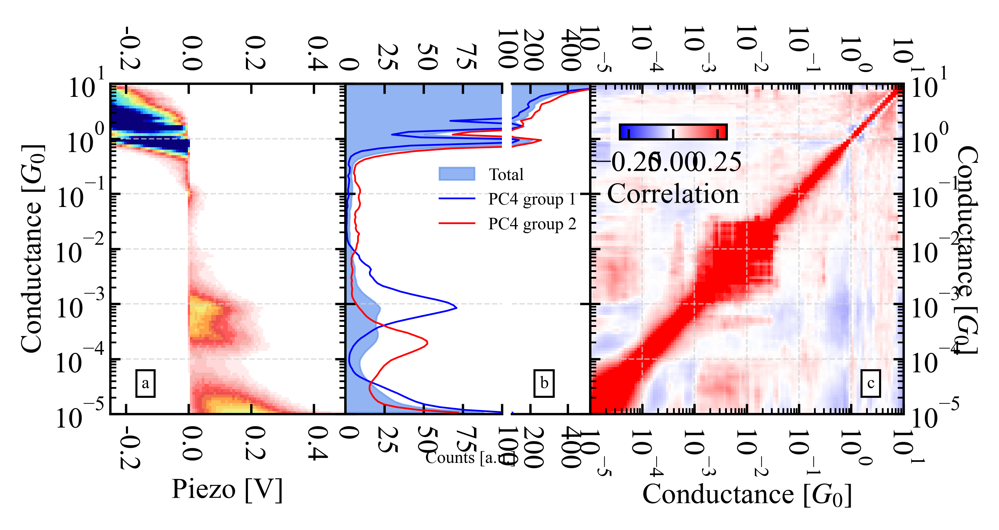

In [57]:
figsize=utils.cm2inch(12, 5)
dpi=600
fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(1, 2, figure=fig,
                  left=0.1, right=0.9, top=0.9, bottom=0.1, width_ratios=(1, 1),
                  hspace=0, wspace=0.025)

gs1 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(3, 2),
                                       subplot_spec=gs[0],
                                       wspace=0.0, hspace=0)

gs2 = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(1, 4),
                                       subplot_spec=gs[1],
                                       wspace=0.0, hspace=0)

ax_2d = fig.add_subplot(gs1[0])
ax_1d_top = fig.add_subplot(gs2[0])
ax_1d_bot = fig.add_subplot(gs1[1])
ax_corr = fig.add_subplot(gs2[1])

for ax in (ax_2d, ax_1d_bot, ax_1d_top, ax_corr):
    ax.set_yscale('log')
    ax.set_ylim(1e-5, 10)
    # ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5)

ax_1d_bot.spines[['right']].set_visible(False)
ax_1d_top.spines[['left']].set_visible(False)

ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=True, labelbottom=True)

ax_1d_bot.tick_params(which='both', left=True, right=False, top=True, bottom=True,
                      labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_1d_top.tick_params(which='both', left=False, right=True, top=True, bottom=True,
                      labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_corr.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                      labelleft=False, labelright=True, labeltop=True, labelbottom=True)

ax_2d = hist_bpy_8000.plot_hist_2d_one(direction='pull', ax=ax_2d, vmin=1000, vmax=18000)
ax_2d.set_xticks(np.arange(-0.2, 0.41, 0.2))
ax_2d.set_xticklabels(np.round(np.arange(-0.2, 0.41, 0.2), 1), rotation=270, ha='center')
ax_2d.set_xlabel('Piezo [V]')

ax_1d_bot.fill_betweenx(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7, label='Total')
ax_1d_bot.plot(pc.hist_group1[f'PC4'].hist_1d_pull, pc.hist_group1[f'PC4'].hist_1d_bins, c='b', lw=0.6, label='PC4 group 1')
ax_1d_bot.plot(pc.hist_group2[f'PC4'].hist_1d_pull, pc.hist_group2[f'PC4'].hist_1d_bins, c='r', lw=0.6, label='PC4 group 2')

ax_1d_bot.legend(fontsize=6, frameon=False, bbox_to_anchor=(0.5, 0.5))
 
ax_1d_bot.set_xlim(0, 100)
ax_1d_bot.set_xticks(np.arange(0, 101, 25))
ax_1d_bot.set_xticklabels(np.arange(0, 101, 25), rotation=270, ha='center')

ax_1d_top.fill_betweenx(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_pull, color='cornflowerblue', lw=0.6, alpha=0.7)
ax_1d_top.plot(pc.hist_group1[f'PC4'].hist_1d_pull, pc.hist_group1[f'PC4'].hist_1d_bins, c='b', lw=0.6)
ax_1d_top.plot(pc.hist_group2[f'PC4'].hist_1d_pull, pc.hist_group2[f'PC4'].hist_1d_bins, c='r', lw=0.6)

ax_1d_top.set_xlim(100, 520)
ax_1d_top.set_xticks([200, 400])
ax_1d_top.set_xticklabels([200, 400], rotation=270, ha='center')

ax_1d_bot.text(x=80, y=1.3e-6, s='Counts [a.u.]', ha='center', fontsize=6)

ax_corr.set_xlabel(r'Conductance $[G_{0}]$')
ax_corr.set_ylabel(r'Conductance $[G_{0}]$', rotation=270, labelpad=6)

ax_corr.set_xscale('log')
ax_corr.set_yscale('log')
ax_corr.xaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_corr.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_corr.xaxis.set_minor_formatter(ticker.NullFormatter())

plt.setp(ax_corr.get_xticklabels(), rotation=270)

ax_corr.yaxis.set_major_locator(ticker.LogLocator(base=10.0, subs=(1.0,), numticks=9))
ax_corr.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=9))
ax_corr.yaxis.set_minor_formatter(ticker.NullFormatter())

x_mesh, y_mesh = np.meshgrid(hist_bpy_8000.hist_1d_bins, hist_bpy_8000.hist_1d_bins)

im_norm = ax_corr.pcolormesh(x_mesh, y_mesh, hist_bpy_8000.corr_2d_pull, cmap='bwr', vmin=-0.3, vmax=0.3)

ax_corr.yaxis.set_label_position('right')

# ax_corr.set_xlim(min(x_mesh.flatten()), max(x_mesh.flatten()))
# ax_corr.set_ylim(min(y_mesh.flatten()), max(y_mesh.flatten()))

ax_corr.set_xlim(1e-5, 10)

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

cbbox = inset_axes(ax_corr, '40%', '22%', loc = 'upper left')
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

cbaxes = inset_axes(cbbox, '85%', '20%', loc = 'upper center')

cb=fig.colorbar(im_norm, cax=cbaxes, orientation='horizontal') #make colorbar

# ax_colorbar = ax_corr.inset_axes(bounds=(0.1, 0.58, 0.04, 0.35), alpha=0.5, fc='white')
# cbar = plt.colorbar(im_norm, ax_colorbar)
# cb.ax.set_yticks(np.arange(-0.3, 0.31, 0.15))
# cb.ax.set_ylabel('Correlation', rotation=270, labelpad=6)
cb.ax.set_xlabel('Correlation')

ax_2d.text(x=-0.15, y=3e-5, s=f'a', fontsize=6, bbox=bbox_props)
ax_1d_top.text(x=250, y=3e-5, s=f'b', fontsize=6, bbox=bbox_props)
ax_corr.text(x=2, y=3e-5, s=f'c', fontsize=6, bbox=bbox_props)

for ax in (ax_2d, ax_1d_bot, ax_1d_top, ax_corr):
    ax.grid(visible=True, which='major', axis='y', c='lightgrey', ls='--', lw=0.5, alpha=0.7)
    
ax_corr.grid(visible=True, which='major', axis='x', c='lightgrey', ls='--', lw=0.5, alpha=0.7)

# plt.savefig(home_folder.joinpath(f'results/principal_components/total_hists_and_corr.png'), bbox_inches='tight')

0.1


8.0

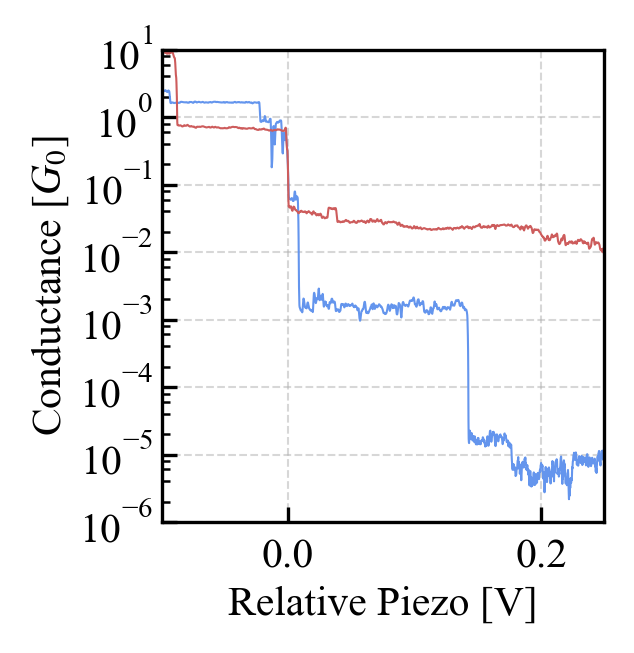

In [305]:
# 37376 38098, 39638, 41171, 42652, 43675, 41651, 41562, 40424, 41286, 42699, 38807, 41551  39707, # 41171, 38098

trace_pair = TracePair(39707, load_from=home_folder)
trace_pair.align_trace(align_at=0.1)
ax = trace_pair.plot_trace_pair(dpi=300, aligned=True, smoothing=5)

ax.set_xlim(-0.1, 0.25)
ax.set_xlabel('Relative Piezo [V]')

print(trace_pair.align_at)
trace_pair.rate

In [306]:
conductance, piezo, psd_intervals, psd_results, fft_freqs, avg_conductance_in_win, areas, conductance_windows = \
    temporal_noise_single_trace(trace_pair=trace_pair, align_at=2e-2, interpolate=True,
                                win_size=256, step_size=None, skip_points=50, end_point=3000,
                                tolerance=2, filter_method='start-end', freq_range=(2000, 5000), return_window=True)

In [307]:
avg_conductance_in_win = np.array(avg_conductance_in_win)
print(trace_pair.align_at)

0.02


D:\mcbj_stmbj\venv\lib\site-packages\matplotlib\lines.py:1155: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  neq = current != val
D:\mcbj_stmbj\venv\lib\site-packages\matplotlib\lines.py:1155: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  neq = current != val
D:\mcbj_stmbj\venv\lib\site-packages\matplotlib\lines.py:1155: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  neq = current != val
D:\mcbj_stmbj\venv\lib\site-packages\matplotlib\axis.py:124: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if labelcolor == 'inherit':


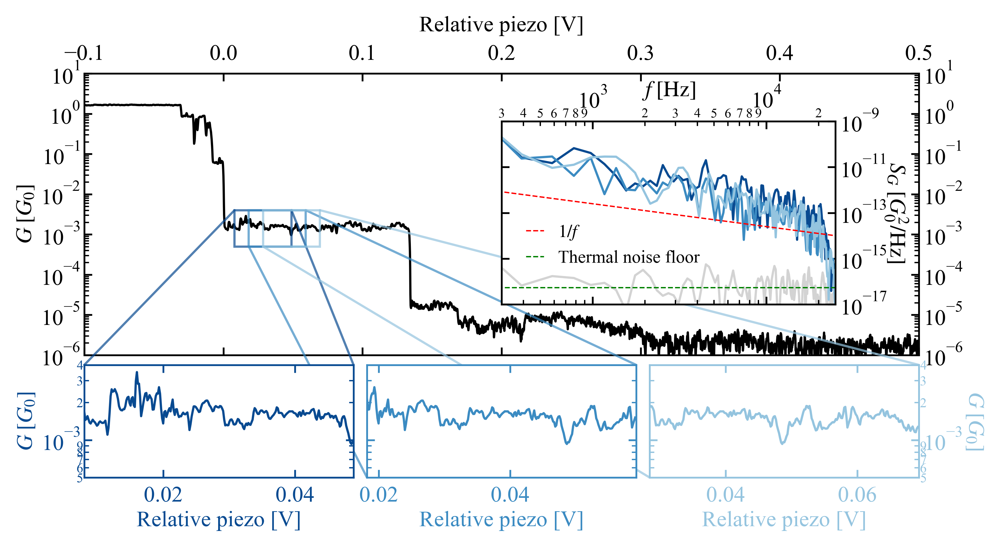

In [308]:
figsize=utils.cm2inch(16.5, 8)
dpi=600
smoothing=5
cmap='Blues'

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 1, figure=fig, height_ratios=(5, 2),
                  left=0.1, right=0.9, top=0.9, bottom=0.1,
                  hspace=0.05, wspace=0)

ax = fig.add_subplot(gs[0])

gs_wins = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=3, width_ratios=(1, 1, 1),
                                           subplot_spec=gs[1],
                                           wspace=0.05, hspace=0)

axins = [fig.add_subplot(gs_wins[i]) for i in range(3)]

ax.plot(utils.moving_average(trace_pair.aligned_piezo_pull, smoothing),
        utils.moving_average(trace_pair.conductance_pull, smoothing), c='k', lw=1)

ax.set_yscale('log')
ax.set_xlim(-0.1, 0.5)
ax.set_ylim(1e-6, 10)

psds = []
    

# my_blues = colormaps[cmap](np.linspace(0.2, 1, np.where(avg_conductance_in_win > 0)[0].shape[0]))
my_blues_alpha = colormaps[cmap](np.linspace(0.4, 0.9, 3), alpha=0.1)[::-1]
my_blues = colormaps[cmap](np.linspace(0.4, 0.9, 3))[::-1]
h=0.2

ax_psd = ax.inset_axes([0.5, 0.18, 0.4, 0.65])

ax_psd.set_xscale('log')
ax_psd.set_yscale('log')
ax_psd.set_xlim(300, 25000)
ax_psd.set_ylim(1e-17, 1e-9)

for i, win in enumerate(np.where(avg_conductance_in_win > 0)[0][:3]):
    # subregion of original image:
    x1 = trace_pair.aligned_piezo_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][0]]
    x2 = trace_pair.aligned_piezo_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][1]]
    y1 = 5e-4
    y2 = 4e-3
    
    # print(0.75-i*(h+0.05))
    # axins.append(ax.inset_axes([0.4, 0.75-i*(h+0.05), 0.18, h],
    #                            xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[]))
    
    axins[i].set_xlim(x1, x2)
    axins[i].set_ylim(y1, y2)
    
    axins[i].plot(trace_pair.aligned_piezo_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][0]:
                                                np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][1]],
                  trace_pair.conductance_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][0]:
                                                np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][1]],
                  c=my_blues[i], lw=1)
    
    axins[i].set_yscale('log')
    if i == 0:
        axins[i].tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=True, labelright=False,
                         labeltop=False, labelbottom=True, colors=my_blues[i])
        axins[i].set_ylabel(r'$G\;[G_{0}]$', c=my_blues[i])
    elif i==len(axins)-1:
        axins[i].tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=True,
                         labeltop=False, labelbottom=True, colors=my_blues[i])
        axins[i].set_ylabel(r'$G\;[G_{0}]$', c=my_blues[i], rotation=270, labelpad=10)
    else:
        axins[i].tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=False,
                             labeltop=False, labelbottom=True, colors=my_blues[i])
    
    [axins[i].spines[k].set_color(my_blues[i]) for k in axins[i].spines]
    
    ax.indicate_inset_zoom(axins[i], edgecolor=my_blues[i], alpha=0.7)
    ax_psd.plot(fft_freqs, psd_results[win], c=my_blues[i], lw=1)
    psds.append(psd_results[win])
    
ax_psd.set_ylim(1e-17)
ax_psd.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=True,
                   labeltop=True, labelbottom=False)
ax_psd.tick_params(axis='both', which='minor', labelsize=6)

def minor_tick(x, pos):
    # if not x % 1.0:
    #     return ""
    # return f"{x:.2f}"
    if np.log10(x) == np.round(np.log10(x)):
        return ""
    return f"{int(x/10**(np.floor(np.log10(x))))}"

ax_psd.yaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))

psds = np.array(psds)

x = 1 / fft_freqs[1] * 1 / max(psds[:, 20])
# print(x)

# plot 1/f line
ax_psd.plot(fft_freqs[1:], (1 / fft_freqs[1:]) / x, lw=0.6, c='r', ls='--', label=r'$1/f$')
# plot instrumental noise psd 
ax_psd.plot(fft_freqs, psd_results[30], c='lightgrey', lw=1, zorder=-1)
# plot thermal noise floor
ax_psd.plot(fft_freqs[1:], np.ones_like(fft_freqs[1:])*5.50604e-17, lw=0.6, ls='--', c='g', label='Thermal noise floor')

ax_psd.xaxis.set_minor_formatter(minor_tick)
ax_psd.yaxis.set_label_position('right')
ax_psd.xaxis.set_label_position('top')
ax_psd.set_xlabel(r'$f\;[\mathrm{Hz}]$', labelpad=-4)
ax_psd.set_ylabel(r'$S_{G}\;[G_{0}^{2}/\mathrm{Hz}]$', rotation=270, labelpad=10)
ax_psd.legend(fontsize=8, frameon=False, loc='lower left',  bbox_to_anchor=(0.025, 0.12), handlelength=1)

ax.set_xlabel('Relative piezo [V]', labelpad=6)
ax.set_ylabel(r'$G\;[G_{0}]$')
# ax.text(s=r'Conductance [$G_{0}$]', x=0.34, y=10**(-2.5), ha='center', va='center', rotation=270)

ax.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=True, labelright=True,
               labeltop=True, labelbottom=False)
ax.xaxis.set_label_position('top')

ax.yaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))

for i in range(len(axins)):
    axins[i].set_xlabel('Relative piezo [V]', c=my_blues[i])
    axins[i].yaxis.set_minor_formatter(minor_tick)
    axins[i].tick_params(axis='both', which='minor', labelsize=6)
    
axins[-1].yaxis.set_label_position('right')

# plt.savefig(home_folder.joinpath(f'results/noise/temporal_noise_windows_with_psds_1.png'), bbox_inches='tight')

D:\mcbj_stmbj\venv\lib\site-packages\matplotlib\lines.py:1155: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  neq = current != val
D:\mcbj_stmbj\venv\lib\site-packages\matplotlib\lines.py:1155: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  neq = current != val


-1.29$\pm$0.33
-1.53$\pm$0.35
(0.008007748943455795, 0.048918693198366725)


D:\mcbj_stmbj\venv\lib\site-packages\matplotlib\axis.py:124: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if labelcolor == 'inherit':


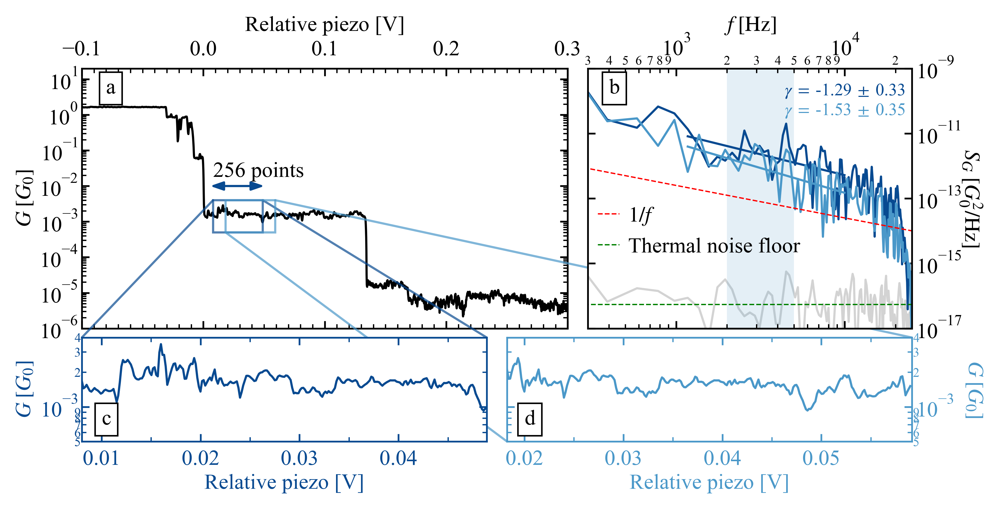

In [320]:
figsize=utils.cm2inch(16, 8)
dpi=600
smoothing=5
cmap='Blues'

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 1, figure=fig, height_ratios=(5, 2),
                  left=0.075, right=0.92, top=0.88, bottom=0.12,
                  hspace=0.05, wspace=0)

gs_example = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(3, 2),
                                              subplot_spec=gs[0],
                                              wspace=0.05, hspace=0)

gs_wins = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(1, 1),
                                           subplot_spec=gs[1],
                                           wspace=0.05, hspace=0)

ax = fig.add_subplot(gs_example[0])
ax_psd = fig.add_subplot(gs_example[1])
axins = [fig.add_subplot(gs_wins[i]) for i in range(2)]

ax.plot(utils.moving_average(trace_pair.aligned_piezo_pull, smoothing),
        utils.moving_average(trace_pair.conductance_pull, smoothing), c='k', lw=1)

ax.set_yscale('log')
ax.set_xlim(-0.1, 0.3)
ax.set_ylim(1e-6, 20)

psds = []
    

# my_blues = colormaps[cmap](np.linspace(0.2, 1, np.where(avg_conductance_in_win > 0)[0].shape[0]))
my_blues_alpha = colormaps[cmap](np.linspace(0.6, 0.9, 2), alpha=0.1)[::-1]
my_blues = colormaps[cmap](np.linspace(0.6, 0.9, 2))[::-1]
h=0.2

# ax_psd = ax.inset_axes([0.5, 0.18, 0.4, 0.65])

ax_psd.set_xscale('log')
ax_psd.set_yscale('log')
ax_psd.set_xlim(300, 25000)
ax_psd.set_ylim(1e-17, 1e-9)

x_coords=[]
gamma_text_y_coord = (2e-10, 5e-11)

for i, win in enumerate(np.where(avg_conductance_in_win > 0)[0][0:2]):
    # subregion of original image:
    x1 = trace_pair.aligned_piezo_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][0]]
    x2 = trace_pair.aligned_piezo_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][1]]
    y1 = 5e-4
    y2 = 4e-3
    
    x_coords.append((x1, x2))
    
    # print(0.75-i*(h+0.05))
    # axins.append(ax.inset_axes([0.4, 0.75-i*(h+0.05), 0.18, h],
    #                            xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[]))
    
    axins[i].set_xlim(x1, x2)
    axins[i].set_ylim(y1, y2)
    
    axins[i].plot(trace_pair.aligned_piezo_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][0]:
                                                np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][1]],
                  trace_pair.conductance_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][0]:
                                                np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][1]],
                  c=my_blues[i], lw=1)
    
    axins[i].set_yscale('log')
    if i == 0:
        axins[i].tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=True, labelright=False,
                         labeltop=False, labelbottom=True, colors=my_blues[i])
        axins[i].set_ylabel(r'$G\;[G_{0}]$', c=my_blues[i])
    elif i==len(axins)-1:
        axins[i].tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=True,
                         labeltop=False, labelbottom=True, colors=my_blues[i])
        axins[i].set_ylabel(r'$G\;[G_{0}]$', c=my_blues[i], rotation=270, labelpad=10)
    else:
        axins[i].tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=False,
                             labeltop=False, labelbottom=True, colors=my_blues[i])
    
    [axins[i].spines[k].set_color(my_blues[i]) for k in axins[i].spines]
    
    ax.indicate_inset_zoom(axins[i], edgecolor=my_blues[i], alpha=0.7)
    
    ax_psd.plot(fft_freqs, psd_results[win], c=my_blues[i], lw=1)
    popt, perr, freq_in_range, psd_fit = fit_line_to_psd(fft_freqs, psd_results[win], fit_range=(1000, 10_000))
    
    print(f'{np.round(popt[0], 2)}'+r'$\pm$'+f'{np.round(perr[0], 2)}')
    ax_psd.plot(freq_in_range, psd_fit, c=my_blues[i], lw=1)
    ax_psd.text(s=r'$\gamma\;=\;$'+f'{np.round(popt[0], 2)}'+r'$\;\pm\;$'+f'{np.round(perr[0], 2)}',
                x=1e4, y=gamma_text_y_coord[i], fontsize=8, c=my_blues[i], va='center', ha='center')
    psds.append(psd_results[win])
    
ax_psd.set_ylim(1e-17)
ax_psd.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=True,
                   labeltop=True, labelbottom=False)
ax_psd.tick_params(axis='both', which='minor', labelsize=6)

def minor_tick(x, pos):
    # if not x % 1.0:
    #     return ""
    # return f"{x:.2f}"
    if np.log10(x) == np.round(np.log10(x)):
        return ""
    return f"{int(x/10**(np.floor(np.log10(x))))}"

ax_psd.yaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))

psds = np.array(psds)

x = 1 / fft_freqs[1] * 1 / max(psds[:, 20])
# print(x)

# plot 1/f line
ax_psd.plot(fft_freqs[1:], (1 / fft_freqs[1:]) / x, lw=0.6, c='r', ls='--', label=r'$1/f$')
# plot instrumental noise psd 
ax_psd.plot(fft_freqs, psd_results[30], c='lightgrey', lw=1, zorder=-1)
# plot thermal noise floor
ax_psd.plot(fft_freqs[1:], np.ones_like(fft_freqs[1:])*5.50604e-17, lw=0.6, ls='--', c='g', label='Thermal noise floor')

ax_psd.xaxis.set_minor_formatter(minor_tick)
ax_psd.yaxis.set_label_position('right')
ax_psd.xaxis.set_label_position('top')
ax_psd.set_xlabel(r'$f\;[\mathrm{Hz}]$', labelpad=2)
ax_psd.set_ylabel(r'$S_{G}\;[G_{0}^{2}/\mathrm{Hz}]$', rotation=270, labelpad=10)

ax_psd.legend(fontsize=10, frameon=False, loc='lower left',  bbox_to_anchor=(-0.03, 0.2), handlelength=1, handletextpad=0.4)

ax.set_xlabel('Relative piezo [V]', labelpad=2)
ax.set_ylabel(r'$G\;[G_{0}]$')
# ax.text(s=r'Conductance [$G_{0}$]', x=0.34, y=10**(-2.5), ha='center', va='center', rotation=270)

ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
               labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax.xaxis.set_label_position('top')

ax.yaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))

ax.xaxis.set_minor_locator(MultipleLocator(0.01))

for i in range(len(axins)):
    axins[i].set_xlabel('Relative piezo [V]', c=my_blues[i])
    axins[i].yaxis.set_minor_formatter(minor_tick)
    axins[i].tick_params(axis='both', which='minor', labelsize=6)
    axins[i].xaxis.set_minor_locator(MultipleLocator(0.005))
    
axins[-1].yaxis.set_label_position('right')

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)

ax.text(x=-0.08, y=4, s=f'a', fontsize=10, bbox=bbox_props)
ax_psd.text(x=4e2, y=1.7e-10, s=f'b', fontsize=10, bbox=bbox_props)
# axins[0].text(x=0.021, y=2.3e-3, s=f'c', fontsize=10, bbox=bbox_props)
# axins[1].text(x=0.031, y=2.3e-3, s=f'd', fontsize=10, bbox=bbox_props)

axins[0].text(x=0.01, y=7e-4, s=f'c', fontsize=10, bbox=bbox_props)
axins[1].text(x=0.02, y=7e-4, s=f'd', fontsize=10, bbox=bbox_props)

# ax.text(x=0.9, y=0.85, s=f'a', fontsize=8, bbox=bbox_props, transform=ax.transAxes)
# ax_psd.text(x=0.9, y=0.85, s=f'b', fontsize=8, bbox=bbox_props, transform=ax_psd.transAxes)
# axins[0].text(x=0.9, y=0.625, s=f'c', fontsize=8, bbox=bbox_props, transform=axins[0].transAxes)
# axins[1].text(x=0.9, y=0.625, s=f'd', fontsize=8, bbox=bbox_props, transform=axins[1].transAxes)

print(x_coords[0])

# ax.axvline(x_coords[0][0]+0.005, lw=0.5, ls='--')

# ax.text(s='256 points', x=(x_coords[0][0]+x_coords[0][1])/2, y=2.5e-2, fontsize=10, ha='center', va='center')
ax.text(s='256 points', x=x_coords[0][0], y=2.5e-2, fontsize=10, ha='left', va='center')

ax.annotate("",
            xy=(x_coords[0][0]-0.006, 1e-2), xycoords=ax.transData,
            xytext=(x_coords[0][1]+0.005, 1e-2), textcoords=ax.transData,
            arrowprops=dict(arrowstyle="<|-|>,head_length=0.35,head_width=0.12", color=my_blues[0]))

ax_psd.axvspan(xmin=2000, xmax=5000, ymin=0, ymax=1, color=my_blues[-1], alpha=0.15, ec='None')

fig.align_xlabels([ax, ax_psd])
fig.align_ylabels([ax_psd, axins[-1]])
fig.align_ylabels([ax, axins[0]])

# plt.savefig(home_folder.joinpath(f'results/noise/temporal_noise_windows_with_psds_2_w_psd_fits.png'))

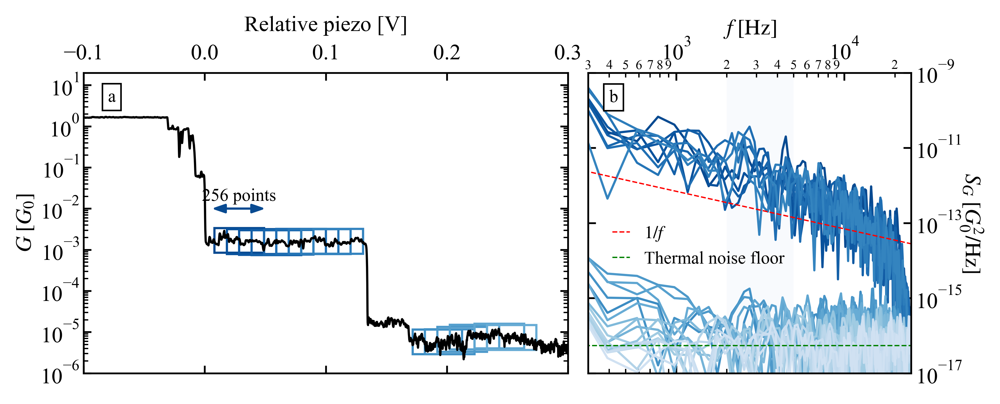

In [238]:
figsize=utils.cm2inch(16.5, 6)
dpi=600
smoothing=5
cmap='Blues'

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(1, 1, figure=fig,
                  left=0.1, right=0.9, top=0.9, bottom=0.1,
                  hspace=0.05, wspace=0)

gs_example = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(3, 2),
                                              subplot_spec=gs[0],
                                              wspace=0.05, hspace=0)

ax = fig.add_subplot(gs_example[0])
ax_psd = fig.add_subplot(gs_example[1])

ax.plot(utils.moving_average(trace_pair.aligned_piezo_pull, smoothing),
        utils.moving_average(trace_pair.conductance_pull, smoothing), c='k', lw=1)

ax.set_yscale('log')
ax.set_xlim(-0.1, 0.3)
ax.set_ylim(1e-6, 20)

psds = []
    
my_blues = colormaps[cmap](np.linspace(0.2, 0.9, len(np.where(avg_conductance_in_win > 0)[0])))[::-1]
h=0.2

ax_psd.set_xscale('log')
ax_psd.set_yscale('log')
ax_psd.set_xlim(300, 25000)
ax_psd.set_ylim(1e-17, 1e-9)

x_coords=[]

from matplotlib.patches import PathPatch
from matplotlib.path import Path

vertices = []
codes = []

for i, win in enumerate(np.where(avg_conductance_in_win > 0)[0]):
    # subregion of original image:
    x1 = trace_pair.aligned_piezo_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][0]]
    x2 = trace_pair.aligned_piezo_pull[np.where(trace_pair.aligned_piezo_pull > 0)[0][0] + conductance_windows[win][1]]
    y1 = 2*avg_conductance_in_win[win]
    y2 = 0.5*avg_conductance_in_win[win]
    
    x_coords.append((x1, x2))
    
    codes = [Path.MOVETO] + [Path.LINETO]*3 + [Path.CLOSEPOLY]
    vertices = [(x1, y1), (x1, y2), (x2, y2), (x2, y1), (0, 0)]

    ax_psd.plot(fft_freqs, psd_results[win], c=my_blues[i], lw=1)
    psds.append(psd_results[win])

    path = Path(vertices, codes)
    pathpatch = PathPatch(path, facecolor='none', edgecolor=my_blues[i], lw=1)
    ax.add_patch(pathpatch)
    
ax_psd.set_ylim(1e-17)
ax_psd.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=True,
                   labeltop=True, labelbottom=False)
ax_psd.tick_params(axis='both', which='minor', labelsize=6)

def minor_tick(x, pos):
    if np.log10(x) == np.round(np.log10(x)):
        return ""
    return f"{int(x/10**(np.floor(np.log10(x))))}"

ax_psd.yaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))

psds = np.array(psds)

x = 1 / fft_freqs[1] * 1 / max(psds[:, 20])

# plot 1/f line
ax_psd.plot(fft_freqs[1:], (1 / fft_freqs[1:]) / x, lw=0.6, c='r', ls='--', label=r'$1/f$')
# plot instrumental noise psd 
ax_psd.plot(fft_freqs, psd_results[30], c='lightgrey', lw=1, zorder=-1)
# plot thermal noise floor
ax_psd.plot(fft_freqs[1:], np.ones_like(fft_freqs[1:])*5.50604e-17, lw=0.6, ls='--', c='g', label='Thermal noise floor')

ax_psd.xaxis.set_minor_formatter(minor_tick)
ax_psd.yaxis.set_label_position('right')
ax_psd.xaxis.set_label_position('top')
ax_psd.set_xlabel(r'$f\;[\mathrm{Hz}]$', labelpad=2)
ax_psd.set_ylabel(r'$S_{G}\;[G_{0}^{2}/\mathrm{Hz}]$', rotation=270, labelpad=10)
ax_psd.legend(fontsize=8, frameon=False, loc='lower left',  bbox_to_anchor=(0.025, 0.3), handlelength=1)

ax.set_xlabel('Relative piezo [V]', labelpad=6)
ax.set_ylabel(r'$G\;[G_{0}]$')

ax.tick_params(which='both', left=True, right=True, top=True, bottom=True,
               labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax.xaxis.set_label_position('top')

ax.yaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)

ax.text(x=-0.08, y=4, s=f'a', fontsize=8, bbox=bbox_props)
ax_psd.text(x=4e2, y=1.7e-10, s=f'b', fontsize=8, bbox=bbox_props)

# print(x_coords[0])

ax.text(s='256 points', x=(x_coords[0][0]+x_coords[0][1])/2, y=2e-2, fontsize=8, ha='center', va='center')

ax.annotate("",
            xy=(x_coords[0][0]-0.006, 1e-2), xycoords=ax.transData,
            xytext=(x_coords[0][1]+0.005, 1e-2), textcoords=ax.transData,
            arrowprops=dict(arrowstyle="<|-|>,head_length=0.35,head_width=0.12", color=my_blues[0]))

ax_psd.axvspan(xmin=2000, xmax=5000, ymin=0, ymax=1, color=my_blues[-1], alpha=0.15, ec='None')

# plt.savefig(home_folder.joinpath(f'results/noise/temporal_noise_windows_with_psds_2.png'), bbox_inches='tight')

In [64]:
avg_conductance_in_win = np.array(avg_conductance_in_win)

In [65]:
np.where(avg_conductance_in_win > 0)[0].shape

(26,)

In [66]:
trace_pair.aligned_piezo_pull[50]

-3.9932743692378523

In [67]:
# psd_intervals

In [68]:
conductance

array([1.7927365e-02, 5.4948889e-03, 4.8150555e-03, ..., 2.7491567e-06,
       1.0764525e-06, 1.8634692e-06], dtype=float32)

In [69]:
len(conductance_windows)

42

In [70]:
# psd_intervals

In [71]:
psd_results

array([[9.8012345e-09, 4.4634723e-09, 2.6473998e-11, ..., 9.1430602e-17,
        1.7075551e-17, 5.1000871e-21],
       [8.2837754e-09, 4.3326929e-09, 2.3832903e-11, ..., 4.0576974e-17,
        1.6246380e-17, 1.0002415e-19],
       [7.5311517e-09, 3.4069798e-09, 3.6416373e-11, ..., 1.3580770e-16,
        1.1656476e-17, 1.1564824e-19],
       ...,
       [1.0167130e-14, 5.2197499e-15, 3.6637980e-17, ..., 2.2316746e-17,
        7.9641949e-17, 1.3913793e-17],
       [1.0371479e-14, 5.2662643e-15, 3.6069485e-17, ..., 3.2847752e-17,
        1.0045986e-16, 3.2071913e-17],
       [9.6982282e-15, 4.9673184e-15, 2.5233186e-17, ..., 7.1585527e-17,
        3.2275995e-17, 3.4016258e-17]], dtype=float32)

In [72]:
def igor_gaussian_fun(x, y0, A, x0, width):
    
    """
    x0: mean
    width/2: variance
    A: amplitude
    y0: vertical offset
    """
    
    return y0 + A * np.exp( -1 * ((x - x0)/width)**2 )

In [73]:
def calc_expected_noise(conductance_range=(5e-5, 3e-3), break_point=2e-4, logy_shift=-3.1, num_points=50):
    x_values = np.linspace(start=conductance_range[0], stop=conductance_range[1], num=num_points)
    const_value = x_values[x_values > break_point][0]
    expectation = np.where(x_values <= break_point,
                  10**(logy_shift + (-0.5) * np.log10(x_values)),
                  10**(logy_shift + (-0.5) * np.log10(const_value)))
    
    return x_values, expectation

In [77]:
print(psd_results[0].shape)
print(fft_freqs.shape)

(129,)
(129,)


In [82]:
def fit_func_lin(x, a, b):
    """
    Linear function for line fitting

    Parameters
    ----------
    x : np.ndarray
        variable
    a : float
        (-1) * the slope of the line
    b : float
        intercept

    Returns
    -------
    res : np.ndarray
        line
    """
    # x = log(f)
    return a * x + b

def fit_line_to_psd(freq: np.ndarray, psd: np.ndarray, fit_range: Tuple[float, float]):
    """
    Fit a line to a single PSD and return the line parameters

    Parameters
    ----------
    freq : np.ndarray
        frequency
    psd : np.ndarray
        calculated PSD
    fit_range : Tuple[float, float]
        frequency range to fit line

    Returns
    -------
    popt : np.ndarray
        the slope and the intercept of the fitted line
    perr : np.ndarray
        standard deviation error of the slope and the intercept
    """
    popt, pcov = scipy.optimize.curve_fit(fit_func_lin,
                                          np.log10(freq[np.bitwise_and(freq > fit_range[0], freq < fit_range[1])]),
                                          np.log10(psd[np.bitwise_and(freq > fit_range[0], freq < fit_range[1])]))
    perr = np.sqrt(np.diag(pcov))  # standard deviation error
    
    freq_in_range = freq[np.bitwise_and(freq > fit_range[0], freq < fit_range[1])]
    psd_fit = 10**fit_func_lin(np.log10(freq_in_range), *popt)

    return popt, perr, freq_in_range, psd_fit

[-1.28501834 -7.14356333]


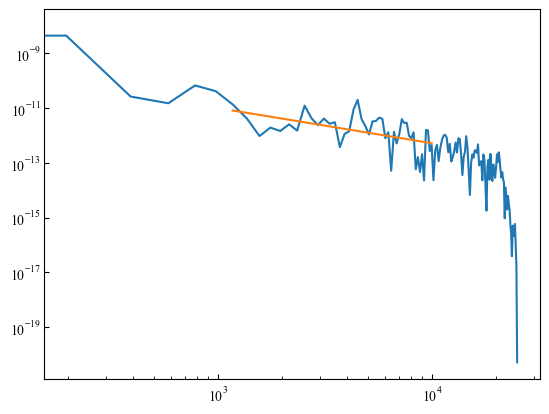

In [83]:
fig, ax = plt.subplots(1)

popt, perr, freq_in_range, psd_fit = fit_line_to_psd(fft_freqs, psd_results[0], fit_range=(1000, 10_000))

ax.plot(fft_freqs, psd_results[0])
ax.plot(freq_in_range, psd_fit)
ax.set_xscale('log')
ax.set_yscale('log')

print(popt) # gamma = popt[0]

In [106]:
traces_bpy_8000 = []
windows_bpy_8000 = []
avg_conds_bpy_8000 = []
gammas_bpy_8000 = []
err_gammas_bpy_8000 = []

for trace in tqdm(hist_bpy_8000.traces):

    trace_pair = TracePair(trace, load_from=home_folder)
    try:
        conductance, piezo, psd_intervals, psd_results, fft_freqs, avg_conductance_in_win, areas, conductance_windows = \
            temporal_noise_single_trace(trace_pair=trace_pair, align_at=2e-2, interpolate=True,
                                        win_size=256, step_size=None, skip_points=50, end_point=3000,
                                        tolerance=2, filter_method='start-end', freq_range=(2000, 5000), return_window=True)

        for i, avg_cond in enumerate(avg_conductance_in_win):
            if avg_cond > 0:
                popt, perr, freq_in_range, psd_fit = fit_line_to_psd(fft_freqs, psd_results[i], fit_range=(1000, 10_000))

                traces_bpy_8000.append(trace)
                windows_bpy_8000.append(i)
                avg_conds_bpy_8000.append(avg_cond)
                gammas_bpy_8000.append(popt[0])
                err_gammas_bpy_8000.append(perr[0])
    except IndexError:
        print(trace_pair.trace_num)

  0%|          | 0/8000 [00:00<?, ?it/s]

36701


D:\mcbj_stmbj\utils.py:958: RuntimeWarning: divide by zero encountered in double_scalars
  return ind1[0] + (y - ind1[1]) * (ind2[0] - ind1[0]) / (ind2[1] - ind1[1])


39442
43599


In [281]:
max(gammas_bpy_8000)

2.3208820309977596

In [282]:
xrange = (1e-5, 1e-2)
yrange = (-2.5, 0)

num_bins = 20

num_of_decs_x = np.log10(xrange[1]) - np.log10(xrange[0])
num_of_decs_y = 2

print(num_of_decs_x, num_of_decs_y)

xbins = np.logspace(np.log10(xrange[0]), np.log10(xrange[1]), num=int(num_bins * num_of_decs_x))
ybins = np.linspace(yrange[0], yrange[1], num=int(num_bins * num_of_decs_y))

h, xedges, yedges = np.histogram2d(avg_conds_bpy_8000, gammas_bpy_8000, bins=[xbins, ybins])
x_mesh, y_mesh = np.meshgrid(xedges, yedges)

gamma_hist_2d_bpy_8000 = h.T

3.0 2


In [283]:
ymiddle = yedges[:-1] + np.diff(yedges)/2
xmiddle = xedges[:-1] + np.diff(xedges)/2

D:\mcbj_stmbj\venv\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
D:\mcbj_stmbj\venv\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
D:\mcbj_stmbj\venv\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
D:\mcbj_stmbj\venv\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
D:\mcbj_stmbj\venv\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.

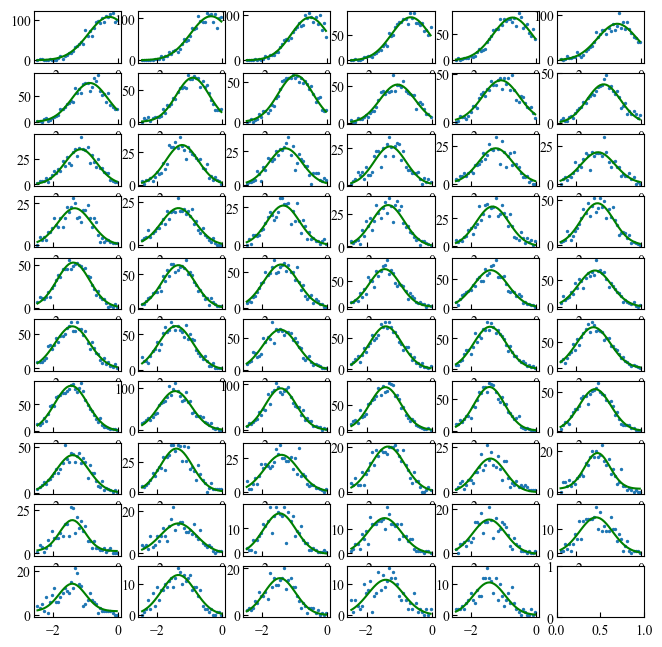

In [284]:
nr = 10
nc = 6

fig, ax = plt.subplots(nrows=nr, ncols=nc, figsize=utils.cm2inch(20, 20))

# ax.set_yscale('log')

popts_8000 = []
popts_norm_8000 = []
perrs_8000 = []

gamma_2d_gauss_8000 = []
gamma_2d_gauss_norm_8000 = []

for i in range(gamma_hist_2d_bpy_8000.shape[1]):
    max_val = max(gamma_hist_2d_bpy_8000[:, i])
    max_val_at = ymiddle[gamma_hist_2d_bpy_8000[:, i] == max_val][0]
    # print(max_val_at)
    
    ax[i//nc, i%nc].scatter(ymiddle, gamma_hist_2d_bpy_8000[:, i], s=2)

    popt, pcov = scipy.optimize.curve_fit(igor_gaussian_fun, ymiddle, gamma_hist_2d_bpy_8000[:, i],
                                          p0=(1e-10, 1, max_val_at, 1))
    perr = np.sqrt(np.diag(pcov))
    
    popts_8000.append(popt)
    popts_norm_8000.append(np.append(np.array([0, 1]), popt[2:]))
    perrs_8000.append(perr)

    ax[i//nc, i%nc].plot(ymiddle, igor_gaussian_fun(ymiddle, *popts_8000[-1]), c='g')

    gamma_2d_gauss_8000.append(igor_gaussian_fun(ymiddle, *popts_8000[-1]))
    gamma_2d_gauss_norm_8000.append(igor_gaussian_fun(ymiddle, *popts_norm_8000[-1]))
    
    # y_resolution = np.linspace(np.log10(ymiddle[0]), np.log10(ymiddle[-1]), num=100)
    # ax.plot(10**y_resolution, igor_gaussian_fun(y_resolution, *popts[-1]))

In [285]:
popts_8000 = np.array(popts_8000)
perrs_8000 = np.array(perrs_8000)
popts_norm = np.array(popts_norm_8000)

gamma_2d_gauss_8000 = np.array(gamma_2d_gauss_8000).T
gamma_2d_gauss_norm_8000 = np.array(gamma_2d_gauss_norm_8000).T
gauss_fit_mean_8000 = popts_8000[:, 2]

0.0
102.0
0.014028498308451891
0.9988988897999581


C:\Users\Admin\AppData\Local\Temp\ipykernel_18692\3631719301.py:83: RuntimeWarning: divide by zero encountered in log10
  if np.log10(x) == np.round(np.log10(x)):


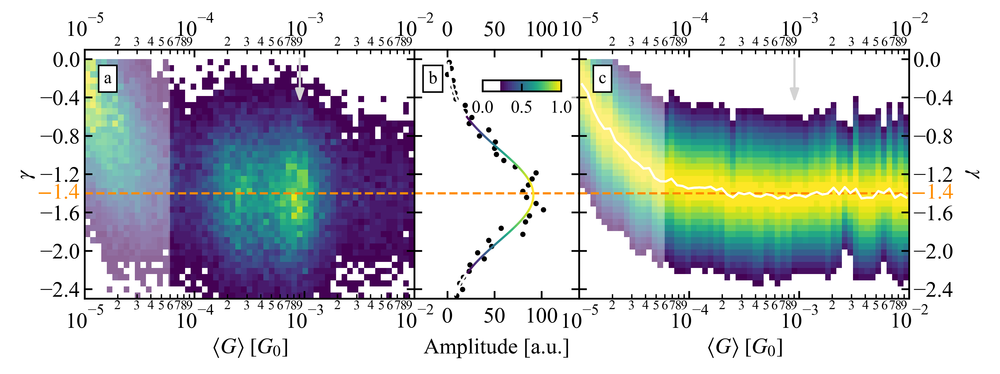

In [301]:
figsize=utils.cm2inch(16.5, 5)
dpi=600
# smoothing=5
# cmap='Blues'

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(1, 3, figure=fig,
                  left=0.1, right=0.9, top=0.9, bottom=0.1, width_ratios=(2, 1, 2),
                  hspace=0.05, wspace=0)

ax_2d = fig.add_subplot(gs[0])
ax_gauss = fig.add_subplot(gs[1], sharey=ax_2d)
ax_2d_norm = fig.add_subplot(gs[2], sharey=ax_2d)
# ax_gauss_norm = fig.add_subplot(gs[1, 1])

ax_2d.set_xscale('log')

ax_2d_norm.set_xscale('log')

# Select which slice is plotted in ax_gauss

which = 38  # -4

my_cmap = utils.cmap_geo32

my_cmap = ListedColormap(np.vstack((np.array([1., 1., 1., 0.]).reshape(1, -1), colormaps['viridis'](np.linspace(0.0, 1.0, 31)))))
my_cmap_opaque = ListedColormap(np.vstack((np.array([1., 1., 1., 1.]).reshape(1, -1), colormaps['viridis'](np.linspace(0.0, 1.0, 31)))))

from copy import copy

ax_2d.axhline(-1.4, ls='--', lw=1, c='darkorange')
ax_gauss.axhline(-1.4, ls='--', lw=1, c='darkorange')
ax_2d_norm.axhline(-1.4, ls='--', lw=1, c='darkorange')

ax_gauss.scatter(gamma_hist_2d_bpy_8000[:, which], ymiddle, s=2, c='k')

perc = 50

ymiddle_log_res = np.linspace(ymiddle.min(), ymiddle.max(), num=200)

norm1 = plt.Normalize(np.percentile(gamma_2d_gauss_norm_8000, perc),
                      igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]).max())

# norm1 = plt.Normalize(np.percentile(gamma_2d_gauss_norm_8000, perc), 1)

points2 = np.array([igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]), ymiddle_log_res]).T.reshape(-1, 1, 2)
segments2 = np.concatenate([points2[:-1], points2[1:]], axis=1)

# norm2 = plt.Normalize(igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).min(),
#                       igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())

norm2 = plt.Normalize(0.2*igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max(),
                      igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())

# norm2 = plt.Normalize(gamma_hist_2d_bpy_8000[:, which].min(),
#                       gamma_hist_2d_bpy_8000[:, which].max())

# norm2 = plt.Normalize(np.percentile(gamma_hist_2d_bpy_8000, perc),
#                       igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())
lc2 = LineCollection(segments2, cmap=my_cmap_opaque, norm=norm2)
lc2.set_array(igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]))
lc2.set_linewidth(1)
line2 = ax_gauss.add_collection(lc2)

# normalized

# Plot 2D histograms

im = ax_2d.pcolormesh(x_mesh, y_mesh, gamma_hist_2d_bpy_8000, cmap=my_cmap)
im_norm = ax_2d_norm.pcolormesh(x_mesh, y_mesh, gamma_2d_gauss_norm_8000, cmap=my_cmap, vmin=0.2*gamma_2d_gauss_norm_8000[:, which].max())

ax_2d_norm.plot(xmiddle, gauss_fit_mean_8000, c='white', alpha=1, lw=1)

# Tick settings
ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=True, labelbottom=True)
ax_2d_norm.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=True, labelbottom=True)
ax_gauss.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                     labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_2d.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))
ax_2d_norm.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d_norm.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))

# Add annotation

ax_2d.annotate("",
               xy=(xmiddle[which], -0.5), xycoords=ax_2d.transData,
               xytext=(xmiddle[which], 0.05), textcoords=ax_2d.transData,
               arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='lightgrey'))

ax_2d_norm.annotate("",
                    xy=(xmiddle[which], -0.5), xycoords=ax_2d_norm.transData,
                    xytext=(xmiddle[which], 0.05), textcoords=ax_2d_norm.transData,
                    arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='lightgrey'))

ax_gauss.set_xlabel('Amplitude [a.u.]', labelpad=5)
ax_2d.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')

ax_2d.set_ylabel(r'$\gamma$')
ax_2d_norm.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')

ax_2d_norm.set_ylabel(r'$\gamma$', rotation=270, labelpad=14)
ax_2d_norm.yaxis.set_label_position('right')

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
label_x = {ax_2d: 1.5e-5, ax_gauss: -20, ax_2d_norm: 1.5e-5}
for ax, i in zip((ax_2d, ax_gauss, ax_2d_norm), ('a', 'b', 'c')):
    ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
    ax.text(s=i, x=label_x[ax], y=-0.25, fontsize=8, bbox=bbox_props)
    # plt.setp(ax.get_xticklabels(), rotation=270)
    
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

cbbox = inset_axes(ax_gauss, '70%', '22%', loc = 'upper left', bbox_to_anchor=(0.33,0,0.8,1), bbox_transform=ax_gauss.transAxes)
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

cbaxes = inset_axes(cbbox, '85%', '20%', loc = 'upper right')

cb=fig.colorbar(lc2, cax=cbaxes, orientation='horizontal') #make colorbar
cbaxes.set_xticks(np.linspace(start=0.0, stop=igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max(), num=3))
cbaxes.set_xticklabels(np.linspace(start=0, stop=1, num=3), fontsize=8)
cbaxes.set_xlim(0.0, igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())
cbaxes.margins(x=0)

print(gamma_hist_2d_bpy_8000[:, which].min())
print(gamma_hist_2d_bpy_8000[:, which].max())
print(gamma_2d_gauss_norm_8000[:, which].min())
print(gamma_2d_gauss_norm_8000[:, which].max())

ax_gauss.set_xlim(-35, 140)
ax_gauss.set_xticks((0, 50, 100))

ax_2d_norm.plot(xmiddle, gauss_fit_mean_8000, c='white', alpha=1, lw=1)

ax_2d.set_ylim(-2.5, 0.1)
ax_2d.set_yticks(np.arange(-2.4, 0.1, 0.4))
# ax_2d.set_xlim(6e-5, 3e-3)
# ax_2d_norm.set_xlim(6e-5, 3e-3)

ax_2d.xaxis.set_minor_formatter(minor_tick)
ax_2d_norm.xaxis.set_minor_formatter(minor_tick)

ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=True, labelright=False,
                  labeltop=True, labelbottom=True)
ax_2d.tick_params(axis='both', which='minor', labelsize=6)

ax_2d_norm.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=True,
                       labeltop=True, labelbottom=True)
ax_2d_norm.tick_params(axis='both', which='minor', labelsize=6)

ax_2d.text(s=r'$-1.4$', x=9e-6, y=-1.4, fontsize=10, c='darkorange', va='center', ha='right')
ax_2d_norm.text(s=r'$-1.4$', x=1.04e-2, y=-1.4, fontsize=10, c='darkorange', va='center', ha='left')

ax_2d.axvspan(xmin=1e-5, xmax=6e-5, color='white', alpha=0.4, ec='None')
ax_2d_norm.axvspan(xmin=1e-5, xmax=6e-5, color='white', alpha=0.4, ec='None')

plt.savefig(home_folder.joinpath(f'results/noise/bpy_8000_psd_gamma_2d_gauss.png'), bbox_inches='tight')

C:\Users\Admin\AppData\Local\Temp\ipykernel_18692\3631719301.py:83: RuntimeWarning: divide by zero encountered in log10
  if np.log10(x) == np.round(np.log10(x)):


0.0
102.0
0.014028498308451891
0.9988988897999581


C:\Users\Admin\AppData\Local\Temp\ipykernel_18692\3631719301.py:83: RuntimeWarning: divide by zero encountered in log10
  if np.log10(x) == np.round(np.log10(x)):
C:\Users\Admin\AppData\Local\Temp\ipykernel_18692\915639023.py:105: RuntimeWarning: divide by zero encountered in log10
  if np.log10(x) == np.round(np.log10(x)):


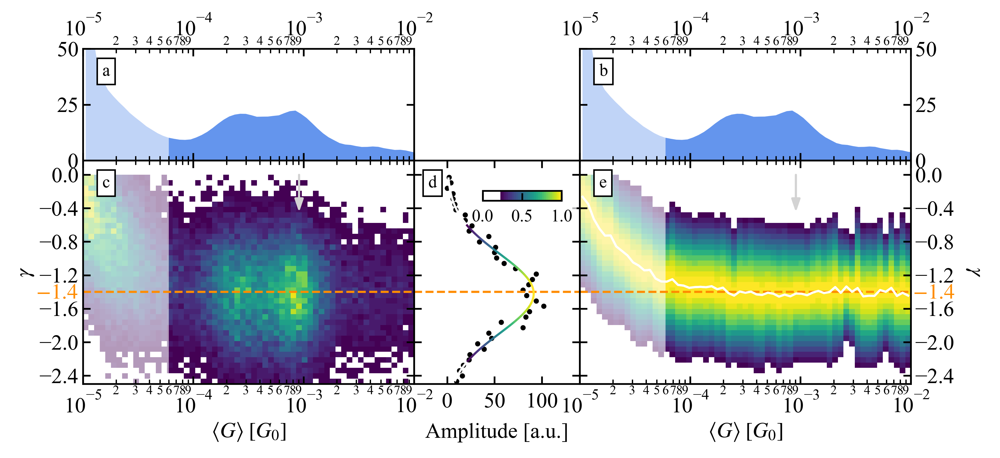

In [321]:
figsize=utils.cm2inch(16, 7.5)
dpi=600
# smoothing=5
# cmap='Blues'

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 3, figure=fig,
                  left=0.075, right=0.92, top=0.87, bottom=0.14, width_ratios=(2, 1, 2), height_ratios=(1, 2),
                  hspace=0, wspace=0)

ax_1d_1 = fig.add_subplot(gs[0, 0], sharex=ax_2d)
ax_1d_2 = fig.add_subplot(gs[0, 2], sharex=ax_2d_norm, sharey=ax_1d_1)

ax_2d = fig.add_subplot(gs[1, 0])
ax_gauss = fig.add_subplot(gs[1, 1], sharey=ax_2d)
ax_2d_norm = fig.add_subplot(gs[1, 2], sharey=ax_2d)
# ax_gauss_norm = fig.add_subplot(gs[1, 1])


# plot 1D histograms

ax_1d_1.fill_between(hist_bpy_8000.hist_1d_bins, np.zeros_like(hist_bpy_8000.hist_1d_pull), hist_bpy_8000.hist_1d_pull, color='cornflowerblue', ec='None')
ax_1d_2.fill_between(hist_bpy_8000.hist_1d_bins, np.zeros_like(hist_bpy_8000.hist_1d_pull), hist_bpy_8000.hist_1d_pull, color='cornflowerblue', ec='None')

ax_1d_1.set_xlim(1e-5, 1e-2)
ax_1d_2.set_xlim(1e-5, 1e-2)
ax_1d_1.set_ylim(0, 50)
ax_1d_2.set_ylim(0, 50)

ax_2d.set_xscale('log')
ax_2d_norm.set_xscale('log')

# Select which slice is plotted in ax_gauss

which = 38  # -4

my_cmap = utils.cmap_geo32

my_cmap = ListedColormap(np.vstack((np.array([1., 1., 1., 0.]).reshape(1, -1), colormaps['viridis'](np.linspace(0.0, 1.0, 31)))))
my_cmap_opaque = ListedColormap(np.vstack((np.array([1., 1., 1., 1.]).reshape(1, -1), colormaps['viridis'](np.linspace(0.0, 1.0, 31)))))

from copy import copy

ax_2d.axhline(-1.4, ls='--', lw=1, c='darkorange')
ax_gauss.axhline(-1.4, ls='--', lw=1, c='darkorange')
ax_2d_norm.axhline(-1.4, ls='--', lw=1, c='darkorange')

ax_gauss.scatter(gamma_hist_2d_bpy_8000[:, which], ymiddle, s=2, c='k')

perc = 50

ymiddle_log_res = np.linspace(ymiddle.min(), ymiddle.max(), num=200)

norm1 = plt.Normalize(np.percentile(gamma_2d_gauss_norm_8000, perc),
                      igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]).max())

# norm1 = plt.Normalize(np.percentile(gamma_2d_gauss_norm_8000, perc), 1)

points2 = np.array([igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]), ymiddle_log_res]).T.reshape(-1, 1, 2)
segments2 = np.concatenate([points2[:-1], points2[1:]], axis=1)

# norm2 = plt.Normalize(igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).min(),
#                       igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())

norm2 = plt.Normalize(0.2*igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max(),
                      igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())

# norm2 = plt.Normalize(gamma_hist_2d_bpy_8000[:, which].min(),
#                       gamma_hist_2d_bpy_8000[:, which].max())

# norm2 = plt.Normalize(np.percentile(gamma_hist_2d_bpy_8000, perc),
#                       igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())
lc2 = LineCollection(segments2, cmap=my_cmap_opaque, norm=norm2)
lc2.set_array(igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]))
lc2.set_linewidth(1)
line2 = ax_gauss.add_collection(lc2)

# normalized

# Plot 2D histograms

im = ax_2d.pcolormesh(x_mesh, y_mesh, gamma_hist_2d_bpy_8000, cmap=my_cmap)
im_norm = ax_2d_norm.pcolormesh(x_mesh, y_mesh, gamma_2d_gauss_norm_8000, cmap=my_cmap, vmin=0.2*gamma_2d_gauss_norm_8000[:, which].max())

ax_2d_norm.plot(xmiddle, gauss_fit_mean_8000, c='white', alpha=1, lw=1)

# Tick settings
ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax_2d_norm.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=True)
ax_gauss.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                     labelleft=False, labelright=False, labeltop=False, labelbottom=True)

ax_2d.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))
ax_2d_norm.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d_norm.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))

# Add annotation

ax_2d.annotate("",
               xy=(xmiddle[which], -0.5), xycoords=ax_2d.transData,
               xytext=(xmiddle[which], 0.05), textcoords=ax_2d.transData,
               arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='lightgrey'))

ax_2d_norm.annotate("",
                    xy=(xmiddle[which], -0.5), xycoords=ax_2d_norm.transData,
                    xytext=(xmiddle[which], 0.05), textcoords=ax_2d_norm.transData,
                    arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='lightgrey'))

ax_gauss.set_xlabel('Amplitude [a.u.]', labelpad=5)
ax_2d.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')

ax_2d.set_ylabel(r'$\gamma$')
ax_2d_norm.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')

ax_2d_norm.set_ylabel(r'$\gamma$', rotation=270, labelpad=14)
ax_2d_norm.yaxis.set_label_position('right')

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
label_x = {ax_1d_1: 1.5e-5, ax_1d_2: 1.5e-5, ax_2d: 1.5e-5, ax_gauss: -20, ax_2d_norm: 1.5e-5}
label_y = {ax_1d_1: 38, ax_1d_2: 38, ax_2d: -0.15, ax_gauss: -0.15, ax_2d_norm: -0.15}
for ax, i in zip((ax_1d_1, ax_1d_2, ax_2d, ax_gauss, ax_2d_norm), ('a', 'b', 'c', 'd', 'e')):
    ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
    ax.text(s=i, x=label_x[ax], y=label_y[ax], fontsize=8, bbox=bbox_props)
    # plt.setp(ax.get_xticklabels(), rotation=270)
    
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

cbbox = inset_axes(ax_gauss, '70%', '22%', loc = 'upper left', bbox_to_anchor=(0.33,0,0.8,1), bbox_transform=ax_gauss.transAxes)
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

cbaxes = inset_axes(cbbox, '85%', '20%', loc = 'upper right')

cb=fig.colorbar(lc2, cax=cbaxes, orientation='horizontal') #make colorbar
cbaxes.set_xticks(np.linspace(start=0.0, stop=igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max(), num=3))
cbaxes.set_xticklabels(np.linspace(start=0, stop=1, num=3), fontsize=8)
cbaxes.set_xlim(0.0, igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())
cbaxes.margins(x=0)

print(gamma_hist_2d_bpy_8000[:, which].min())
print(gamma_hist_2d_bpy_8000[:, which].max())
print(gamma_2d_gauss_norm_8000[:, which].min())
print(gamma_2d_gauss_norm_8000[:, which].max())

ax_gauss.set_xlim(-35, 140)
ax_gauss.set_xticks((0, 50, 100))

ax_2d_norm.plot(xmiddle, gauss_fit_mean_8000, c='white', alpha=1, lw=1)

ax_2d.set_ylim(-2.5, 0.17)
ax_2d.set_yticks(np.arange(-2.4, 0.1, 0.4))
# ax_2d.set_xlim(6e-5, 3e-3)
# ax_2d_norm.set_xlim(6e-5, 3e-3)

ax_2d.xaxis.set_minor_formatter(minor_tick)
ax_2d_norm.xaxis.set_minor_formatter(minor_tick)

ax_1d_1.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=True, labelright=False,
                    labeltop=True, labelbottom=False)
ax_1d_1.tick_params(axis='both', which='minor', labelsize=6)
ax_1d_2.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=True,
                    labeltop=True, labelbottom=False)
ax_1d_2.tick_params(axis='both', which='minor', labelsize=6)

ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=True, labelright=False,
                  labeltop=False, labelbottom=True)
ax_2d.tick_params(axis='both', which='minor', labelsize=6)

ax_2d_norm.tick_params(which='both', left=True, right=True, top=True, bottom=True, labelleft=False, labelright=True,
                       labeltop=False, labelbottom=True)
ax_2d_norm.tick_params(axis='both', which='minor', labelsize=6)

ax_2d.text(s=r'$-1.4$', x=9e-6, y=-1.42, fontsize=10, c='darkorange', va='center', ha='right')
ax_2d_norm.text(s=r'$-1.4$', x=1.04e-2, y=-1.42, fontsize=10, c='darkorange', va='center', ha='left')

ax_1d_1.axvspan(xmin=1e-5, xmax=6e-5, color='white', alpha=0.6, ec='None')
ax_1d_2.axvspan(xmin=1e-5, xmax=6e-5, color='white', alpha=0.6, ec='None')
ax_2d.axvspan(xmin=1e-5, xmax=6e-5, color='white', alpha=0.6, ec='None')
ax_2d_norm.axvspan(xmin=1e-5, xmax=6e-5, color='white', alpha=0.6, ec='None')

plt.savefig(home_folder.joinpath(f'results/noise/bpy_8000_psd_gamma_2d_gauss_w_hist.png'), bbox_inches='tight')

In [266]:
print(max(gamma_hist_2d_bpy_8000.flatten()))
print(max(gamma_2d_gauss_norm_8000.flatten()))

116.0
0.9999993982595521


In [267]:
areas_all_start_end = []
areas_all_min_max = []
cond_avg_all_start_end = []
cond_avg_all_min_max = []

with h5py.File(home_folder.joinpath('results/noise/noise_data_start-end_all_8000.h5'), 'r') as f:
    traces = list(f.keys())
    for trace in traces:
        # print(trace)

        # trace_pair_1=TracePair(trace, load_from=home_folder)
        # conductance_1 = f[f'{pc_key}/group1/trace_{trace}/conductance'][:]
        # piezo_1 = f[f'{pc_key}/group1/trace_{trace}/piezo'][:]
        # psd_intervals_1 = f[f'{pc_key}/group1/trace_{trace}/psd_intervals'][:]
        # psd_results_1 = f[f'{pc_key}/group1/trace_{trace}/psd_results'][:]
        # fft_freqs_1 = f[f'{pc_key}/group1/trace_{trace}/fft_freqs'][:]
        areas_1 = f[f'{trace}/areas'][:]
        avg_conductance_in_win_1 = f[f'{trace}/avg_conductance_in_win'][:]

        areas_all_start_end.append(areas_1)
        cond_avg_all_start_end.append(avg_conductance_in_win_1)

with h5py.File(home_folder.joinpath('results/noise/noise_data_min-max_all_8000.h5'), 'r') as f:
    traces = list(f.keys())
    for trace in traces:
        # print(trace)

        # trace_pair_2=TracePair(trace, load_from=home_folder)
        # conductance_2 = f[f'{pc_key}/group2/trace_{trace}/conductance'][:]
        # piezo_2 = f[f'{pc_key}/group2/trace_{trace}/piezo'][:]
        # psd_intervals_2 = f[f'{pc_key}/group2/trace_{trace}/psd_intervals'][:]
        # psd_results_2 = f[f'{pc_key}/group2/trace_{trace}/psd_results'][:]
        # fft_freqs_2 = f[f'{pc_key}/group2/trace_{trace}/fft_freqs'][:]
        areas_2 = f[f'{trace}/areas'][:]
        avg_conductance_in_win_2 = f[f'{trace}/avg_conductance_in_win'][:]

        areas_all_min_max.append(areas_2)
        cond_avg_all_min_max.append(avg_conductance_in_win_2)

In [268]:
win_size = 256
win = [0, win_size]

count = 0
while win[1] < 3000:
    win[0] += win_size//4
    win[1] += win_size//4
    
    if win[1]+win_size//4 > 3000:
        print(win)
        print(count)
    
    count += 1

# print(win)
# print(count)

[2688, 2944]
41
[2752, 3008]
42


In [269]:
# conductance, piezo, psd_intervals, psd_results, fft_freqs, avg_conductance_in_win, areas, conductance_windows

# plot_temporal_noise_single_trace(trace_pair, psd_intervals, fft_freqs, psd_results, avg_conductance_in_win, areas)

In [270]:
areas_all_start_end = np.array(areas_all_start_end)
cond_avg_all_start_end = np.array(cond_avg_all_start_end)

In [271]:
print(areas_all_start_end.shape)
print(cond_avg_all_start_end.shape)

(8000, 42)
(8000, 42)


In [272]:
valid_areas = areas_all_start_end.flatten()[areas_all_start_end.flatten()>0]
valid_cond_avg = cond_avg_all_start_end.flatten()[cond_avg_all_start_end.flatten()>0]

In [273]:
xrange = (1e-5, 1e-2)
yrange = (1e-2, 1)

num_bins = 20

num_of_decs_x = np.log10(xrange[1]) - np.log10(xrange[0])
num_of_decs_y = np.log10(yrange[1]) - np.log10(yrange[0])

print(num_of_decs_x, num_of_decs_y)

xbins = np.logspace(np.log10(xrange[0]), np.log10(xrange[1]), num=int(num_bins * num_of_decs_x))
ybins = np.logspace(np.log10(yrange[0]), np.log10(yrange[1]), num=int(num_bins * num_of_decs_y))

h, xedges, yedges = np.histogram2d(valid_cond_avg, np.sqrt(valid_areas)/valid_cond_avg, bins=[xbins, ybins])
x_mesh, y_mesh = np.meshgrid(xedges, yedges)

noise_hist_2d_8000 = h.T

3.0 2.0


In [274]:
ymiddle = yedges[:-1] + np.diff(yedges)/2
xmiddle = xedges[:-1] + np.diff(xedges)/2

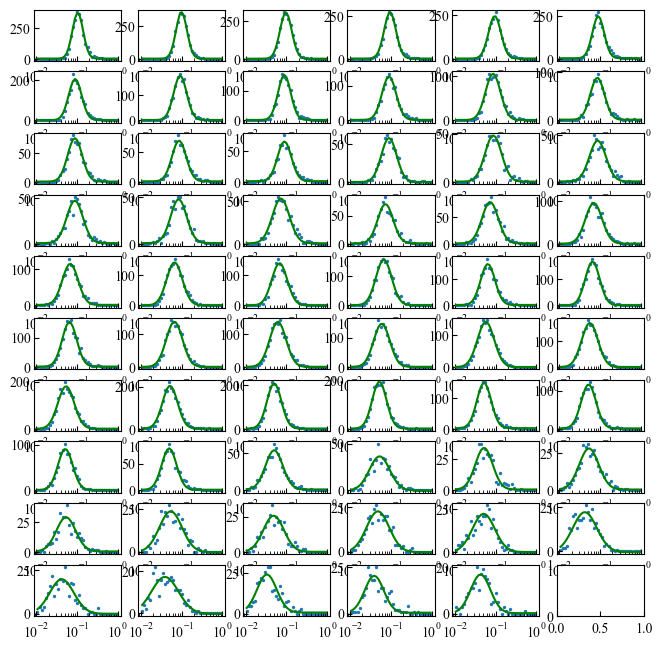

In [275]:
nr = 10
nc = 6

fig, ax = plt.subplots(nrows=nr, ncols=nc, figsize=utils.cm2inch(20, 20))

# ax.set_yscale('log')

popts_8000 = []
popts_norm_8000 = []
perrs_8000 = []

noise_2d_gauss_8000 = []
noise_2d_gauss_norm_8000 = []

for i in range(noise_hist_2d_8000.shape[1]):
    ax[i//nc, i%nc].set_xscale('log')
    ymiddle_log = np.log10(ymiddle)
    max_val = max(noise_hist_2d_8000[:, i])
    max_val_at = ymiddle_log[noise_hist_2d_8000[:, i] == max_val][0]
    # print(max_val_at)
    
    ax[i//nc, i%nc].scatter(ymiddle, noise_hist_2d_8000[:, i], s=2)

    popt, pcov = scipy.optimize.curve_fit(igor_gaussian_fun, ymiddle_log, noise_hist_2d_8000[:, i],
                                          p0=(1e-10, 1, max_val_at, 1))
    perr = np.sqrt(np.diag(pcov))
    
    popts_8000.append(popt)
    popts_norm_8000.append(np.append(np.array([0, 1]), popt[2:]))
    perrs_8000.append(perr)

    ax[i//nc, i%nc].plot(ymiddle, igor_gaussian_fun(ymiddle_log, *popts_8000[-1]), c='g')

    noise_2d_gauss_8000.append(igor_gaussian_fun(ymiddle_log, *popts_8000[-1]))
    noise_2d_gauss_norm_8000.append(igor_gaussian_fun(ymiddle_log, *popts_norm_8000[-1]))
    
    # y_resolution = np.linspace(np.log10(ymiddle[0]), np.log10(ymiddle[-1]), num=100)
    # ax.plot(10**y_resolution, igor_gaussian_fun(y_resolution, *popts[-1]))

In [276]:
popts_8000 = np.array(popts_8000)
perrs_8000 = np.array(perrs_8000)
popts_norm = np.array(popts_norm_8000)

noise_2d_gauss_8000 = np.array(noise_2d_gauss_8000).T
noise_2d_gauss_norm_8000 = np.array(noise_2d_gauss_norm_8000).T
gauss_fit_mean_8000 = 10**popts_8000[:, 2]

In [277]:
colormaps['viridis'](np.linspace(0.0, 1.0, 31)).shape

(31, 4)

In [278]:
np.vstack((np.array([1., 1., 1., 0.]).reshape(1, -1), colormaps['viridis'](np.linspace(0.0, 1.0, 31))))

array([[1.      , 1.      , 1.      , 0.      ],
       [0.267004, 0.004874, 0.329415, 1.      ],
       [0.277018, 0.050344, 0.375715, 1.      ],
       [0.282656, 0.100196, 0.42216 , 1.      ],
       [0.282623, 0.140926, 0.457517, 1.      ],
       [0.277134, 0.185228, 0.489898, 1.      ],
       [0.267968, 0.223549, 0.512008, 1.      ],
       [0.253935, 0.265254, 0.529983, 1.      ],
       [0.239346, 0.300855, 0.540844, 1.      ],
       [0.221989, 0.339161, 0.548752, 1.      ],
       [0.206756, 0.371758, 0.553117, 1.      ],
       [0.190631, 0.407061, 0.556089, 1.      ],
       [0.177423, 0.437527, 0.557565, 1.      ],
       [0.163625, 0.471133, 0.558148, 1.      ],
       [0.151918, 0.500685, 0.557587, 1.      ],
       [0.139147, 0.533812, 0.555298, 1.      ],
       [0.127568, 0.566949, 0.550556, 1.      ],
       [0.120565, 0.596422, 0.543611, 1.      ],
       [0.12138 , 0.629492, 0.531973, 1.      ],
       [0.134692, 0.658636, 0.517649, 1.      ],
       [0.166383, 0.

214.0
0.9987585308077473


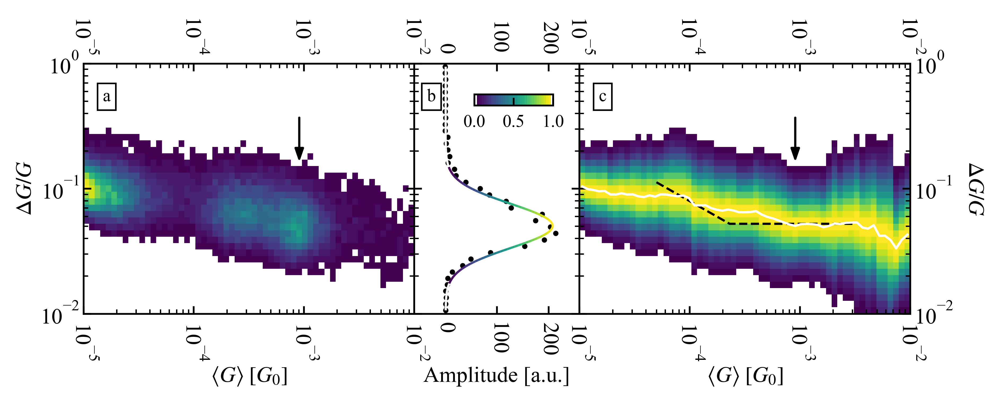

In [279]:
figsize=utils.cm2inch(16.5, 5)
dpi=600
# smoothing=5
# cmap='Blues'

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(1, 3, figure=fig,
                  left=0.1, right=0.9, top=0.9, bottom=0.1, width_ratios=(2, 1, 2),
                  hspace=0.05, wspace=0)

# gs_example = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(3, 2),
#                                               subplot_spec=gs[0],
#                                               wspace=0.05, hspace=0)

# gs_wins = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(1, 1),
#                                            subplot_spec=gs[1],
#                                            wspace=0.05, hspace=0)

ax_2d = fig.add_subplot(gs[0])
ax_gauss = fig.add_subplot(gs[1], sharey=ax_2d)
ax_2d_norm = fig.add_subplot(gs[2], sharey=ax_2d)
# ax_gauss_norm = fig.add_subplot(gs[1, 1])

ax_2d.set_xscale('log')
ax_2d.set_yscale('log')

ax_2d_norm.set_xscale('log')
ax_2d_norm.set_yscale('log')

ax_gauss.set_yscale('log')

# Select which slice is plotted in ax_gauss

which = 38  # -4

my_cmap = utils.cmap_geo32

my_cmap = ListedColormap(np.vstack((np.array([1., 1., 1., 0.]).reshape(1, -1), colormaps['viridis'](np.linspace(0.0, 1.0, 31)))))
my_cmap_opaque = ListedColormap(np.vstack((np.array([1., 1., 1., 1.]).reshape(1, -1), colormaps['viridis'](np.linspace(0.0, 1.0, 31)))))

from copy import copy

# my_cmap = copy(plt.get_cmap('bwr_r'))
# my_cmap = copy(plt.get_cmap('viridis'))
# my_cmap.set_under('white', 1.0)

ax_gauss.scatter(noise_hist_2d_8000[:, which], ymiddle, s=2, c='k')
# ax_gauss.scatter(noise_2d_gauss_norm[:, which], ymiddle, s=2, c='k')
# plot fit with colorscale line
# print(ymiddle_log.min(), ymiddle_log.max())
# print(ymiddle.min(), ymiddle.max())

perc = 50

ymiddle_log_res = np.linspace(ymiddle_log.min(), ymiddle_log.max(), num=200)

norm1 = plt.Normalize(np.percentile(noise_2d_gauss_norm_8000, perc),
                      igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]).max())

# norm1 = plt.Normalize(np.percentile(noise_2d_gauss_norm_8000, perc), 1)

points2 = np.array([igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]), 10**ymiddle_log_res]).T.reshape(-1, 1, 2)
segments2 = np.concatenate([points2[:-1], points2[1:]], axis=1)

norm2 = plt.Normalize(igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).min(),
                      igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())
# norm2 = plt.Normalize(np.percentile(noise_hist_2d_8000, perc),
#                       igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())
lc2 = LineCollection(segments2, cmap=my_cmap_opaque, norm=norm2)
lc2.set_array(igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]))
lc2.set_linewidth(1)
line2 = ax_gauss.add_collection(lc2)

# normalized

# points2 = np.array([igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]), 10**ymiddle_log_res]).T.reshape(-1, 1, 2)
# segments2 = np.concatenate([points2[:-1], points2[1:]], axis=1)
# norm2 = plt.Normalize(igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]).min(),
#                       igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]).max())
# lc2 = LineCollection(segments2, cmap=cmap_geo32_opaque, norm=norm2)
# lc2.set_array(igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]))
# lc2.set_linewidth(1)
# line2 = ax_gauss.add_collection(lc2)

# ax_gauss.plot(igor_gaussian_fun(ymiddle_log, *popts[which]), ymiddle, lw=1, c='k')

# Plot 2D histograms

im = ax_2d.pcolormesh(x_mesh, y_mesh, noise_hist_2d_8000, cmap=my_cmap)
im_norm = ax_2d_norm.pcolormesh(x_mesh, y_mesh, noise_2d_gauss_norm_8000, cmap=my_cmap)

# im = ax_2d.pcolormesh(x_mesh, y_mesh, noise_hist_2d_8000,
#                       norm=norm2, cmap=my_cmap)
# im_norm = ax_2d_norm.pcolormesh(x_mesh, y_mesh, noise_2d_gauss_norm_8000,
#                                 norm=norm1, cmap=my_cmap)

ax_2d_norm.plot(xmiddle, gauss_fit_mean_8000, c='white', alpha=1, lw=1)
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]-1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]+1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')

# ax_2d_norm.fill_between(xmiddle, 10**(popts[:, 2]-0.5*abs(popts[:, 3])), 10**(popts[:, 2]+0.5*abs(popts[:, 3])), color='white', alpha=0.4, lw=1, ec='None')


# Tick settings
ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=True, labelbottom=True)
ax_2d_norm.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=True, labelbottom=True)
ax_gauss.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                     labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_2d.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))
ax_2d_norm.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d_norm.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))


# Add annotation

# ax_2d.axvline(xedges[which], ls='--', lw=1, c='k')
# ax_2d.axvline(xedges[which+1], ls='--', lw=1, c='k')
# ax_2d.axvline(xmiddle[which], ls='--', lw=1)
# ax_2d_norm.axvline(xmiddle[which], ls='--', lw=1)

# ax_gauss.axhline(10**popts_norm[which, 2], lw=0.5, ls='--', c='k')

# ax_2d_norm.annotate("",
#                xy=(xmiddle[which], 10**popts_norm[which, 2]), xycoords=ax_2d_norm.transData,
#                xytext=(1e-5, 10**popts_norm[which, 2]), textcoords=ax_2d_norm.transData,
#                arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.08", color='white'))

ax_2d.annotate("",
               xy=(xmiddle[which], 1.5e-1), xycoords=ax_2d.transData,
               xytext=(xmiddle[which], 4e-1), textcoords=ax_2d.transData,
               arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_2d_norm.annotate("",
                    xy=(xmiddle[which], 1.5e-1), xycoords=ax_2d_norm.transData,
                    xytext=(xmiddle[which], 4e-1), textcoords=ax_2d_norm.transData,
                    arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_gauss.set_xlabel('Amplitude [a.u.]', labelpad=5)
ax_2d.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d.set_ylabel(r'$\frac{\Delta G}{G}$')
ax_2d.set_ylabel(r'$\Delta G / G$')
ax_2d_norm.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d_norm.set_ylabel(r'$\frac{\Delta G}{G}$', rotation=270, labelpad=15)
ax_2d_norm.set_ylabel(r'$\Delta G / G$', rotation=270, labelpad=14)
ax_2d_norm.yaxis.set_label_position('right')

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
label_x = {ax_2d: 1.5e-5, ax_gauss: -35, ax_2d_norm: 1.5e-5}
for ax, i in zip((ax_2d, ax_gauss, ax_2d_norm), ('a', 'b', 'c')):
    ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
    ax.text(s=i, x=label_x[ax], y=5e-1, fontsize=8, bbox=bbox_props)
    plt.setp(ax.get_xticklabels(), rotation=270)
    
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

cbbox = inset_axes(ax_gauss, '70%', '22%', loc = 'upper left', bbox_to_anchor=(0.28,0,0.8,1), bbox_transform=ax_gauss.transAxes)
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

cbaxes = inset_axes(cbbox, '85%', '20%', loc = 'upper right')

cb=fig.colorbar(lc2, cax=cbaxes, orientation='horizontal') #make colorbar
cbaxes.set_xticks(np.linspace(start=0.0, stop=noise_hist_2d_8000[:, which].max(), num=3))
cbaxes.set_xticklabels(np.linspace(start=0, stop=1, num=3), fontsize=8)
cbaxes.set_xlim(0.0, noise_hist_2d_8000[:, which].max())
cbaxes.margins(x=0)

print(noise_hist_2d_8000[:, which].max())
print(noise_2d_gauss_norm_8000[:, which].max())

ax_gauss.set_xlim(-60, 260)
ax_gauss.set_xticks((0, 100, 200))

noise_x, noise_expectation = calc_expected_noise(conductance_range=(5e-5, 3e-3), break_point=2e-4, logy_shift=-3.1, num_points=50)

ax_2d_norm.plot(noise_x, noise_expectation, c='k', lw=1, ls='--')
ax_2d_norm.plot(xmiddle, gauss_fit_mean_8000, c='white', alpha=1, lw=1)
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]-1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]+1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')

# ax_2d_norm.fill_between(xmiddle, 10**(popts[:, 2]-0.5*abs(popts[:, 3])), 10**(popts[:, 2]+0.5*abs(popts[:, 3])), color='white', alpha=0.4, lw=1, ec='None')


# ax_2d.axvline(x_mesh[0, which], c='white', lw=0.3)
# ax_2d.axvline(x_mesh[0, which+1], c='white', lw=0.3)

# ax_2d_norm.axvline(x_mesh[0, which], c='white', lw=0.3)
# ax_2d_norm.axvline(x_mesh[0, which+1], c='white', lw=0.3)

# ax_2d_norm.axvline(2e-4, ls='--', lw=0.7, c='k')

# ax_gauss.axvline(max(igor_gaussian_fun(ymiddle_log_res, *popts[which]))/2, ls='--', c='k', lw=1)

# plt.savefig(home_folder.joinpath(f'results/noise/bpy_8000_relative_noise_gauss.png'), bbox_inches='tight')

In [250]:
print(np.linspace(start=0.0, stop=noise_hist_2d_8000[:, which].max(), num=3))
print(noise_hist_2d_8000[:, which].max())
print(x_mesh[0, which])
print(which)

[  0. 107. 214.]
214.0
0.0008554672535565685
38


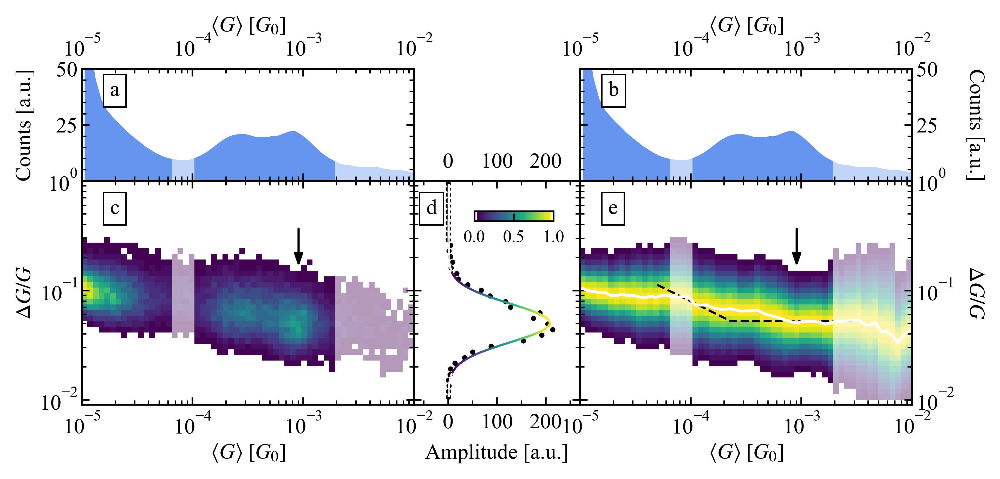

In [304]:
figsize=utils.cm2inch(16, 7.5)
dpi=600
# smoothing=5
# cmap='Blues'

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 3, figure=fig,
                  left=0.075, right=0.92, top=0.87, bottom=0.14, width_ratios=(2, 1, 2), height_ratios=(1, 2),
                  hspace=0, wspace=0)

# gs_example = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(3, 2),
#                                               subplot_spec=gs[0],
#                                               wspace=0.05, hspace=0)

# gs_wins = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(1, 1),
#                                            subplot_spec=gs[1],
#                                            wspace=0.05, hspace=0)

ax_1d_1 = fig.add_subplot(gs[0, 0], sharex=ax_2d)
ax_1d_2 = fig.add_subplot(gs[0, 2], sharex=ax_2d_norm, sharey=ax_1d_1)

ax_2d = fig.add_subplot(gs[1, 0])
ax_gauss = fig.add_subplot(gs[1, 1], sharey=ax_2d)
ax_2d_norm = fig.add_subplot(gs[1, 2], sharey=ax_2d)
# ax_gauss_norm = fig.add_subplot(gs[1, 1])

ax_2d.set_xscale('log')
ax_2d.set_yscale('log')

ax_2d_norm.set_xscale('log')
ax_2d_norm.set_yscale('log')

ax_gauss.set_yscale('log')

# plot 1D histograms

ax_1d_1.fill_between(hist_bpy_8000.hist_1d_bins, np.zeros_like(hist_bpy_8000.hist_1d_pull), hist_bpy_8000.hist_1d_pull, color='cornflowerblue', ec='None')
ax_1d_2.fill_between(hist_bpy_8000.hist_1d_bins, np.zeros_like(hist_bpy_8000.hist_1d_pull), hist_bpy_8000.hist_1d_pull, color='cornflowerblue', ec='None')

ax_1d_1.set_xlim(1e-5, 1e-2)
ax_1d_2.set_xlim(1e-5, 1e-2)
ax_1d_1.set_ylim(0, 50)
ax_1d_2.set_ylim(0, 50)

ax_2d.set_ylim(9e-3, 1)
ax_2d_norm.set_ylim(9e-3, 1)

# Plot Gaussian
# Select which slice is plotted in ax_gauss

which = 38  # -4

ax_gauss.scatter(noise_hist_2d_8000[:, which], ymiddle, s=2, c='k')
# ax_gauss.scatter(noise_2d_gauss_norm[:, which], ymiddle, s=2, c='k')
# plot fit with colorscale line
# print(ymiddle_log.min(), ymiddle_log.max())
# print(ymiddle.min(), ymiddle.max())

ymiddle_log_res = np.linspace(ymiddle_log.min(), ymiddle_log.max(), num=200)

points2 = np.array([igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]), 10**ymiddle_log_res]).T.reshape(-1, 1, 2)
segments2 = np.concatenate([points2[:-1], points2[1:]], axis=1)
norm2 = plt.Normalize(igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).min(),
                      igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]).max())
lc2 = LineCollection(segments2, cmap=my_cmap_opaque, norm=norm2)
lc2.set_array(igor_gaussian_fun(ymiddle_log_res, *popts_8000[which]))
lc2.set_linewidth(1)
line2 = ax_gauss.add_collection(lc2)

# normalized

# points2 = np.array([igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]), 10**ymiddle_log_res]).T.reshape(-1, 1, 2)
# segments2 = np.concatenate([points2[:-1], points2[1:]], axis=1)
# norm2 = plt.Normalize(igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]).min(),
#                       igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]).max())
# lc2 = LineCollection(segments2, cmap=cmap_geo32_opaque, norm=norm2)
# lc2.set_array(igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]))
# lc2.set_linewidth(1)
# line2 = ax_gauss.add_collection(lc2)

# ax_gauss.plot(igor_gaussian_fun(ymiddle_log, *popts[which]), ymiddle, lw=1, c='k')

# Plot 2D histograms

im = ax_2d.pcolormesh(x_mesh, y_mesh, noise_hist_2d_8000, cmap=my_cmap)
im_norm = ax_2d_norm.pcolormesh(x_mesh, y_mesh, noise_2d_gauss_norm_8000, cmap=my_cmap)

noise_x, noise_expectation = calc_expected_noise(conductance_range=(5e-5, 3e-3), break_point=2e-4, logy_shift=-3.1, num_points=50)
ax_2d_norm.plot(noise_x, noise_expectation, c='k', lw=1, ls='--')

ax_2d_norm.plot(xmiddle, gauss_fit_mean_8000, c='white', alpha=1, lw=1.3)
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]-1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]+1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.fill_between(xmiddle, 10**(popts[:, 2]-0.5*abs(popts[:, 3])), 10**(popts[:, 2]+0.5*abs(popts[:, 3])), color='white', alpha=0.4, lw=1, ec='None')

# noise_x_2, noise_expectation_2 = calc_expected_noise(conductance_range=(8e-5, 3e-3), break_point=3e-4, logy_shift=-3.03, num_points=50)
# ax_2d_norm.plot(noise_x_2, noise_expectation_2, c='r', lw=1, ls='--')


# Tick settings
ax_1d_1.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax_1d_2.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax_2d_norm.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=True)
ax_gauss.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                     labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_2d.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))
ax_2d_norm.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d_norm.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))


# Add annotation

# ax_2d.axvline(xedges[which], ls='--', lw=1, c='k')
# ax_2d.axvline(xedges[which+1], ls='--', lw=1, c='k')
# ax_2d.axvline(xmiddle[which], ls='--', lw=1)
# ax_2d_norm.axvline(xmiddle[which], ls='--', lw=1)

# ax_gauss.axhline(10**popts_norm[which, 2], lw=0.5, ls='--', c='k')

# arrow to show where the middle of the example gaussian is on the normalized 2D histogram
# ax_2d_norm.annotate("",
#                xy=(xmiddle[which], 10**popts_norm[which, 2]), xycoords=ax_2d_norm.transData,
#                xytext=(1e-5, 10**popts_norm[which, 2]), textcoords=ax_2d_norm.transData,
#                arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.08", color='white'))

ax_2d.annotate("",
               xy=(xmiddle[which], 1.5e-1), xycoords=ax_2d.transData,
               xytext=(xmiddle[which], 4e-1), textcoords=ax_2d.transData,
               arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_2d_norm.annotate("",
                    xy=(xmiddle[which], 1.5e-1), xycoords=ax_2d_norm.transData,
                    xytext=(xmiddle[which], 4e-1), textcoords=ax_2d_norm.transData,
                    arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_1d_1.xaxis.set_label_position('top')
ax_1d_2.xaxis.set_label_position('top')
ax_1d_2.yaxis.set_label_position('right')
ax_1d_1.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_2.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_1.set_yticks([25, 50])
ax_1d_2.set_yticks([25, 50])

ax_1d_1.set_ylabel('Counts [a.u.]')
ax_1d_2.set_ylabel('Counts [a.u.]', rotation=270, labelpad=14)
ax_gauss.set_xlabel('Amplitude [a.u.]', labelpad=5)
ax_2d.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d.set_ylabel(r'$\frac{\Delta G}{G}$')
ax_2d.set_ylabel(r'$\Delta G / G$')
ax_2d_norm.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d_norm.set_ylabel(r'$\frac{\Delta G}{G}$', rotation=270, labelpad=15)
ax_2d_norm.set_ylabel(r'$\Delta G / G$', rotation=270, labelpad=14)
ax_2d_norm.yaxis.set_label_position('right')


bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
label_x = {ax_1d_1: 1.8e-5, ax_1d_2: 1.8e-5, ax_2d: 1.8e-5, ax_gauss: -45, ax_2d_norm: 1.8e-5}
label_y = {ax_1d_1: 38, ax_1d_2: 38, ax_2d: 5e-1, ax_gauss: 5e-1, ax_2d_norm: 5e-1} # 
for ax, i in zip((ax_1d_1, ax_1d_2, ax_2d, ax_gauss, ax_2d_norm), ('a', 'b', 'c', 'd', 'e')):
    ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
    ax.text(s=i, x=label_x[ax], y=label_y[ax], fontsize=10, bbox=bbox_props)
    # plt.setp(ax.get_xticklabels(), rotation=270)
    
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

cbbox = inset_axes(ax_gauss, '70%', '22%', loc = 'upper left', bbox_to_anchor=(0.28,0,0.8,1), bbox_transform=ax_gauss.transAxes)
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

cbaxes = inset_axes(cbbox, '85%', '20%', loc = 'upper right')

cb=fig.colorbar(lc2, cax=cbaxes, orientation='horizontal') #make colorbar
cbaxes.set_xticks(np.linspace(start=0, stop=noise_hist_2d_8000[:, which].max(), num=3))
cbaxes.set_xticklabels(np.linspace(start=0, stop=1, num=3), fontsize=8)

ax_gauss.set_xlim(-70, 270)
ax_gauss.set_xticks((0, 100, 200))

# where we have less points in a vertical bin than half of the average, draw a box over
avg = np.mean(np.sum(noise_hist_2d_8000, axis=0))
np.where(np.sum(noise_hist_2d_8000, axis=0)<avg/2)[0]+1

for i, j in zip(np.where(np.sum(noise_hist_2d_8000, axis=0)<hmm/2)[0], np.where(np.sum(noise_hist_2d_8000, axis=0)<hmm/2)[0]+1):
    ax_1d_1.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_1d_2.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d_norm.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)

ax_1d_1.yaxis.set_minor_locator(MultipleLocator(5))
ax_gauss.xaxis.set_minor_locator(MultipleLocator(50))
# ax_1d_1.axhline(10, ls='--', lw=1)

# ax_1d_2.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_1d_2.axvline(2e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm.axvline(2e-4, ls='--', lw=0.7, c='k')

# ax_gauss.axvline(max(igor_gaussian_fun(ymiddle_log_res, *popts[which]))/2, ls='--', c='k', lw=1)

fig.align_ylabels([ax_1d_1, ax_2d])
fig.align_ylabels([ax_1d_2, ax_2d_norm])

plt.savefig(home_folder.joinpath(f'results/noise/bpy_8000_relative_noise_gauss_w_1d_hist_w_box.png'))

In [262]:
# Select PC
pc3_gr1 = pc.traces_group1['PC3']
pc3_gr2 = pc.traces_group2['PC3']

areas_pc3_gr1 = []
cond_avg_pc3_gr1 = []

areas_pc3_gr2 = []
cond_avg_pc3_gr2 = []

# Collect data for group1-2 of the PC

with h5py.File(home_folder.joinpath('results/noise/noise_data_start-end_all_8000.h5'), 'r') as f:
    traces = list(f.keys())
    for trace in tqdm(pc3_gr1):
        areas_1 = f[f'trace_{trace}/areas'][:]
        avg_conductance_in_win_1 = f[f'trace_{trace}/avg_conductance_in_win'][:]

        areas_pc3_gr1.append(areas_1)
        cond_avg_pc3_gr1.append(avg_conductance_in_win_1)
        
    for trace in tqdm(pc3_gr2):
        areas_2 = f[f'trace_{trace}/areas'][:]
        avg_conductance_in_win_2 = f[f'trace_{trace}/avg_conductance_in_win'][:]

        areas_pc3_gr1.append(areas_2)
        cond_avg_pc3_gr1.append(avg_conductance_in_win_2)
        
areas_pc3_gr1 = np.array(areas_pc3_gr1)
areas_pc3_gr2 = np.array(areas_pc3_gr2)
cond_avg_pc3_gr1 = np.array(cond_avg_pc3_gr1)
cond_avg_pc3_gr2 = np.array(cond_avg_pc3_gr2)

valid_areas_pc3_gr1 = areas_pc3_gr1.flatten()[areas_pc3_gr1.flatten()>0]
valid_areas_pc3_gr2 = areas_pc3_gr2.flatten()[areas_pc3_gr2.flatten()>0]
valid_cond_avg_pc3_gr1 = cond_avg_pc3_gr1.flatten()[cond_avg_pc3_gr1.flatten()>0]
valid_cond_avg_pc3_gr2 = cond_avg_pc3_gr2.flatten()[cond_avg_pc3_gr2.flatten()>0]

# Calculate 2D realtive conductance noise histograms for both groups

xrange = (1e-5, 1e-2)
yrange = (1e-2, 1)

num_bins = 20

num_of_decs_x = np.log10(xrange[1]) - np.log10(xrange[0])
num_of_decs_y = np.log10(yrange[1]) - np.log10(yrange[0])

xbins = np.logspace(np.log10(xrange[0]), np.log10(xrange[1]), num=int(num_bins * num_of_decs_x))
ybins = np.logspace(np.log10(yrange[0]), np.log10(yrange[1]), num=int(num_bins * num_of_decs_y))

h1, xedges, yedges = np.histogram2d(valid_cond_avg_pc3_gr1, np.sqrt(valid_areas_pc3_gr1)/valid_cond_avg_pc3_gr1, bins=[xbins, ybins])
x_mesh, y_mesh = np.meshgrid(xedges, yedges)

h2, xedges, yedges = np.histogram2d(valid_cond_avg_pc3_gr2, np.sqrt(valid_areas_pc3_gr2)/valid_cond_avg_pc3_gr2, bins=[xbins, ybins])
x_mesh, y_mesh = np.meshgrid(xedges, yedges)

noise_hist_2d_pc3_gr1 = h1.T
noise_hist_2d_pc3_gr2 = h2.T

ymiddle = yedges[:-1] + np.diff(yedges)/2
xmiddle = xedges[:-1] + np.diff(xedges)/2

# Fit gaussian to each conductance bin of the 2D histogram (each slice)

popts_pc3_gr1 = []
perrs_pc3_gr1 = []
popts_norm_pc3_gr1 = []

popts_pc3_gr2 = []
perrs_pc3_gr2 = []
popts_norm_pc3_gr2 = []

noise_2d_gauss_pc3_gr1 = []
noise_2d_gauss_pc3_gr2 = []

noise_2d_gauss_norm_pc3_gr1 = []
noise_2d_gauss_norm_pc3_gr2 = []

for i in tqdm(range(noise_hist_2d_pc3_gr1.shape[1])):
    
    ymiddle_log = np.log10(ymiddle)
    max_val = max(noise_hist_2d_pc3_gr1[:, i])
    max_val_at = ymiddle_log[noise_hist_2d_pc3_gr1[:, i] == max_val][0]
    
    popt, pcov = scipy.optimize.curve_fit(igor_gaussian_fun, np.log10(ymiddle), noise_hist_2d_pc3_gr1[:, i],
                                          p0=(0, 1, max_val_at, 1))
    perr = np.sqrt(np.diag(pcov))
    
    popts_pc3_gr1.append(popt)
    perrs_pc3_gr1.append(perr)
    popts_norm_pc3_gr1.append(np.append(np.array([0, 1]), popt[2:]))
    
    noise_2d_gauss_pc3_gr1.append(igor_gaussian_fun(np.log10(ymiddle), *popts_pc3_gr1[-1]))
    noise_2d_gauss_norm_pc3_gr1.append(igor_gaussian_fun(np.log10(ymiddle), *popts_norm_pc3_gr1[-1]))
    
for i in tqdm(range(noise_hist_2d_pc3_gr2.shape[1])):
    
    ymiddle_log = np.log10(ymiddle)
    max_val = max(noise_hist_2d_pc3_gr2[:, i])
    max_val_at = ymiddle_log[noise_hist_2d_pc3_gr2[:, i] == max_val][0]
    
    popt, pcov = scipy.optimize.curve_fit(igor_gaussian_fun, ymiddle_log, noise_hist_2d_pc3_gr2[:, i],
                                          p0=(0, 1, max_val_at, 1))
    perr = np.sqrt(np.diag(pcov))
    
    popts_pc3_gr2.append(popt)
    perrs_pc3_gr2.append(perr)
    popts_norm_pc3_gr2.append(np.append(np.array([0, 1]), popt[2:]))
    
    noise_2d_gauss_pc3_gr2.append(igor_gaussian_fun(ymiddle_log, *popts_pc3_gr2[-1]))
    noise_2d_gauss_norm_pc3_gr2.append(igor_gaussian_fun(ymiddle_log, *popts_norm_pc3_gr2[-1]))
    
popts_pc3_gr1 = np.array(popts_pc3_gr1)
perrs_pc3_gr1 = np.array(perrs_pc3_gr1)
noise_2d_gauss_pc3_gr1 = np.array(noise_2d_gauss_pc3_gr1).T
noise_2d_gauss_norm_pc3_gr1 = np.array(noise_2d_gauss_norm_pc3_gr1).T

popts_pc3_gr2 = np.array(popts_pc3_gr2)
perrs_pc3_gr2 = np.array(perrs_pc3_gr2)
noise_2d_gauss_pc3_gr2 = np.array(noise_2d_gauss_pc3_gr2).T
noise_2d_gauss_norm_pc3_gr2 = np.array(noise_2d_gauss_norm_pc3_gr2).T

# noise_2d_gauss_norm_sum = (noise_2d_gauss_gr1+noise_2d_gauss_gr2) / np.max(noise_2d_gauss_gr1+noise_2d_gauss_gr2, axis=0)

gauss_fit_mean_pc3_gr1 = 10**popts_pc3_gr1[:, 2]
gauss_fit_mean_pc3_gr2 = 10**popts_pc3_gr2[:, 2]

  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

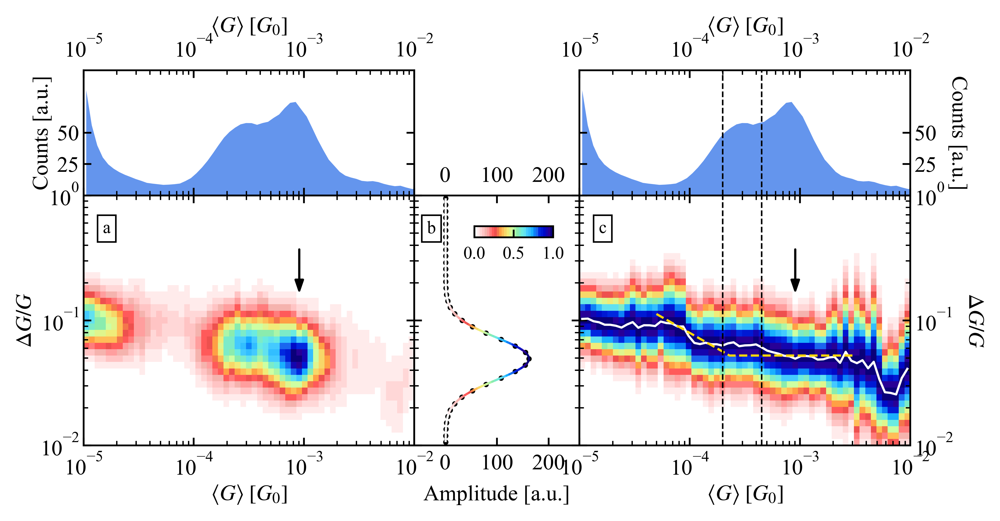

In [263]:
hist_1d = pc.hist_group1['PC3']

hist_2d = noise_2d_gauss_pc3_gr1
hist_2d_norm = noise_2d_gauss_norm_pc3_gr1

popts = popts_pc3_gr1
gauss_fit_mean = gauss_fit_mean_pc3_gr1

figsize=utils.cm2inch(16.5, 7.5)
dpi=600
# smoothing=5
# cmap='Blues'

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 3, figure=fig,
                  left=0.1, right=0.9, top=0.9, bottom=0.1, width_ratios=(2, 1, 2), height_ratios=(1, 2),
                  hspace=0, wspace=0)

# gs_example = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(3, 2),
#                                               subplot_spec=gs[0],
#                                               wspace=0.05, hspace=0)

# gs_wins = gridspec.GridSpecFromSubplotSpec(nrows=1, ncols=2, width_ratios=(1, 1),
#                                            subplot_spec=gs[1],
#                                            wspace=0.05, hspace=0)

ax_1d_1 = fig.add_subplot(gs[0, 0], sharex=ax_2d)
ax_1d_2 = fig.add_subplot(gs[0, 2], sharex=ax_2d_norm, sharey=ax_1d_1)

ax_2d = fig.add_subplot(gs[1, 0])
ax_gauss = fig.add_subplot(gs[1, 1], sharey=ax_2d)
ax_2d_norm = fig.add_subplot(gs[1, 2], sharey=ax_2d)
# ax_gauss_norm = fig.add_subplot(gs[1, 1])

ax_2d.set_xscale('log')
ax_2d.set_yscale('log')

ax_2d_norm.set_xscale('log')
ax_2d_norm.set_yscale('log')

ax_gauss.set_yscale('log')

# plot 1D histograms

ax_1d_1.fill_between(hist_1d.hist_1d_bins, np.zeros_like(hist_1d.hist_1d_pull), hist_1d.hist_1d_pull, color='cornflowerblue', ec='None')
ax_1d_2.fill_between(hist_1d.hist_1d_bins, np.zeros_like(hist_1d.hist_1d_pull), hist_1d.hist_1d_pull, color='cornflowerblue', ec='None')

ax_1d_1.set_xlim(1e-5, 1e-2)
ax_1d_2.set_xlim(1e-5, 1e-2)
ax_1d_1.set_ylim(0, 100)
ax_1d_2.set_ylim(0, 100)

ax_2d.set_ylim(1e-2, 1)
ax_2d_norm.set_ylim(1e-2, 1)
ax_gauss.set_ylim(1e-2, 1)

# Plot Gaussian
# Select which slice is plotted in ax_gauss

which = 38  # -4

ax_gauss.scatter(hist_2d[:, which], ymiddle, s=2, c='k')
# ax_gauss.scatter(noise_2d_gauss_norm[:, which], ymiddle, s=2, c='k')
# plot fit with colorscale line
# print(ymiddle_log.min(), ymiddle_log.max())
# print(ymiddle.min(), ymiddle.max())

ymiddle_log_res = np.linspace(ymiddle_log.min(), ymiddle_log.max(), num=200)

points2 = np.array([igor_gaussian_fun(ymiddle_log_res, *popts[which]), 10**ymiddle_log_res]).T.reshape(-1, 1, 2)
segments2 = np.concatenate([points2[:-1], points2[1:]], axis=1)
norm2 = plt.Normalize(igor_gaussian_fun(ymiddle_log_res, *popts[which]).min(),
                      igor_gaussian_fun(ymiddle_log_res, *popts[which]).max())
lc2 = LineCollection(segments2, cmap=cmap_geo32_opaque, norm=norm2)
lc2.set_array(igor_gaussian_fun(ymiddle_log_res, *popts[which]))
lc2.set_linewidth(1)
line2 = ax_gauss.add_collection(lc2)

# Plot 2D histograms

im_pc3_gr1 = ax_2d.pcolormesh(x_mesh, y_mesh, hist_2d, cmap=utils.cmap_geo32)
im_norm_pc3_gr1 = ax_2d_norm.pcolormesh(x_mesh, y_mesh, hist_2d_norm, cmap=utils.cmap_geo32)
ax_2d_norm.plot(xmiddle, gauss_fit_mean, c='white', alpha=1, lw=1)
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]-1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]+1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.fill_between(xmiddle, 10**(popts[:, 2]-0.5*abs(popts[:, 3])), 10**(popts[:, 2]+0.5*abs(popts[:, 3])), color='white', alpha=0.4, lw=1, ec='None')

noise_x, noise_expectation = calc_expected_noise(conductance_range=(5e-5, 3e-3), break_point=2e-4, logy_shift=-3.1, num_points=50)
ax_2d_norm.plot(noise_x, noise_expectation, c='gold', lw=1, ls='--')

# noise_x_2, noise_expectation_2 = calc_expected_noise(conductance_range=(8e-5, 3e-3), break_point=4.5e-4, logy_shift=-2.95, num_points=50)
# ax_2d_norm.plot(noise_x_2, noise_expectation_2, c='r', lw=1, ls='--')


# Tick settings
ax_1d_1.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax_1d_2.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax_2d_norm.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=True)
ax_gauss.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                     labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_2d.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))
ax_2d_norm.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d_norm.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))


# Add annotation

ax_2d.annotate("",
               xy=(xmiddle[which], 1.5e-1), xycoords=ax_2d.transData,
               xytext=(xmiddle[which], 4e-1), textcoords=ax_2d.transData,
               arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_2d_norm.annotate("",
                    xy=(xmiddle[which], 1.5e-1), xycoords=ax_2d_norm.transData,
                    xytext=(xmiddle[which], 4e-1), textcoords=ax_2d_norm.transData,
                    arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_1d_1.xaxis.set_label_position('top')
ax_1d_2.xaxis.set_label_position('top')
ax_1d_2.yaxis.set_label_position('right')
ax_1d_1.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_2.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_1.set_yticks([25, 50])
ax_1d_2.set_yticks([25, 50])

ax_1d_1.set_ylabel('Counts [a.u.]')
ax_1d_2.set_ylabel('Counts [a.u.]', rotation=270, labelpad=14)
ax_gauss.set_xlabel('Amplitude [a.u.]', labelpad=5)
ax_2d.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d.set_ylabel(r'$\frac{\Delta G}{G}$')
ax_2d.set_ylabel(r'$\Delta G / G$')
ax_2d_norm.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d_norm.set_ylabel(r'$\frac{\Delta G}{G}$', rotation=270, labelpad=15)
ax_2d_norm.set_ylabel(r'$\Delta G / G$', rotation=270, labelpad=14)
ax_2d_norm.yaxis.set_label_position('right')

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
label_x = {ax_2d: 1.5e-5, ax_gauss: -35, ax_2d_norm: 1.5e-5}
for ax, i in zip((ax_2d, ax_gauss, ax_2d_norm), ('a', 'b', 'c')):
    ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
    ax.text(s=i, x=label_x[ax], y=5e-1, fontsize=8, bbox=bbox_props)
    # plt.setp(ax.get_xticklabels(), rotation=270)
    
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

cbbox = inset_axes(ax_gauss, '70%', '22%', loc = 'upper left', bbox_to_anchor=(0.28,0,0.8,1), bbox_transform=ax_gauss.transAxes)
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

cbaxes = inset_axes(cbbox, '85%', '20%', loc = 'upper right')

cb=fig.colorbar(lc2, cax=cbaxes, orientation='horizontal') #make colorbar
cbaxes.set_xticks(np.linspace(start=0, stop=hist_2d[:, which].max(), num=3))
cbaxes.set_xticklabels(np.linspace(start=0, stop=1, num=3), fontsize=8)

ax_gauss.set_xlim(-60, 260)
ax_gauss.set_xticks((0, 100, 200))

ax_1d_2.axvline(4.5e-4, ls='--', lw=0.7, c='k')
ax_2d_norm.axvline(4.5e-4, ls='--', lw=0.7, c='k')
ax_1d_2.axvline(2e-4, ls='--', lw=0.7, c='k')
ax_2d_norm.axvline(2e-4, ls='--', lw=0.7, c='k')

# ax_gauss.axvline(max(igor_gaussian_fun(ymiddle_log_res, *popts[which]))/2, ls='--', c='k', lw=1)

# plt.savefig(home_folder.joinpath(f'results/noise/bpy_8000_relative_noise_gauss_w_1d_hist_pc3_gr1.png'), bbox_inches='tight')

In [419]:
# Select PC
pc4_gr1 = pc.traces_group1['PC4']
pc4_gr2 = pc.traces_group2['PC4']

areas_pc4_gr1 = []
cond_avg_pc4_gr1 = []
psds_pc4_gr1 = []

areas_pc4_gr2 = []
cond_avg_pc4_gr2 = []
psds_pc4_gr2 = []

# Collect data for group1-2 of the PC

with h5py.File(home_folder.joinpath('results/noise/noise_data_start-end_all_8000.h5'), 'r') as f:
    traces = list(f.keys())
    for trace in tqdm(pc4_gr1):
        areas_1 = f[f'trace_{trace}/areas'][:]
        avg_conductance_in_win_1 = f[f'trace_{trace}/avg_conductance_in_win'][:]
        psds_1 = f[f'trace_{trace}/psd_results'][:]

        areas_pc4_gr1.append(areas_1)
        cond_avg_pc4_gr1.append(avg_conductance_in_win_1)
        psds_pc4_gr1.append(psds_1)
        
    for trace in tqdm(pc4_gr2):
        areas_2 = f[f'trace_{trace}/areas'][:]
        avg_conductance_in_win_2 = f[f'trace_{trace}/avg_conductance_in_win'][:]
        psds_2 = f[f'trace_{trace}/psd_results'][:]
        
        areas_pc4_gr2.append(areas_2)
        cond_avg_pc4_gr2.append(avg_conductance_in_win_2)
        psds_pc4_gr2.append(psds_2)
        
    fft_freqs = f[f'trace_{trace}/fft_freqs'][:]
        
areas_pc4_gr1 = np.array(areas_pc4_gr1)
areas_pc4_gr2 = np.array(areas_pc4_gr2)
cond_avg_pc4_gr1 = np.array(cond_avg_pc4_gr1)
cond_avg_pc4_gr2 = np.array(cond_avg_pc4_gr2)
psds_pc4_gr1 = np.array(psds_pc4_gr1)
psds_pc4_gr2 = np.array(psds_pc4_gr2)

valid_areas_pc4_gr1 = areas_pc4_gr1.flatten()[areas_pc4_gr1.flatten()>0]
valid_areas_pc4_gr2 = areas_pc4_gr2.flatten()[areas_pc4_gr2.flatten()>0]
valid_cond_avg_pc4_gr1 = cond_avg_pc4_gr1.flatten()[cond_avg_pc4_gr1.flatten()>0]
valid_cond_avg_pc4_gr2 = cond_avg_pc4_gr2.flatten()[cond_avg_pc4_gr2.flatten()>0]

# Calculate 2D realtive conductance noise histograms for both groups

xrange = (1e-5, 1e-2)
yrange = (1e-2, 1)

num_bins = 20

num_of_decs_x = np.log10(xrange[1]) - np.log10(xrange[0])
num_of_decs_y = np.log10(yrange[1]) - np.log10(yrange[0])

xbins = np.logspace(np.log10(xrange[0]), np.log10(xrange[1]), num=int(num_bins * num_of_decs_x))
ybins = np.logspace(np.log10(yrange[0]), np.log10(yrange[1]), num=int(num_bins * num_of_decs_y))

h1, xedges, yedges = np.histogram2d(valid_cond_avg_pc4_gr1, np.sqrt(valid_areas_pc4_gr1)/valid_cond_avg_pc4_gr1, bins=[xbins, ybins])
x_mesh, y_mesh = np.meshgrid(xedges, yedges)

h2, xedges, yedges = np.histogram2d(valid_cond_avg_pc4_gr2, np.sqrt(valid_areas_pc4_gr2)/valid_cond_avg_pc4_gr2, bins=[xbins, ybins])
x_mesh, y_mesh = np.meshgrid(xedges, yedges)

noise_hist_2d_pc4_gr1 = h1.T
noise_hist_2d_pc4_gr2 = h2.T

ymiddle = yedges[:-1] + np.diff(yedges)/2
xmiddle = xedges[:-1] + np.diff(xedges)/2

# Fit gaussian to each conductance bin of the 2D histogram (each slice)

popts_pc4_gr1 = []
perrs_pc4_gr1 = []
popts_norm_pc4_gr1 = []

popts_pc4_gr2 = []
perrs_pc4_gr2 = []
popts_norm_pc4_gr2 = []

noise_2d_gauss_pc4_gr1 = []
noise_2d_gauss_pc4_gr2 = []

noise_2d_gauss_norm_pc4_gr1 = []
noise_2d_gauss_norm_pc4_gr2 = []

for i in tqdm(range(noise_hist_2d_pc4_gr1.shape[1])):
    
    ymiddle_log = np.log10(ymiddle)
    max_val = max(noise_hist_2d_pc4_gr1[:, i])
    max_val_at = ymiddle_log[noise_hist_2d_pc4_gr1[:, i] == max_val][0]
    
    popt, pcov = scipy.optimize.curve_fit(igor_gaussian_fun, np.log10(ymiddle), noise_hist_2d_pc4_gr1[:, i],
                                          p0=(0, 1, max_val_at, 1))
    perr = np.sqrt(np.diag(pcov))
    
    popts_pc4_gr1.append(popt)
    perrs_pc4_gr1.append(perr)
    popts_norm_pc4_gr1.append(np.append(np.array([0, 1]), popt[2:]))
    
    noise_2d_gauss_pc4_gr1.append(igor_gaussian_fun(np.log10(ymiddle), *popts_pc4_gr1[-1]))
    noise_2d_gauss_norm_pc4_gr1.append(igor_gaussian_fun(np.log10(ymiddle), *popts_norm_pc4_gr1[-1]))
    
for i in tqdm(range(noise_hist_2d_pc4_gr2.shape[1])):
    
    ymiddle_log = np.log10(ymiddle)
    max_val = max(noise_hist_2d_pc4_gr2[:, i])
    max_val_at = ymiddle_log[noise_hist_2d_pc4_gr2[:, i] == max_val][0]
    
    popt, pcov = scipy.optimize.curve_fit(igor_gaussian_fun, ymiddle_log, noise_hist_2d_pc4_gr2[:, i],
                                          p0=(0, 1, max_val_at, 1))
    perr = np.sqrt(np.diag(pcov))
    
    popts_pc4_gr2.append(popt)
    perrs_pc4_gr2.append(perr)
    popts_norm_pc4_gr2.append(np.append(np.array([0, 1]), popt[2:]))
    
    noise_2d_gauss_pc4_gr2.append(igor_gaussian_fun(ymiddle_log, *popts_pc4_gr2[-1]))
    noise_2d_gauss_norm_pc4_gr2.append(igor_gaussian_fun(ymiddle_log, *popts_norm_pc4_gr2[-1]))
    
popts_pc4_gr1 = np.array(popts_pc4_gr1)
perrs_pc4_gr1 = np.array(perrs_pc4_gr1)
noise_2d_gauss_pc4_gr1 = np.array(noise_2d_gauss_pc4_gr1).T
noise_2d_gauss_norm_pc4_gr1 = np.array(noise_2d_gauss_norm_pc4_gr1).T

popts_pc4_gr2 = np.array(popts_pc4_gr2)
perrs_pc4_gr2 = np.array(perrs_pc4_gr2)
noise_2d_gauss_pc4_gr2 = np.array(noise_2d_gauss_pc4_gr2).T
noise_2d_gauss_norm_pc4_gr2 = np.array(noise_2d_gauss_norm_pc4_gr2).T

# noise_2d_gauss_norm_sum = (noise_2d_gauss_gr1+noise_2d_gauss_gr2) / np.max(noise_2d_gauss_gr1+noise_2d_gauss_gr2, axis=0)

gauss_fit_mean_pc4_gr1 = 10**popts_pc4_gr1[:, 2]
gauss_fit_mean_pc4_gr2 = 10**popts_pc4_gr2[:, 2]

  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

  0%|          | 0/59 [00:00<?, ?it/s]

In [ ]:
def fit_func_lin(x, gamma, logbeta):
    # gamma: slope
    # logbeta: log(beta) intercept
    
    return gamma * x + logbeta

def plot_func(x, gamma, logbeta):
    # gamma: slope
    # logbeta: log(beta) intercept
    
    return 10**logbeta * x**gamma

from scipy.optimize import curve_fit

def fit_psd(freq, psd, freq_range=(2000, 5000), **kwargs):
    popt, pcov = curve_fit(fit_func_lin,
                           np.log10(freq[np.bitwise_and(freq > freq_range[0], freq < freq_range[1])]),
                           np.log10(psd[np.bitwise_and(freq > freq_range[0], freq < freq_range[1])]), **kwargs)
    perr = np.sqrt(np.diag(pcov))
    
    return popt, perr

def calc_area_from_fit(fft_freqs: np.ndarray, freq_range: Tuple[float, float], gamma: float, beta: float):
    
    low_freq = fft_freqs[fft_freqs > freq_range[0]][0]
    high_freq = fft_freqs[fft_freqs < freq_range[1]][-1]
    
    return beta/(1+gamma) * (high_freq**(1+gamma) - low_freq**(1+gamma))

In [ ]:
psd_fit_data_1 = []
psd_fit_data_2 = []

# areas_pc4_gr1
# cond_avg_pc4_gr1
# psds_pc4_gr1

for which_trace in tqdm(range(len(cond_avg_pc4_gr1))):
    for i, ind in enumerate(np.where(cond_avg_pc4_gr1[which_trace] > 1e-5)[0]):
        (gamma, logbeta), (dgamma, dlogbeta) = fit_psd(fft_freqs, psds_pc4_gr1[which_trace][ind, :], freq_range=(1000, 10000))
        numeric_area = areas_pc4_gr1[which_trace][ind]
        analitic_area = calc_area_from_fit(fft_freqs, freq_range=(2000, 5000), gamma=gamma, beta=10**logbeta)
        psd_fit_data_1.append([cond_avg_pc4_gr1[which_trace][ind], gamma, dgamma, logbeta, dlogbeta, numeric_area, analitic_area])
        
for which_trace in tqdm(range(len(cond_avg_pc4_gr2))):
    for i, ind in enumerate(np.where(cond_avg_pc4_gr2[which_trace] > 1e-5)[0]):
        (gamma, logbeta), (dgamma, dlogbeta) = fit_psd(fft_freqs, psds_pc4_gr2[which_trace][ind, :], freq_range=(1000, 10000))
        numeric_area = areas_pc4_gr2[which_trace][ind]
        analitic_area = calc_area_from_fit(fft_freqs, freq_range=(2000, 5000), gamma=gamma, beta=10**logbeta)
        psd_fit_data_2.append([cond_avg_pc4_gr2[which_trace][ind], gamma, dgamma, logbeta, dlogbeta, numeric_area, analitic_area])

In [593]:
# Calculate the psd fit line exponent

valid_psds_gr1 = []
valid_psds_gr2 = []

valid_fit_params_gr1 = []
valid_fit_errs_gr1 = []
valid_fit_params_gr2 = []
valid_fit_errs_gr2 = []

for areas, psds in zip(areas_pc4_gr1, psds_pc4_gr1):
    for area, psd in zip(areas, psds):
        if area > 0:
            valid_psds_gr1.append(psd)
            popt, perr = fit_psd(fft_freqs, psd, fit_range=(1000, 10000))
            
            valid_fit_params_gr1.append(popt)
            valid_fit_errs_gr1.append(perr)
            
for areas, psds in zip(areas_pc4_gr2, psds_pc4_gr2):
    for area, psd in zip(areas, psds):
        if area > 0:
            valid_psds_gr2.append(psd)
            popt, perr = fit_psd(fft_freqs, psd, fit_range=(1000, 10000))
            
            valid_fit_params_gr2.append(popt)
            valid_fit_errs_gr2.append(perr)

valid_fit_params_gr1 = np.array(valid_fit_params_gr1)
valid_fit_errs_gr1 = np.array(valid_fit_errs_gr1)
valid_fit_params_gr2 = np.array(valid_fit_params_gr2)
valid_fit_errs_gr2 = np.array(valid_fit_errs_gr2)

In [594]:
print(len(valid_psds_gr1))
valid_areas_pc4_gr1.shape

52054


(52054,)

In [603]:
slope_xrange = (1e-5, 1e-2)
slope_yrange = (-2.5, 0)

num_bins = 20

num_of_decs_x = np.log10(xrange[1]) - np.log10(xrange[0])

slope_xbins = np.logspace(np.log10(slope_xrange[0]), np.log10(slope_xrange[1]), num=int(num_bins * num_of_decs_x))
slope_ybins = np.linspace(slope_yrange[0], slope_yrange[1], num=num_bins)

h1, xedges, yedges = np.histogram2d(valid_cond_avg_pc4_gr1, valid_fit_params_gr1[:, 0], bins=[slope_xbins, slope_ybins])
x_mesh, y_mesh = np.meshgrid(xedges, yedges)

h2, xedges, yedges = np.histogram2d(valid_cond_avg_pc4_gr2, valid_fit_params_gr2[:, 0], bins=[slope_xbins, slope_ybins])
x_mesh, y_mesh = np.meshgrid(xedges, yedges)

slope_hist_2d_pc4_gr1 = h1.T
slope_hist_2d_pc4_gr2 = h2.T

ymiddle = yedges[:-1] + np.diff(yedges)/2
xmiddle = xedges[:-1] + np.diff(xedges)/2

slope_2d_gauss_pc4_gr1 = []
slope_2d_gauss_pc4_gr2 = []

slope_2d_gauss_norm_pc4_gr1 = []
slope_2d_gauss_norm_pc4_gr2 = []

slope_popts_pc4_gr1 = []
slope_perrs_pc4_gr1 = []
slope_popts_norm_pc4_gr1 = []

slope_popts_pc4_gr2 = []
slope_perrs_pc4_gr2 = []
slope_popts_norm_pc4_gr2 = []

for i in tqdm(range(slope_hist_2d_pc4_gr1.shape[1])):
    
    ymiddle_log = np.log10(ymiddle)
    max_val = max(noise_hist_2d_pc4_gr1[:, i])
    try:
        max_val_at = ymiddle_log[slope_hist_2d_pc4_gr1[:, i] == max_val][0]
    except IndexError:
        max_val_at=0
        
    try:
        popt, pcov = scipy.optimize.curve_fit(igor_gaussian_fun, ymiddle, slope_hist_2d_pc4_gr1[:, i],
                                          p0=(0, 1, max_val_at, 1))
        perr = np.sqrt(np.diag(pcov))
    except RuntimeError:
        popt, pcov=([-137]*4, [-137]*4)
        perr=[-137]*4
    slope_popts_pc4_gr1.append(popt)
    slope_perrs_pc4_gr1.append(perr)
    slope_popts_norm_pc4_gr1.append(np.append(np.array([0, 1]), popt[2:]))
    
    slope_2d_gauss_pc4_gr1.append(igor_gaussian_fun(ymiddle, *slope_popts_pc4_gr1[-1]))
    slope_2d_gauss_norm_pc4_gr1.append(igor_gaussian_fun(ymiddle, *slope_popts_norm_pc4_gr1[-1]))
    
for i in tqdm(range(slope_hist_2d_pc4_gr2.shape[1])):
    
    ymiddle_log = np.log10(ymiddle)
    max_val = max(noise_hist_2d_pc4_gr2[:, i])
    try:
        max_val_at = ymiddle_log[slope_hist_2d_pc4_gr2[:, i] == max_val][0]
    except IndexError:
        max_val_at=0
        
    try:
        popt, pcov = scipy.optimize.curve_fit(igor_gaussian_fun, ymiddle, slope_hist_2d_pc4_gr2[:, i],
                                              p0=(0, 20, -1.4, 1.5))
        perr = np.sqrt(np.diag(pcov))
        
    except RuntimeError:
        popt, pcov=([-137]*4, [-137]*4)
        perr=[-137]*4
    slope_popts_pc4_gr2.append(popt)
    slope_perrs_pc4_gr2.append(perr)
    slope_popts_norm_pc4_gr2.append(np.append(np.array([0, 1]), popt[2:]))
    
    slope_2d_gauss_pc4_gr2.append(igor_gaussian_fun(ymiddle, *slope_popts_pc4_gr2[-1]))
    slope_2d_gauss_norm_pc4_gr2.append(igor_gaussian_fun(ymiddle, *slope_popts_norm_pc4_gr2[-1]))

  0%|          | 0/59 [00:00<?, ?it/s]

C:\Users\Admin\AppData\Local\Temp\ipykernel_3404\3984270837.py:39: RuntimeWarning: invalid value encountered in log10
  ymiddle_log = np.log10(ymiddle)
D:\mcbj_stmbj\venv\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


  0%|          | 0/59 [00:00<?, ?it/s]

C:\Users\Admin\AppData\Local\Temp\ipykernel_3404\3984270837.py:62: RuntimeWarning: invalid value encountered in log10
  ymiddle_log = np.log10(ymiddle)


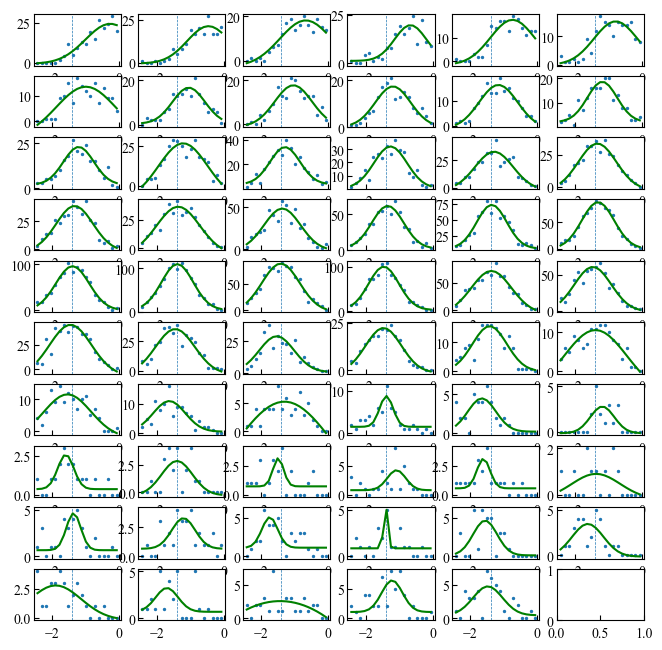

In [604]:
nr = 10
nc = 6

fig, ax = plt.subplots(nrows=nr, ncols=nc, figsize=utils.cm2inch(20, 20))

# ax.set_yscale('log')

# popts_8000 = []
# popts_norm_8000 = []
# perrs_8000 = []

# noise_2d_gauss_8000 = []
# noise_2d_gauss_norm_8000 = []

for i in range(slope_hist_2d_pc4_gr1.shape[1]):
    # ax[i//nc, i%nc].set_xscale('log')
    ax[i//nc, i%nc].axvline(-1.4, ls='--', lw=0.5)
    max_val = max(slope_hist_2d_pc4_gr1[:, i])
    # max_val_at = ymiddle[slope_hist_2d_pc4_gr2[:, i] == max_val][0]
    # print(max_val_at)
    
    ax[i//nc, i%nc].scatter(ymiddle, slope_hist_2d_pc4_gr2[:, i], s=2)

    ax[i//nc, i%nc].plot(ymiddle, igor_gaussian_fun(ymiddle, *slope_popts_pc4_gr2[i]), c='g')
    
    # y_resolution = np.linspace(np.log10(ymiddle[0]), np.log10(ymiddle[-1]), num=100)
    # ax.plot(10**y_resolution, igor_gaussian_fun(y_resolution, *popts[-1]))

In [465]:
ymiddle.shape

(39,)

In [360]:
psds_pc4_gr1 = np.array(psds_pc4_gr1)
areas_pc4_gr1 = np.array(areas_pc4_gr1)

In [418]:
def cut_range(arr, which_range=(2000, 5000)):
    return np.bitwise_and(arr > which_range[0], arr < which_range[1])

def my_line(x, a, b):
    return a*x + b

def fit_psd(freq, psd, fit_range=(2000, 5000)):
    popt, pcov = scipy.optimize.curve_fit(my_line,
                                          np.log10(freq[cut_range(freq, which_range=fit_range)]),
                                          np.log10(psd[cut_range(freq, which_range=fit_range)]))
    perr = np.sqrt(np.diag(pcov))  # standard deviation error

    return popt, perr

def calc_psd_fit(freq, fit_params, fit_errs, fit_range):
    return 10**my_line(np.log10(freq[cut_range(freq, which_range=fit_range)]), fit_params[0], fit_params[1])

In [401]:
psds_pc4_gr1[0][1][cut_range(fft_freqs, which_range=(2000, 5000))]

array([3.2130337e-11, 7.6432012e-12, 1.6523869e-11, 5.2556150e-11,
       4.5129605e-11, 2.1159864e-11, 1.8986932e-11, 1.8636688e-11,
       1.3915111e-11, 4.3289595e-12, 8.6456802e-13, 6.9906936e-12,
       6.8194790e-12, 4.2549519e-12, 1.8362458e-12], dtype=float32)

In [402]:
popt, perr = fit_psd(fft_freqs, psds_pc4_gr1[0][1], fit_range=(2000, 5000))
print(popt, perr)

[-3.02959338 -0.28738683] [0.90872789 3.21186581]


In [403]:
print(popt, perr)

[-3.02959338 -0.28738683] [0.90872789 3.21186581]


[-0.98681964 -7.74566015] [1.82569229 6.45284305]
[9.24987178e-12 8.48877884e-12 7.84406691e-12 7.29089447e-12
 6.81102564e-12 6.39077048e-12 6.01965091e-12 5.68951055e-12
 5.39390509e-12 5.12767530e-12 4.88664174e-12 4.66738259e-12
 4.46706936e-12 4.28334354e-12 4.11422286e-12]


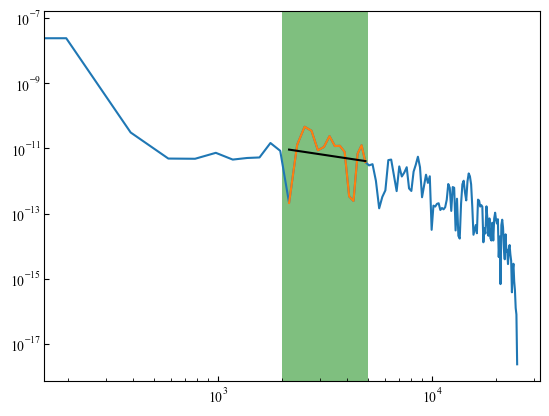

In [417]:
fig, ax = plt.subplots(1)

psd = psds_pc4_gr1[0][4]
my_range=(2000, 5000)

popt, perr = fit_psd(fft_freqs, psd, fit_range=my_range)
print(popt, perr)

fitted_line = 10**my_line(np.log10(fft_freqs[cut_range(fft_freqs, which_range=my_range)]), popt[0], popt[1])
print(fitted_line)

ax.plot(fft_freqs, psd)
ax.plot(fft_freqs[cut_range(fft_freqs, which_range=my_range)], psd[cut_range(fft_freqs, which_range=my_range)])
ax.plot(fft_freqs[cut_range(fft_freqs, which_range=my_range)],
        fitted_line, c='k')

ax.set_yscale('log')
ax.set_xscale('log')
ax.axvspan(xmin=my_range[0], xmax=my_range[1], ec=None, color='g', alpha=0.5)

In [387]:
10**utils.fit_func_lin(fft_freqs[cut_range(fft_freqs, which_range=(2000, 5000))], popt[0], popt[1])

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [362]:
for trace_psds in psds_pc4_gr1:
    for win_psd in trace_psds:
        
        

array([[5.4920726e-08, 2.4121592e-08, 1.8608491e-10, ..., 3.9917171e-16,
        5.8137933e-17, 2.7001364e-17],
       [5.8576205e-08, 3.1282131e-08, 7.4213267e-11, ..., 5.0051997e-16,
        3.7413623e-18, 1.1750600e-17],
       [5.9506366e-08, 3.0431178e-08, 1.1060198e-10, ..., 3.3809492e-16,
        6.0643622e-17, 5.6021853e-18],
       ...,
       [1.1058833e-08, 5.1735922e-09, 9.7862777e-12, ..., 3.7391761e-18,
        1.9582484e-18, 5.2468444e-19],
       [1.1356498e-08, 5.7791998e-09, 1.6822211e-12, ..., 6.8108943e-18,
        3.5879025e-18, 5.3475743e-20],
       [1.1862760e-08, 5.8835257e-09, 4.5379201e-13, ..., 1.5779981e-17,
        4.9357263e-18, 8.3684219e-19]], dtype=float32)

In [357]:
psds_pc4_gr1[7]

array([[3.4133336e-23, 1.7066665e-23, 4.8321648e-39, ..., 2.4355128e-39,
        2.0563315e-38, 0.0000000e+00],
       [3.4133336e-23, 1.7066665e-23, 4.8321648e-39, ..., 2.4355128e-39,
        2.0563315e-38, 0.0000000e+00],
       [3.4133336e-23, 1.7066665e-23, 4.8321648e-39, ..., 2.4355128e-39,
        2.0563315e-38, 0.0000000e+00],
       ...,
       [5.8804237e-09, 2.7540299e-09, 1.9806400e-12, ..., 7.8750407e-18,
        5.3420085e-18, 1.2032043e-19],
       [5.8904863e-09, 2.9719234e-09, 3.5805428e-11, ..., 4.6328644e-19,
        1.0634781e-18, 1.8411314e-18],
       [5.8969838e-09, 3.0471707e-09, 3.5178100e-11, ..., 9.5942512e-18,
        6.9333601e-18, 2.7428176e-18]], dtype=float32)

In [359]:
areas_pc4_gr1[7]

array([-1.00000000e-10, -1.00000000e-10, -1.00000000e-10,  1.13468002e-08,
        1.02456379e-08,  3.19670918e-08,  7.89548825e-08,  4.64145637e-08,
       -1.00000000e-10, -1.00000000e-10,  1.09311952e-09,  1.50697475e-09,
        2.70778516e-09,  3.04974345e-09,  1.96927398e-09,  8.46010928e-09,
        1.54598556e-08, -1.00000000e-10,  8.75366534e-09, -1.00000000e-10,
        1.81022077e-09,  7.03009000e-10,  1.31004985e-09, -1.00000000e-10,
       -1.00000000e-10, -1.00000000e-10, -1.00000000e-10,  1.01887650e-10,
        1.08020409e-10, -1.00000000e-10,  3.36136614e-11,  3.86283173e-11,
        1.92398693e-09,  3.32681935e-09,  1.41246751e-09,  2.08523808e-09,
        2.71813896e-09,  3.30361554e-09,  3.59725114e-09,  1.88471975e-09,
        2.18380571e-09,  1.90061673e-09])

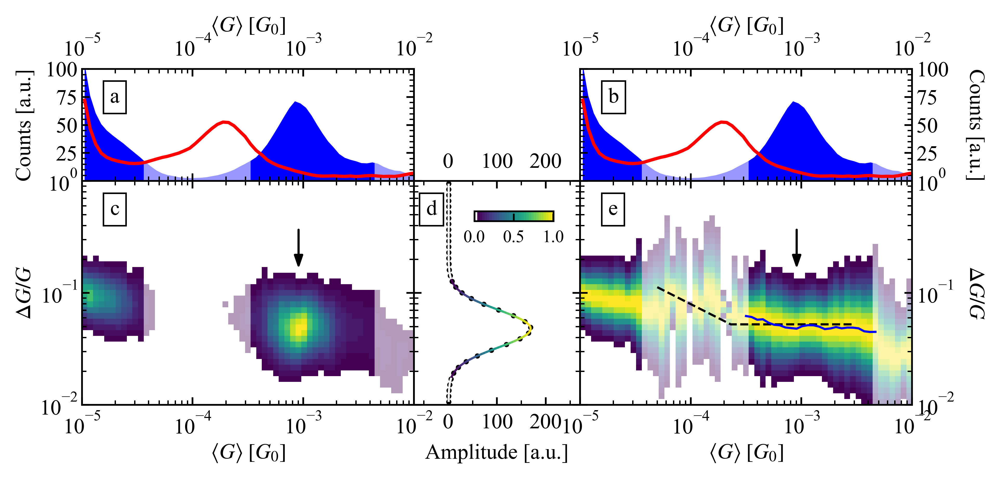

In [312]:
hist_1d_gr1 = pc.hist_group1['PC4']
hist_1d_gr2 = pc.hist_group2['PC4']

hist_2d = noise_2d_gauss_pc4_gr1
hist_2d_norm = noise_2d_gauss_norm_pc4_gr1

popts = popts_pc4_gr1
gauss_fit_mean = gauss_fit_mean_pc4_gr1

figsize=utils.cm2inch(16, 7.5)
dpi=600
# smoothing=5
# cmap='Blues'

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 3, figure=fig,
                  left=0.075, right=0.92, top=0.87, bottom=0.14, width_ratios=(2, 1, 2), height_ratios=(1, 2),
                  hspace=0, wspace=0)

ax_1d_1 = fig.add_subplot(gs[0, 0], sharex=ax_2d)
ax_1d_2 = fig.add_subplot(gs[0, 2], sharex=ax_2d_norm, sharey=ax_1d_1)

ax_2d = fig.add_subplot(gs[1, 0])
ax_gauss = fig.add_subplot(gs[1, 1], sharey=ax_2d)
ax_2d_norm = fig.add_subplot(gs[1, 2], sharey=ax_2d)

ax_2d.set_xscale('log')
ax_2d.set_yscale('log')

ax_2d_norm.set_xscale('log')
ax_2d_norm.set_yscale('log')

ax_gauss.set_yscale('log')

# plot 1D histograms

ax_1d_1.fill_between(hist_1d_gr1.hist_1d_bins, np.zeros_like(hist_1d_gr1.hist_1d_pull), hist_1d_gr1.hist_1d_pull, color='blue', ec='None')
ax_1d_2.fill_between(hist_1d_gr1.hist_1d_bins, np.zeros_like(hist_1d_gr1.hist_1d_pull), hist_1d_gr1.hist_1d_pull, color='blue', ec='None')
ax_1d_1.plot(hist_1d_gr2.hist_1d_bins, hist_1d_gr2.hist_1d_pull, color='r')
ax_1d_2.plot(hist_1d_gr2.hist_1d_bins, hist_1d_gr2.hist_1d_pull, color='r')

ax_1d_1.set_xlim(1e-5, 1e-2)
ax_1d_2.set_xlim(1e-5, 1e-2)
ax_1d_1.set_ylim(0, 100)
ax_1d_2.set_ylim(0, 100)

ax_2d.set_ylim(1e-2, 1)
ax_2d_norm.set_ylim(1e-2, 1)
ax_gauss.set_ylim(1e-2, 1)

# Plot Gaussian
# Select which slice is plotted in ax_gauss

which = 38  # -4

ax_gauss.scatter(hist_2d[:, which], ymiddle, s=2, c='k')

perc=60

norm1 = plt.Normalize(np.percentile(noise_2d_gauss_norm_pc4_gr1, perc),
                      igor_gaussian_fun(ymiddle_log_res, *popts_norm[which]).max())

ymiddle_log_res = np.linspace(ymiddle_log.min(), ymiddle_log.max(), num=200)

points2 = np.array([igor_gaussian_fun(ymiddle_log_res, *popts[which]), 10**ymiddle_log_res]).T.reshape(-1, 1, 2)
segments2 = np.concatenate([points2[:-1], points2[1:]], axis=1)
norm2 = plt.Normalize(igor_gaussian_fun(ymiddle_log_res, *popts[which]).min(),
                      igor_gaussian_fun(ymiddle_log_res, *popts[which]).max())
lc2 = LineCollection(segments2, cmap=my_cmap_opaque, norm=norm2)
lc2.set_array(igor_gaussian_fun(ymiddle_log_res, *popts[which]))
lc2.set_linewidth(1)
line2 = ax_gauss.add_collection(lc2)

# Plot 2D histograms

noise_x, noise_expectation = calc_expected_noise(conductance_range=(5e-5, 3e-3), break_point=2e-4, logy_shift=-3.1, num_points=50)
ax_2d_norm.plot(noise_x, noise_expectation, c='k', lw=1, ls='--')

im = ax_2d.pcolormesh(x_mesh, y_mesh, hist_2d, cmap=my_cmap)
im_norm = ax_2d_norm.pcolormesh(x_mesh, y_mesh, hist_2d_norm, cmap=my_cmap)
# ax_2d_norm.plot(xmiddle, gauss_fit_mean, c='skyblue', alpha=1, lw=1)
ax_2d_norm.plot(xmiddle[np.bitwise_and(xmiddle>3e-4, xmiddle<5e-3)],
                gauss_fit_mean[np.bitwise_and(xmiddle>3e-4, xmiddle<5e-3)], c='blue', alpha=1, lw=1)
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]-1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]+1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.fill_between(xmiddle, 10**(popts[:, 2]-0.5*abs(popts[:, 3])), 10**(popts[:, 2]+0.5*abs(popts[:, 3])), color='white', alpha=0.4, lw=1, ec='None')

# noise_x_2, noise_expectation_2 = calc_expected_noise(conductance_range=(8e-5, 3e-3), break_point=4.5e-4, logy_shift=-2.95, num_points=50)
# ax_2d_norm.plot(noise_x_2, noise_expectation_2, c='r', lw=1, ls='--')


# Tick settings
ax_1d_1.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax_1d_2.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax_2d_norm.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=True)
ax_gauss.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                     labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_2d.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))
ax_2d_norm.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d_norm.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))


# Add annotation

ax_2d.annotate("",
               xy=(xmiddle[which], 1.5e-1), xycoords=ax_2d.transData,
               xytext=(xmiddle[which], 4e-1), textcoords=ax_2d.transData,
               arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_2d_norm.annotate("",
                    xy=(xmiddle[which], 1.5e-1), xycoords=ax_2d_norm.transData,
                    xytext=(xmiddle[which], 4e-1), textcoords=ax_2d_norm.transData,
                    arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_1d_1.xaxis.set_label_position('top')
ax_1d_2.xaxis.set_label_position('top')
ax_1d_2.yaxis.set_label_position('right')
ax_1d_1.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_2.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_1.set_yticks([25, 50, 75, 100])
ax_1d_2.set_yticks([25, 50, 75, 100])

ax_1d_1.set_ylabel('Counts [a.u.]')
ax_1d_2.set_ylabel('Counts [a.u.]', rotation=270, labelpad=14)
ax_gauss.set_xlabel('Amplitude [a.u.]', labelpad=5)
ax_2d.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d.set_ylabel(r'$\frac{\Delta G}{G}$')
ax_2d.set_ylabel(r'$\Delta G / G$')
ax_2d_norm.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d_norm.set_ylabel(r'$\frac{\Delta G}{G}$', rotation=270, labelpad=15)
ax_2d_norm.set_ylabel(r'$\Delta G / G$', rotation=270, labelpad=14)
ax_2d_norm.yaxis.set_label_position('right')

# bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
# label_x = {ax_2d: 1.5e-5, ax_gauss: -35, ax_2d_norm: 1.5e-5}
# for ax, i in zip((ax_2d, ax_gauss, ax_2d_norm), ('a', 'b', 'c')):
#     ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
#     ax.text(s=i, x=label_x[ax], y=5e-1, fontsize=8, bbox=bbox_props)
#     # plt.setp(ax.get_xticklabels(), rotation=270)

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
label_x = {ax_1d_1: 1.8e-5, ax_1d_2: 1.8e-5, ax_2d: 1.8e-5, ax_gauss: -45, ax_2d_norm: 1.8e-5}
label_y = {ax_1d_1: 70, ax_1d_2: 70, ax_2d: 5e-1, ax_gauss: 5e-1, ax_2d_norm: 5e-1} # 
for ax, i in zip((ax_1d_1, ax_1d_2, ax_2d, ax_gauss, ax_2d_norm), ('a', 'b', 'c', 'd', 'e')):
    ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
    ax.text(s=i, x=label_x[ax], y=label_y[ax], fontsize=10, bbox=bbox_props)
    
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

cbbox = inset_axes(ax_gauss, '70%', '22%', loc = 'upper left', bbox_to_anchor=(0.28,0,0.8,1), bbox_transform=ax_gauss.transAxes)
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

cbaxes = inset_axes(cbbox, '85%', '20%', loc = 'upper right')

cb=fig.colorbar(lc2, cax=cbaxes, orientation='horizontal') #make colorbar
cbaxes.set_xticks(np.linspace(start=0, stop=hist_2d[:, which].max(), num=3))
cbaxes.set_xticklabels(np.linspace(start=0, stop=1, num=3), fontsize=8)

ax_gauss.set_xlim(-70, 270)
ax_gauss.set_xticks((0, 100, 200))

# where we have less points in a vertical bin than half of the average, draw a box over
avg = np.mean(np.sum(hist_2d, axis=0))
np.where(np.sum(hist_2d, axis=0)<avg/2)[0]+1

for i, j in zip(np.where(np.sum(hist_2d, axis=0)<avg/2)[0], np.where(np.sum(hist_2d, axis=0)<avg/2)[0]+1):
    ax_1d_1.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_1d_2.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d_norm.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)

ax_1d_1.yaxis.set_minor_locator(MultipleLocator(5))
ax_gauss.xaxis.set_minor_locator(MultipleLocator(50))

fig.align_ylabels([ax_1d_1, ax_2d])
fig.align_ylabels([ax_1d_2, ax_2d_norm])

# ax_1d_2.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_1d_2.axvline(2e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm.axvline(2e-4, ls='--', lw=0.7, c='k')

# ax_gauss.axvline(max(igor_gaussian_fun(ymiddle_log_res, *popts[which]))/2, ls='--', c='k', lw=1)

plt.savefig(home_folder.joinpath(f'results/noise/bpy_8000_relative_noise_gauss_w_1d_hist_pc4_gr1_w_box.png'))

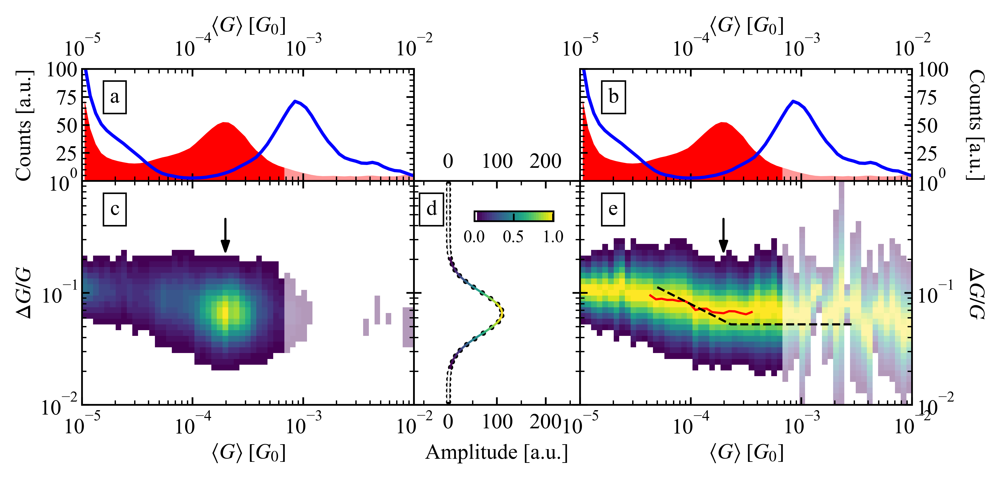

In [313]:
hist_1d_gr1 = pc.hist_group1['PC4']
hist_1d_gr2 = pc.hist_group2['PC4']

hist_2d = noise_2d_gauss_pc4_gr2
hist_2d_norm = noise_2d_gauss_norm_pc4_gr2

popts = popts_pc4_gr2
gauss_fit_mean = gauss_fit_mean_pc4_gr2

figsize=utils.cm2inch(16, 7.5)
dpi=600

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 3, figure=fig,
                  left=0.075, right=0.92, top=0.87, bottom=0.14, width_ratios=(2, 1, 2), height_ratios=(1, 2),
                  hspace=0, wspace=0)

ax_1d_1 = fig.add_subplot(gs[0, 0], sharex=ax_2d)
ax_1d_2 = fig.add_subplot(gs[0, 2], sharex=ax_2d_norm, sharey=ax_1d_1)

ax_2d = fig.add_subplot(gs[1, 0])
ax_gauss = fig.add_subplot(gs[1, 1], sharey=ax_2d)
ax_2d_norm = fig.add_subplot(gs[1, 2], sharey=ax_2d)
# ax_gauss_norm = fig.add_subplot(gs[1, 1])

ax_2d.set_xscale('log')
ax_2d.set_yscale('log')

ax_2d_norm.set_xscale('log')
ax_2d_norm.set_yscale('log')

ax_gauss.set_yscale('log')

# plot 1D histograms

# ax_1d_1.fill_between(hist_bpy_8000.hist_1d_bins, np.zeros_like(hist_bpy_8000.hist_1d_pull), hist_bpy_8000.hist_1d_pull, color='cornflowerblue', ec='None')
# ax_1d_2.fill_between(hist_bpy_8000.hist_1d_bins, np.zeros_like(hist_bpy_8000.hist_1d_pull), hist_bpy_8000.hist_1d_pull, color='cornflowerblue', ec='None')
ax_1d_1.fill_between(hist_1d_gr2.hist_1d_bins, np.zeros_like(hist_1d_gr2.hist_1d_pull), hist_1d_gr2.hist_1d_pull, color='r', ec='None')
ax_1d_2.fill_between(hist_1d_gr2.hist_1d_bins, np.zeros_like(hist_1d_gr2.hist_1d_pull), hist_1d_gr2.hist_1d_pull, color='r', ec='None')
ax_1d_1.plot(hist_1d_gr1.hist_1d_bins, hist_1d_gr1.hist_1d_pull, color='blue')
ax_1d_2.plot(hist_1d_gr1.hist_1d_bins, hist_1d_gr1.hist_1d_pull, color='blue')
# ax_1d_1.plot(hist_1d_gr2.hist_1d_bins, hist_1d_gr2.hist_1d_pull, color='red')
# ax_1d_2.plot(hist_1d_gr2.hist_1d_bins, hist_1d_gr2.hist_1d_pull, color='red')

ax_1d_1.set_xlim(1e-5, 1e-2)
ax_1d_2.set_xlim(1e-5, 1e-2)
ax_1d_1.set_ylim(0, 100)
ax_1d_2.set_ylim(0, 100)

ax_2d.set_ylim(1e-2, 1)
ax_2d_norm.set_ylim(1e-2, 1)
ax_gauss.set_ylim(1e-2, 1)

# Plot Gaussian
# Select which slice is plotted in ax_gauss

which = 25  # -4

ax_gauss.scatter(hist_2d[:, which], ymiddle, s=2, c='k')
# ax_gauss.scatter(noise_2d_gauss_norm[:, which], ymiddle, s=2, c='k')
# plot fit with colorscale line
# print(ymiddle_log.min(), ymiddle_log.max())
# print(ymiddle.min(), ymiddle.max())

ymiddle_log_res = np.linspace(ymiddle_log.min(), ymiddle_log.max(), num=200)

points2 = np.array([igor_gaussian_fun(ymiddle_log_res, *popts[which]), 10**ymiddle_log_res]).T.reshape(-1, 1, 2)
segments2 = np.concatenate([points2[:-1], points2[1:]], axis=1)
norm2 = plt.Normalize(igor_gaussian_fun(ymiddle_log_res, *popts[which]).min(),
                      igor_gaussian_fun(ymiddle_log_res, *popts[which]).max())
lc2 = LineCollection(segments2, cmap=my_cmap_opaque, norm=norm2)
lc2.set_array(igor_gaussian_fun(ymiddle_log_res, *popts[which]))
lc2.set_linewidth(1)
line2 = ax_gauss.add_collection(lc2)

# Plot 2D histograms

im = ax_2d.pcolormesh(x_mesh, y_mesh, hist_2d, cmap=my_cmap)
im_norm = ax_2d_norm.pcolormesh(x_mesh, y_mesh, hist_2d_norm, cmap=my_cmap)
ax_2d_norm.plot(xmiddle[np.bitwise_and(xmiddle>4e-5, xmiddle<4e-4)],
                gauss_fit_mean[np.bitwise_and(xmiddle>4e-5, xmiddle<4e-4)], c='r', alpha=1, lw=1)
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]-1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.plot(xmiddle, 10**(popts[:, 2]+1.17*0.5*abs(popts[:, 3])), c='white', alpha=1, lw=1, ls='--')
# ax_2d_norm.fill_between(xmiddle, 10**(popts[:, 2]-0.5*abs(popts[:, 3])), 10**(popts[:, 2]+0.5*abs(popts[:, 3])), color='white', alpha=0.4, lw=1, ec='None')

noise_x, noise_expectation = calc_expected_noise(conductance_range=(5e-5, 3e-3), break_point=2e-4, logy_shift=-3.1, num_points=50)
ax_2d_norm.plot(noise_x, noise_expectation, c='k', lw=1, ls='--')

# noise_x_2, noise_expectation_2 = calc_expected_noise(conductance_range=(8e-5, 3e-3), break_point=4.5e-4, logy_shift=-2.95, num_points=50)
# ax_2d_norm.plot(noise_x_2, noise_expectation_2, c='r', lw=1, ls='--')


# Tick settings
ax_1d_1.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax_1d_2.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax_2d.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax_2d_norm.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=True)
ax_gauss.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                     labelleft=False, labelright=False, labeltop=True, labelbottom=True)

ax_2d.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))
ax_2d_norm.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d_norm.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))


# Add annotation

ax_2d.annotate("",
               xy=(xmiddle[which], 2e-1), xycoords=ax_2d.transData,
               xytext=(xmiddle[which], 5e-1), textcoords=ax_2d.transData,
               arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_2d_norm.annotate("",
                    xy=(xmiddle[which], 2e-1), xycoords=ax_2d_norm.transData,
                    xytext=(xmiddle[which], 5e-1), textcoords=ax_2d_norm.transData,
                    arrowprops=dict(arrowstyle="-|>,head_length=0.35,head_width=0.12", color='k'))

ax_1d_1.xaxis.set_label_position('top')
ax_1d_2.xaxis.set_label_position('top')
ax_1d_2.yaxis.set_label_position('right')
ax_1d_1.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_2.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_1.set_yticks([25, 50, 75, 100])
ax_1d_2.set_yticks([25, 50, 75, 100])

ax_1d_1.set_ylabel('Counts [a.u.]')
ax_1d_2.set_ylabel('Counts [a.u.]', rotation=270, labelpad=14)
ax_gauss.set_xlabel('Amplitude [a.u.]', labelpad=5)
ax_2d.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d.set_ylabel(r'$\frac{\Delta G}{G}$')
ax_2d.set_ylabel(r'$\Delta G / G$')
ax_2d_norm.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
# ax_2d_norm.set_ylabel(r'$\frac{\Delta G}{G}$', rotation=270, labelpad=15)
ax_2d_norm.set_ylabel(r'$\Delta G / G$', rotation=270, labelpad=14)
ax_2d_norm.yaxis.set_label_position('right')

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
label_x = {ax_1d_1: 1.8e-5, ax_1d_2: 1.8e-5, ax_2d: 1.8e-5, ax_gauss: -45, ax_2d_norm: 1.8e-5}
label_y = {ax_1d_1: 70, ax_1d_2: 70, ax_2d: 5e-1, ax_gauss: 5e-1, ax_2d_norm: 5e-1} # 
for ax, i in zip((ax_1d_1, ax_1d_2, ax_2d, ax_gauss, ax_2d_norm), ('a', 'b', 'c', 'd', 'e')):
    ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
    ax.text(s=i, x=label_x[ax], y=label_y[ax], fontsize=10, bbox=bbox_props)
    
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

cbbox = inset_axes(ax_gauss, '70%', '22%', loc = 'upper left', bbox_to_anchor=(0.28,0,0.8,1), bbox_transform=ax_gauss.transAxes)
[cbbox.spines[k].set_visible(False) for k in cbbox.spines]
cbbox.tick_params(axis='both', left=False, top=False, right=False, bottom=False, labelleft=False, labeltop=False, labelright=False, labelbottom=False)
cbbox.set_facecolor([1,1,1,0.7])

cbaxes = inset_axes(cbbox, '85%', '20%', loc = 'upper right')

cb=fig.colorbar(lc2, cax=cbaxes, orientation='horizontal') #make colorbar
cbaxes.set_xticks(np.linspace(start=0, stop=hist_2d[:, which].max(), num=3))
cbaxes.set_xticklabels(np.linspace(start=0, stop=1, num=3), fontsize=8)

ax_gauss.set_xlim(-70, 270)
ax_gauss.set_xticks((0, 100, 200))

# where we have less points in a vertical bin than half of the average, draw a box over
avg = np.mean(np.sum(hist_2d, axis=0))
np.where(np.sum(hist_2d, axis=0)<avg/2)[0]+1

for i, j in zip(np.where(np.sum(hist_2d, axis=0)<avg/2)[0], np.where(np.sum(hist_2d, axis=0)<avg/2)[0]+1):
    ax_1d_1.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_1d_2.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d_norm.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)

ax_1d_1.yaxis.set_minor_locator(MultipleLocator(5))
ax_gauss.xaxis.set_minor_locator(MultipleLocator(50))

fig.align_ylabels([ax_1d_1, ax_2d])
fig.align_ylabels([ax_1d_2, ax_2d_norm])

# ax_1d_2.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_1d_2.axvline(2e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm.axvline(2e-4, ls='--', lw=0.7, c='k')

# ax_gauss.axvline(max(igor_gaussian_fun(ymiddle_log_res, *popts[which]))/2, ls='--', c='k', lw=1)

plt.savefig(home_folder.joinpath(f'results/noise/bpy_8000_relative_noise_gauss_w_1d_hist_pc4_gr2_w_box.png'), bbox_inches='tight')

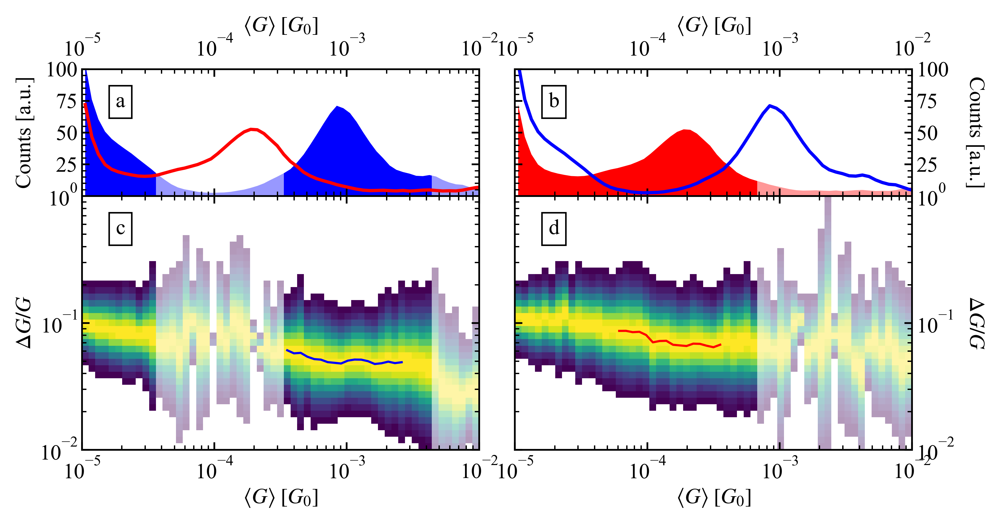

In [335]:
figsize=utils.cm2inch(16, 8.5)

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 2, figure=fig,
                  left=0.075, right=0.92, top=0.87, bottom=0.14, width_ratios=(2, 2), height_ratios=(1, 2),
                  hspace=0, wspace=0.09)

ax_2d_norm_gr1 = fig.add_subplot(gs[1, 0])
ax_2d_norm_gr2 = fig.add_subplot(gs[1, 1], sharey=ax_2d_norm_gr1)

ax_1d_1 = fig.add_subplot(gs[0, 0], sharex=ax_2d_norm_gr1)
ax_1d_2 = fig.add_subplot(gs[0, 1], sharex=ax_2d_norm_gr2, sharey=ax_1d_1)

ax_2d_norm_gr1.set_xscale('log')
ax_2d_norm_gr1.set_yscale('log')

ax_2d_norm_gr2.set_xscale('log')
ax_2d_norm_gr2.set_yscale('log')

# ax_1d_1.set_xlim(1e-5, 9.99e-3)
# ax_1d_2.set_xlim(1.01e-5, 1e-2)

ax_1d_1.set_xlim(1e-5, 1e-2)
ax_1d_2.set_xlim(1e-5, 1e-2)

ax_1d_1.set_ylim(0, 100)
ax_1d_2.set_ylim(0, 100)

ax_2d_norm_gr1.set_ylim(1e-2, 1)
ax_2d_norm_gr2.set_ylim(1e-2, 1)

ax_1d_1.fill_between(hist_1d_gr1.hist_1d_bins, np.zeros_like(hist_1d_gr1.hist_1d_pull), hist_1d_gr1.hist_1d_pull, color='b', ec='None')
ax_1d_2.fill_between(hist_1d_gr2.hist_1d_bins, np.zeros_like(hist_1d_gr2.hist_1d_pull), hist_1d_gr2.hist_1d_pull, color='r', ec='None')
ax_1d_1.plot(hist_1d_gr2.hist_1d_bins, hist_1d_gr2.hist_1d_pull, color='r')
ax_1d_2.plot(hist_1d_gr1.hist_1d_bins, hist_1d_gr1.hist_1d_pull, color='blue')

im_norm_gr1 = ax_2d_norm_gr1.pcolormesh(x_mesh, y_mesh, noise_2d_gauss_norm_pc4_gr1, cmap=my_cmap)
ax_2d_norm_gr1.plot(xmiddle[np.bitwise_and(xmiddle>3.3e-4, xmiddle<2.8e-3)],
                    gauss_fit_mean_pc4_gr1[np.bitwise_and(xmiddle>3.3e-4, xmiddle<2.8e-3)], c='b', alpha=1, lw=1)

im_norm_gr2 = ax_2d_norm_gr2.pcolormesh(x_mesh, y_mesh, noise_2d_gauss_norm_pc4_gr2, cmap=my_cmap)
ax_2d_norm_gr2.plot(xmiddle[np.bitwise_and(xmiddle>5.8e-5, xmiddle<3.7e-4)],
                    gauss_fit_mean_pc4_gr2[np.bitwise_and(xmiddle>5.8e-5, xmiddle<3.7e-4)], c='r', alpha=1, lw=1)

# Tick settings
ax_1d_1.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax_1d_2.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax_2d_norm_gr1.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax_2d_norm_gr2.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=True)

ax_2d.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))
ax_2d_norm_gr1.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d_norm_gr2.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))

ax_1d_1.xaxis.set_label_position('top')
ax_1d_2.xaxis.set_label_position('top')
ax_1d_2.yaxis.set_label_position('right')
ax_1d_1.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_2.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_1.set_yticks([25, 50, 75, 100])
ax_1d_2.set_yticks([25, 50, 75, 100])

ax_1d_1.set_ylabel('Counts [a.u.]')
ax_1d_2.set_ylabel('Counts [a.u.]', rotation=270, labelpad=14)

ax_2d_norm_gr1.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_2d_norm_gr1.set_ylabel(r'$\Delta G / G$')
ax_2d_norm_gr2.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_2d_norm_gr2.set_ylabel(r'$\Delta G / G$', rotation=270, labelpad=14)
ax_2d_norm_gr2.yaxis.set_label_position('right')

# ax_1d_1.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm_gr1.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_1d_1.axvline(2e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm_gr1.axvline(2e-4, ls='--', lw=0.7, c='k')

# ax_1d_2.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm_gr2.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_1d_2.axvline(2e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm_gr2.axvline(2e-4, ls='--', lw=0.7, c='k')

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
label_x = {ax_1d_1: 1.8e-5, ax_1d_2: 1.8e-5, ax_2d_norm_gr1: 1.8e-5, ax_2d_norm_gr2: 1.8e-5}
label_y = {ax_1d_1: 70, ax_1d_2: 70, ax_2d_norm_gr1: 5e-1, ax_2d_norm_gr2: 5e-1} # 
for ax, i in zip((ax_1d_1, ax_1d_2, ax_2d_norm_gr1, ax_2d_norm_gr2), ('a', 'b', 'c', 'd')):
    ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
    ax.text(s=i, x=label_x[ax], y=label_y[ax], fontsize=10, bbox=bbox_props)

avg_gr1 = np.mean(np.sum(noise_2d_gauss_pc4_gr1, axis=0))
avg_gr2 = np.mean(np.sum(noise_2d_gauss_pc4_gr2, axis=0))

for i, j in zip(np.where(np.sum(noise_2d_gauss_pc4_gr1, axis=0)<avg_gr1/2)[0], np.where(np.sum(noise_2d_gauss_pc4_gr1, axis=0)<avg_gr1/2)[0]+1):
    ax_1d_1.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d_norm_gr1.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    
for i, j in zip(np.where(np.sum(noise_2d_gauss_pc4_gr2, axis=0)<avg_gr2/2)[0], np.where(np.sum(noise_2d_gauss_pc4_gr2, axis=0)<avg_gr2/2)[0]+1):
    ax_1d_2.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d_norm_gr2.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)

ax_1d_1.yaxis.set_minor_locator(MultipleLocator(5))
ax_gauss.xaxis.set_minor_locator(MultipleLocator(50))

fig.align_ylabels([ax_1d_1, ax_2d_norm_gr1])
fig.align_ylabels([ax_1d_2, ax_2d_norm_gr2])

plt.savefig(home_folder.joinpath(f'results/noise/bpy_8000_relative_noise_gauss_pc4_gr1-gr2_w_box.png'))

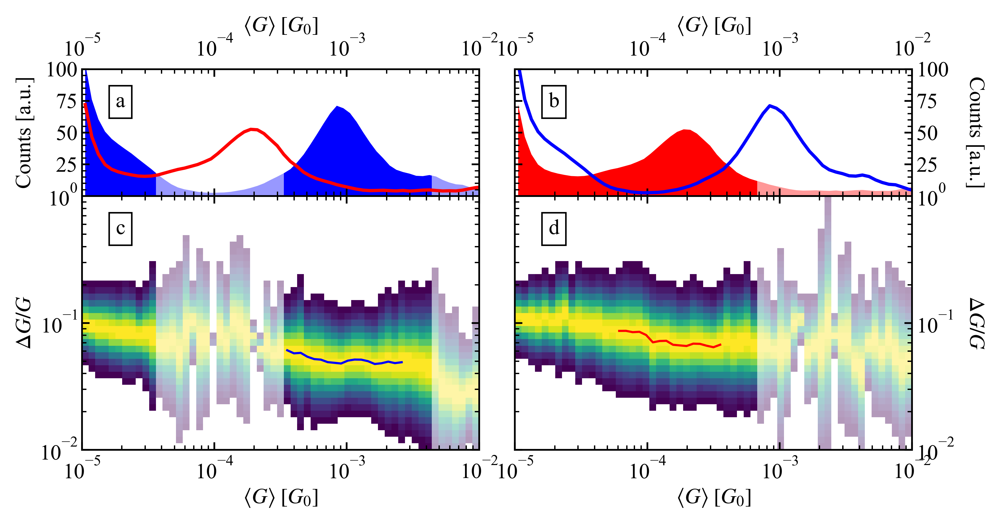

In [336]:
figsize=utils.cm2inch(16, 8.5)

fig = plt.figure(figsize=figsize, dpi=dpi)
gs = plt.GridSpec(2, 2, figure=fig,
                  left=0.075, right=0.92, top=0.87, bottom=0.14, width_ratios=(2, 2), height_ratios=(1, 2),
                  hspace=0, wspace=0.09)

ax_2d_norm_gr1 = fig.add_subplot(gs[1, 0])
ax_2d_norm_gr2 = fig.add_subplot(gs[1, 1], sharey=ax_2d_norm_gr1)

ax_1d_1 = fig.add_subplot(gs[0, 0], sharex=ax_2d_norm_gr1)
ax_1d_2 = fig.add_subplot(gs[0, 1], sharex=ax_2d_norm_gr2, sharey=ax_1d_1)

ax_2d_norm_gr1.set_xscale('log')
ax_2d_norm_gr1.set_yscale('log')

ax_2d_norm_gr2.set_xscale('log')
ax_2d_norm_gr2.set_yscale('log')

# ax_1d_1.set_xlim(1e-5, 9.99e-3)
# ax_1d_2.set_xlim(1.01e-5, 1e-2)

ax_1d_1.set_xlim(1e-5, 1e-2)
ax_1d_2.set_xlim(1e-5, 1e-2)

ax_1d_1.set_ylim(0, 100)
ax_1d_2.set_ylim(0, 100)

ax_2d_norm_gr1.set_ylim(1e-2, 1)
ax_2d_norm_gr2.set_ylim(1e-2, 1)

ax_1d_1.fill_between(hist_1d_gr1.hist_1d_bins, np.zeros_like(hist_1d_gr1.hist_1d_pull), hist_1d_gr1.hist_1d_pull, color='b', ec='None')
ax_1d_2.fill_between(hist_1d_gr2.hist_1d_bins, np.zeros_like(hist_1d_gr2.hist_1d_pull), hist_1d_gr2.hist_1d_pull, color='r', ec='None')
ax_1d_1.plot(hist_1d_gr2.hist_1d_bins, hist_1d_gr2.hist_1d_pull, color='r')
ax_1d_2.plot(hist_1d_gr1.hist_1d_bins, hist_1d_gr1.hist_1d_pull, color='blue')

im_norm_gr1 = ax_2d_norm_gr1.pcolormesh(x_mesh, y_mesh, noise_2d_gauss_norm_pc4_gr1, cmap=my_cmap)
ax_2d_norm_gr1.plot(xmiddle[np.bitwise_and(xmiddle>3.3e-4, xmiddle<2.8e-3)],
                    gauss_fit_mean_pc4_gr1[np.bitwise_and(xmiddle>3.3e-4, xmiddle<2.8e-3)], c='b', alpha=1, lw=1)

im_norm_gr2 = ax_2d_norm_gr2.pcolormesh(x_mesh, y_mesh, noise_2d_gauss_norm_pc4_gr2, cmap=my_cmap)
ax_2d_norm_gr2.plot(xmiddle[np.bitwise_and(xmiddle>5.8e-5, xmiddle<3.7e-4)],
                    gauss_fit_mean_pc4_gr2[np.bitwise_and(xmiddle>5.8e-5, xmiddle<3.7e-4)], c='r', alpha=1, lw=1)

# Tick settings
ax_1d_1.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=True, labelright=False, labeltop=True, labelbottom=False)
ax_1d_2.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                    labelleft=False, labelright=True, labeltop=True, labelbottom=False)
ax_2d_norm_gr1.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                  labelleft=True, labelright=False, labeltop=False, labelbottom=True)
ax_2d_norm_gr2.tick_params(which='both', left=True, right=True, top=True, bottom=True,
                       labelleft=False, labelright=True, labeltop=False, labelbottom=True)

ax_2d.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))
ax_2d_norm_gr1.xaxis.set_major_locator(LogLocator(base=10.0, subs=(1.0,), numticks=8))
ax_2d_norm_gr2.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(0, 1, 0.1), numticks=8))

ax_1d_1.xaxis.set_label_position('top')
ax_1d_2.xaxis.set_label_position('top')
ax_1d_2.yaxis.set_label_position('right')
ax_1d_1.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_2.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_1d_1.set_yticks([25, 50, 75, 100])
ax_1d_2.set_yticks([25, 50, 75, 100])

ax_1d_1.set_ylabel('Counts [a.u.]')
ax_1d_2.set_ylabel('Counts [a.u.]', rotation=270, labelpad=14)

ax_2d_norm_gr1.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_2d_norm_gr1.set_ylabel(r'$\Delta G / G$')
ax_2d_norm_gr2.set_xlabel(r'$\langle G \rangle\;[G_{0}]$')
ax_2d_norm_gr2.set_ylabel(r'$\Delta G / G$', rotation=270, labelpad=14)
ax_2d_norm_gr2.yaxis.set_label_position('right')

# ax_1d_1.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm_gr1.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_1d_1.axvline(2e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm_gr1.axvline(2e-4, ls='--', lw=0.7, c='k')

# ax_1d_2.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm_gr2.axvline(4.5e-4, ls='--', lw=0.7, c='k')
# ax_1d_2.axvline(2e-4, ls='--', lw=0.7, c='k')
# ax_2d_norm_gr2.axvline(2e-4, ls='--', lw=0.7, c='k')

bbox_props = dict(boxstyle="square", lw=0.7, fc="w", ec="black", alpha=1)
label_x = {ax_1d_1: 1.8e-5, ax_1d_2: 1.8e-5, ax_2d_norm_gr1: 1.8e-5, ax_2d_norm_gr2: 1.8e-5}
label_y = {ax_1d_1: 70, ax_1d_2: 70, ax_2d_norm_gr1: 5e-1, ax_2d_norm_gr2: 5e-1} # 
for ax, i in zip((ax_1d_1, ax_1d_2, ax_2d_norm_gr1, ax_2d_norm_gr2), ('a', 'b', 'c', 'd')):
    ax_width = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted()).width
    ax.text(s=i, x=label_x[ax], y=label_y[ax], fontsize=10, bbox=bbox_props)

avg_gr1 = np.mean(np.sum(noise_2d_gauss_pc4_gr1, axis=0))
avg_gr2 = np.mean(np.sum(noise_2d_gauss_pc4_gr2, axis=0))

for i, j in zip(np.where(np.sum(noise_2d_gauss_pc4_gr1, axis=0)<avg_gr1/2)[0], np.where(np.sum(noise_2d_gauss_pc4_gr1, axis=0)<avg_gr1/2)[0]+1):
    ax_1d_1.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d_norm_gr1.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    
for i, j in zip(np.where(np.sum(noise_2d_gauss_pc4_gr2, axis=0)<avg_gr2/2)[0], np.where(np.sum(noise_2d_gauss_pc4_gr2, axis=0)<avg_gr2/2)[0]+1):
    ax_1d_2.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)
    ax_2d_norm_gr2.axvspan(xmin=x_mesh[0, i], xmax=x_mesh[0, j], color='white', alpha=0.6, ec=None)

ax_1d_1.yaxis.set_minor_locator(MultipleLocator(5))
ax_gauss.xaxis.set_minor_locator(MultipleLocator(50))

fig.align_ylabels([ax_1d_1, ax_2d_norm_gr1])
fig.align_ylabels([ax_1d_2, ax_2d_norm_gr2])

# plt.savefig(home_folder.joinpath(f'results/noise/bpy_8000_relative_noise_gauss_pc4_gr1-gr2_w_box_w_insets.png'))

# I(V)